# <font color='red' style='font-size: 28px;'>SEMANA 2</font>
<hr style='border: 2px solid red;'>

# **Aprendizado 01** 
## O Que?
    O Objetivo inicial será avaliar o banco de dados - remover dados imprecisos e outliers.
    Criar um novo banco de dados que será utilizado para a criação dos modelos preditivos.
## Por Quê?
    Os dados imprecisos, ou mesmo inexistentes, bem como outliers, podem 'descalibrar' o modelo de previsão que será determinado mais adiante.
## Como?
    Utilizaremos métodos do pandas como 'info' e 'describe' para uma análise mais descritiva.
    Utilizaremos a vizualização de 'boxplots' e 'histogramas', do matplotlib ou seaborn, para entender um pouco melhor a distribuição
    Acompanharemos as correlações para ter certeza da relevância de cada característica, bem como ter a certeza de não distorcer as relações iniciais. 


## Importei algumas bibliotecas

In [104]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

### Importei o csv exportado da semana 1 - excluídos os dados nulos e vazios
Importei para um DataFrame AluraCash

In [105]:
AluraCash = pd.read_csv('DADOS_DO_SQL/TABELA_UNIFICADA_V2.csv') # Importanto o banco de dados
AluraCash.head(10) # Visualizando as linhas iniciais do banco

,IDADE,RENDA_ANUAL,MORADIA,TEMPO_DE_SERVICO,MOTIVO_EMPRESTIMO,SCORE_CREDITO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_INADIMPLENCIA,HISTORICO_DE_CREDITO
0,21,60000,alugada,2,educacao,B,8000,11.26,0,0.13,n,3
1,40,70000,hipoteca,6,educacao,A,18000,7.90,0,0.26,n,14
2,29,115000,hipoteca,3,saude,C,22000,15.23,0,0.19,s,7
3,26,84996,alugada,0,saude,B,9000,11.26,0,0.11,n,2
4,31,66000,alugada,11,reforma,B,10500,12.69,0,0.16,n,10
5,39,55000,alugada,0,saude,B,3000,10.20,0,0.05,n,15
6,23,24000,propria,7,educacao,A,5000,7.49,0,0.21,n,2
7,27,56253,alugada,11,empreendimento,B,10000,11.36,0,0.18,n,8
8,32,19200,alugada,0,empreendimento,B,5000,9.99,1,0.26,n,6
9,24,18000,propria,0,reforma,A,6250,6.54,1,0.35,n,4


In [106]:
AluraCash.info() # Verificando dados não nulos e tipos de dados

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28630 entries, 0 to 28629
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   IDADE                       28630 non-null  int64  
 1   RENDA_ANUAL                 28630 non-null  int64  
 2   MORADIA                     28630 non-null  object 
 3   TEMPO_DE_SERVICO            28630 non-null  int64  
 4   MOTIVO_EMPRESTIMO           28630 non-null  object 
 5   SCORE_CREDITO               28630 non-null  object 
 6   VALOR_EMPRESTIMO            28630 non-null  int64  
 7   TAXA_DE_JUROS               28630 non-null  float64
 8   SITUACAO_INADIMPLENCIA      28630 non-null  int64  
 9   COMPROMETIMENTO_DA_RENDA    28630 non-null  float64
 10  HISTORICO_DE_INADIMPLENCIA  28630 non-null  object 
 11  HISTORICO_DE_CREDITO        28630 non-null  int64  
dtypes: float64(2), int64(6), object(4)
memory usage: 2.6+ MB


In [107]:
AluraCash.describe().round(2) # Verificando o comportamento 'estatístico' das variáveis numéricas

,IDADE,RENDA_ANUAL,TEMPO_DE_SERVICO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_CREDITO
count,28630.00,28630.00,28630.00,28630.00,28630.00,28630.00,28630.00,28630.00
mean,27.72,66192.91,4.79,9658.01,11.04,0.22,0.17,5.79
std,6.27,48373.80,4.15,6329.77,3.23,0.41,0.11,4.04
min,20.00,4000.00,0.00,500.00,5.42,0.00,0.01,2.00
25%,23.00,39456.00,2.00,5000.00,7.90,0.00,0.09,3.00
50%,26.00,55872.50,4.00,8000.00,10.99,0.00,0.15,4.00
75%,30.00,80000.00,7.00,12500.00,13.48,0.00,0.23,8.00
max,144.00,1782000.00,123.00,35000.00,23.22,1.00,0.83,30.00


In [108]:
pd.DataFrame((AluraCash.mean(numeric_only=True)/AluraCash.median(numeric_only=True)).round(2)) #começando a avaliar simetria das variáveis numéricas

,0
IDADE,1.07
RENDA_ANUAL,1.18
TEMPO_DE_SERVICO,1.20
VALOR_EMPRESTIMO,1.21
TAXA_DE_JUROS,1.00
SITUACAO_INADIMPLENCIA,inf
COMPROMETIMENTO_DA_RENDA,1.13
HISTORICO_DE_CREDITO,1.45


Em todas as distribuições as Médias (mean) são maiores que as medianas (50%) o que pode ser sinal de assimetria, e pode exigir ajustes posteriormente.

# ESTRATÉGIA:
i - Com o DataFrame original:
 1. Verificar a correlação das variáveis com  SITUACAO_INADIMPLENCIA
 2. Observar o comportamento Histograma e Boxplot

ii - Eliminar os outliers (IIQ):
 1. Verificar a correlação das variáveis com  SITUACAO_INADIMPLENCIA
 2. Observar o comportamento Histograma e Boxplot

iii - Eliminar os outliers (Flexibilizados):
 1. Verificar a correlação das variáveis com  SITUACAO_INADIMPLENCIA
 2. Observar o comportamento Histograma e Boxplot

Comparar resultados;

iv - ajustar modelo.

# Passo i

In [211]:
corr_0 = (AluraCash.select_dtypes('number').corr().round(4)).SITUACAO_INADIMPLENCIA
pd.DataFrame(corr_0)

,SITUACAO_INADIMPLENCIA
IDADE,-0.0227
RENDA_ANUAL,-0.2506
TEMPO_DE_SERVICO,-0.0918
VALOR_EMPRESTIMO,0.1272
TAXA_DE_JUROS,0.3382
SITUACAO_INADIMPLENCIA,1.0000
COMPROMETIMENTO_DA_RENDA,0.3810
HISTORICO_DE_CREDITO,-0.0144


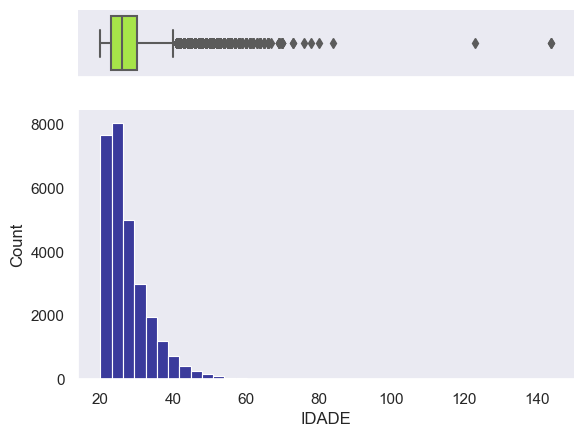

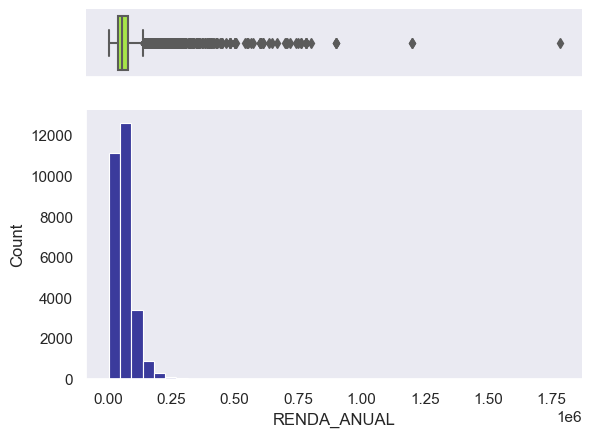

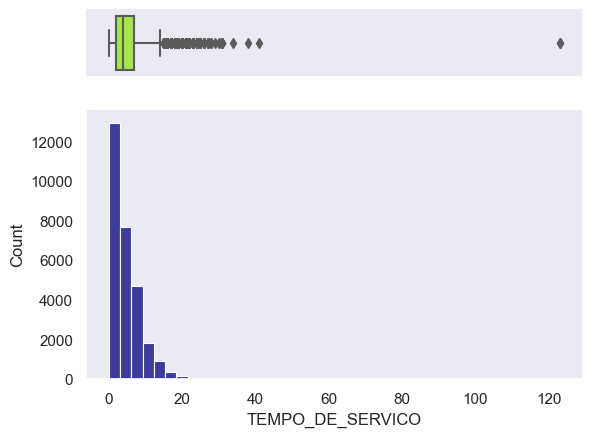

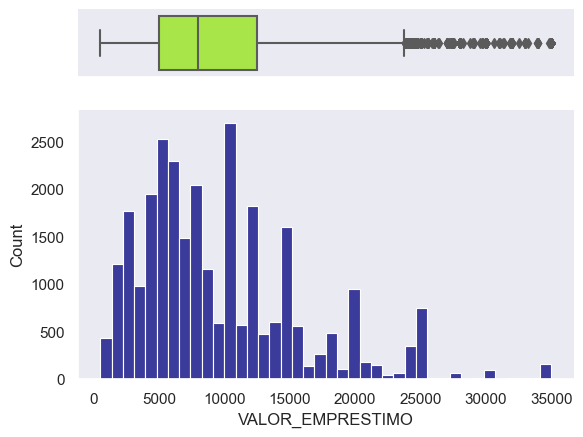

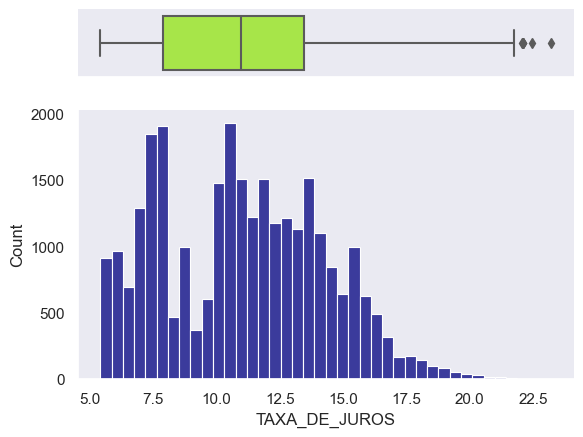

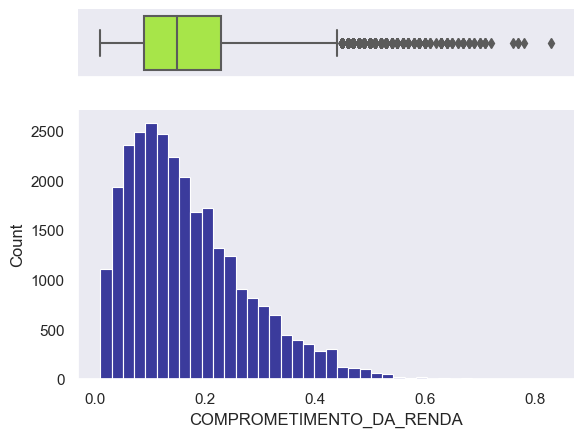

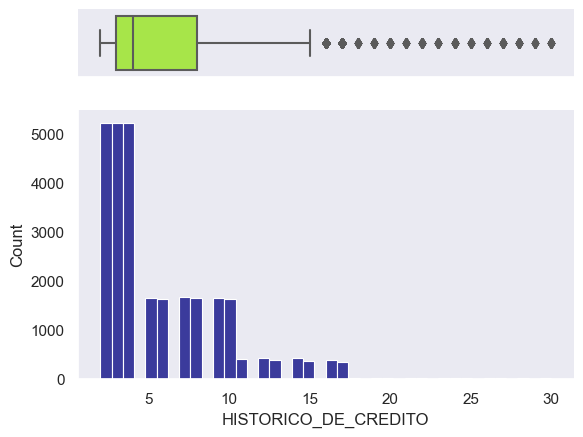

In [110]:
#Comparando Frequencia com BoxPlot para entender um pouco melhor os outliers
dados_numericos = AluraCash.describe().columns
for i in ([0,1,2,3,4,6,7]):
    sns.set(style="dark")
    x = AluraCash[dados_numericos[i]]

    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.20, .80)})

    sns.boxplot(data=x, ax=ax_box, orient='h', color='greenyellow')
    sns.histplot(data=x, ax=ax_hist, bins=40,  color='navy')

    ax_box.set(yticks=[])
    sns.despine(ax=ax_hist)
    sns.despine(ax=ax_box, left=True)    

In [111]:
valor_emprestimo = (AluraCash['VALOR_EMPRESTIMO']>=23750) & (AluraCash['VALOR_EMPRESTIMO']<=35000)
print('Analisando visualmente histogramas e boxplot percebemos que não há outliers "inferiores" e em quase todos o "Q3+1,5*IIQ" parece uma boa medida para a definição dos outliers, exceto no valor do emprestimo onde há um número considerável: {}. Que ficariam fora do estudo. Algumas outras variaveis também excluiriam dados que podem ser úteis por isso farei as vizualizações com a flexibilização do corte de outliers.'.format(len(AluraCash[valor_emprestimo])))

Analisando visualmente histogramas e boxplot percebemos que não há outliers "inferiores" e em quase todos o "Q3+1,5*IIQ" parece uma boa medida para a definição dos outliers, exceto no valor do emprestimo onde há um número considerável: 1487. Que ficariam fora do estudo. Algumas outras variaveis também excluiriam dados que podem ser úteis por isso farei as vizualizações com a flexibilização do corte de outliers.


# Passo ii

In [112]:
#Visualizar o limite de outliers, com base nos intervalos interquartis de cada variável
dados_numericos = AluraCash.describe().columns

for i in range(len(dados_numericos)):
    iiq = np.percentile(AluraCash[dados_numericos[i]],75)-np.percentile(AluraCash[dados_numericos[i]],25)
    iiq_inf = (np.percentile(AluraCash[dados_numericos[i]],25)-1.5*iiq).round(2)
    iiq_sup = (np.percentile(AluraCash[dados_numericos[i]],75)+1.5*iiq).round(2)
    print(dados_numericos[i] +' : '+ str(iiq_inf) +'->' + str(iiq_sup))

IDADE : 12.5->40.5
RENDA_ANUAL : -21360.0->140816.0
TEMPO_DE_SERVICO : -5.5->14.5
VALOR_EMPRESTIMO : -6250.0->23750.0
TAXA_DE_JUROS : -0.47->21.85
SITUACAO_INADIMPLENCIA : 0.0->0.0
COMPROMETIMENTO_DA_RENDA : -0.12->0.44
HISTORICO_DE_CREDITO : -4.5->15.5


In [113]:
#Redefinindo o DataFrame com a remoção dos outliers por Q3 + 1.5*IIQ
AluraCash_out1=AluraCash[~(
 (AluraCash.IDADE>(2.5*AluraCash.IDADE.quantile(0.75)-1.5*AluraCash.IDADE.quantile(0.25))) |
 (AluraCash.RENDA_ANUAL>(2.5*AluraCash.RENDA_ANUAL.quantile(0.75)-1.5*AluraCash.RENDA_ANUAL.quantile(0.25))) |
 (AluraCash.TEMPO_DE_SERVICO>(2.5*AluraCash.TEMPO_DE_SERVICO.quantile(0.75)-1.5*AluraCash.TEMPO_DE_SERVICO.quantile(0.25))) |
 (AluraCash.VALOR_EMPRESTIMO>(2.5*AluraCash.VALOR_EMPRESTIMO.quantile(0.75)-1.5*AluraCash.VALOR_EMPRESTIMO.quantile(0.25))) |
 (AluraCash.COMPROMETIMENTO_DA_RENDA>(2.5*AluraCash.COMPROMETIMENTO_DA_RENDA.quantile(0.75)-1.5*AluraCash.COMPROMETIMENTO_DA_RENDA.quantile(0.25))) |
 (AluraCash.HISTORICO_DE_CREDITO>(2.5*AluraCash.HISTORICO_DE_CREDITO.quantile(0.75)-1.5*AluraCash.HISTORICO_DE_CREDITO.quantile(0.25))))]
AluraCash_out1

,IDADE,RENDA_ANUAL,MORADIA,TEMPO_DE_SERVICO,MOTIVO_EMPRESTIMO,SCORE_CREDITO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_INADIMPLENCIA,HISTORICO_DE_CREDITO
0,21,60000,alugada,2,educacao,B,8000,11.26,0,0.13,n,3
1,40,70000,hipoteca,6,educacao,A,18000,7.90,0,0.26,n,14
2,29,115000,hipoteca,3,saude,C,22000,15.23,0,0.19,s,7
3,26,84996,alugada,0,saude,B,9000,11.26,0,0.11,n,2
4,31,66000,alugada,11,reforma,B,10500,12.69,0,0.16,n,10
...,...,...,...,...,...,...,...,...,...,...,...,...
28625,23,50000,alugada,3,educacao,B,10000,9.91,0,0.20,n,3
28626,30,60000,hipoteca,14,empreendimento,A,8000,7.51,0,0.13,n,10
28627,25,79000,propria,3,empreendimento,A,14000,6.92,0,0.18,n,2
28628,25,95004,propria,9,educacao,B,2800,9.91,0,0.03,n,3


In [114]:
AluraCash_out1.describe().round(2) # Verificando o novo comportamento 'estatístico' das variáveis numéricas

,IDADE,RENDA_ANUAL,TEMPO_DE_SERVICO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_CREDITO
count,23755.00,23755.00,23755.00,23755.00,23755.00,23755.00,23755.00,23755.00
mean,26.39,57978.72,4.35,8485.80,10.95,0.21,0.16,5.00
std,4.21,26557.60,3.37,4895.77,3.19,0.40,0.09,2.96
min,20.00,4080.00,0.00,500.00,5.42,0.00,0.01,2.00
25%,23.00,38000.00,2.00,5000.00,7.90,0.00,0.09,3.00
50%,25.00,53595.00,4.00,7500.00,10.99,0.00,0.14,4.00
75%,29.00,73590.00,7.00,12000.00,13.43,0.00,0.22,7.00
max,40.00,140304.00,14.00,23750.00,23.22,1.00,0.44,15.00


In [115]:
corr_1 = (AluraCash_out1.select_dtypes('number').corr().round(4)).SITUACAO_INADIMPLENCIA
pd.DataFrame(corr_1)

,SITUACAO_INADIMPLENCIA
IDADE,-0.0250
RENDA_ANUAL,-0.2596
TEMPO_DE_SERVICO,-0.0926
VALOR_EMPRESTIMO,0.0725
TAXA_DE_JUROS,0.3372
SITUACAO_INADIMPLENCIA,1.0000
COMPROMETIMENTO_DA_RENDA,0.3389
HISTORICO_DE_CREDITO,-0.0161


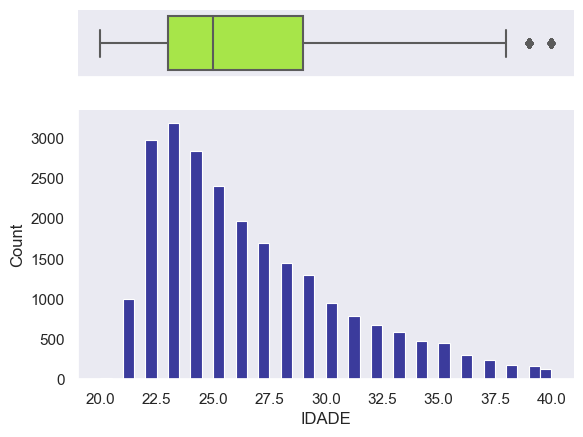

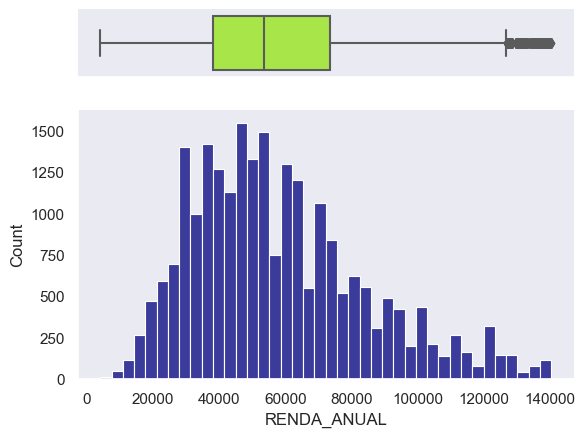

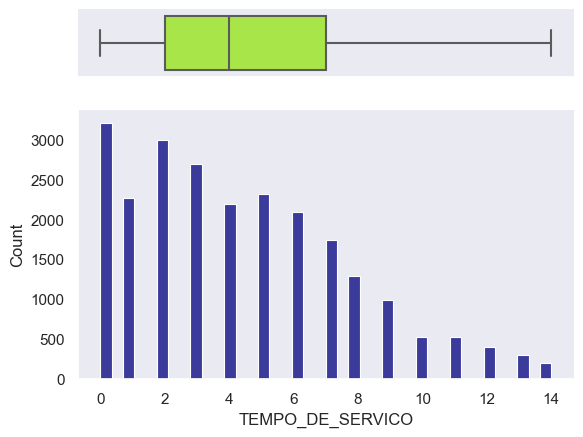

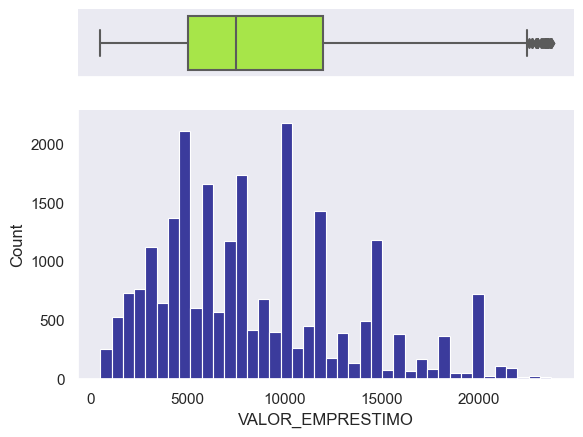

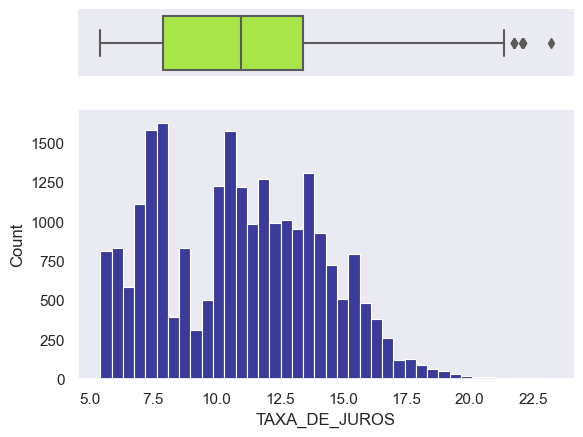

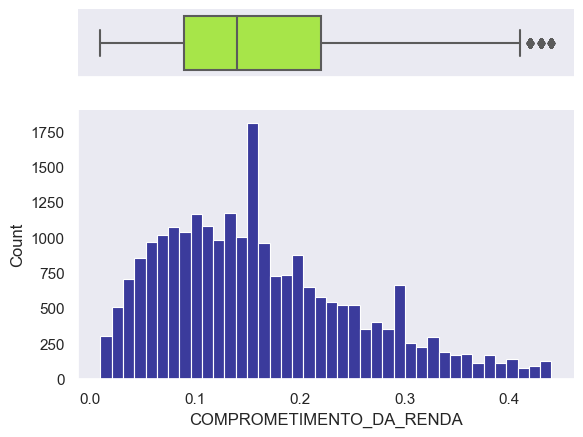

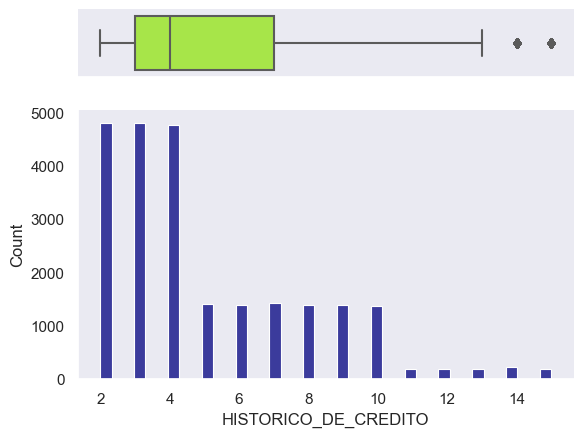

In [116]:
#Comparando Frequencia com BoxPlot para entender um pouco melhor os outliers
dados_numericos = AluraCash_out1.describe().columns
for i in ([0,1,2,3,4,6,7]):
    sns.set(style="dark")
    x = AluraCash_out1[dados_numericos[i]]

    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.20, .80)})

    sns.boxplot(data=x, ax=ax_box, orient='h', color='greenyellow')
    sns.histplot(data=x, ax=ax_hist, bins=40,  color='navy')

    ax_box.set(yticks=[])
    sns.despine(ax=ax_hist)
    sns.despine(ax=ax_box, left=True)    

# Passo iii

### Definição dos limites para outliers 2
IDADE: Abaixo de 60 anos

RENDA_ANUAL: Abaixo de 160.000

TEMPO_DE_SERVIÇO: Abaixo de 20 anos

VALOR_EMPRESTIMO : Abaixo de 35.000

TAXA_DE_JUROS : não utilizaremos outliers inicialmente

SITUACAO_INADIMPLENCIA : Será a Variável dependente

COMPROMETIMENTO_DA_RENDA : Abaixo de 0.50

HISTORICO_DE_CREDITO : Abaixo de 20 anos

In [117]:
#Redefinindo o DataFrame com a remoção dos outliers
#Vizualizando o que será removido
AluraCash[((AluraCash.IDADE>60) |
 (AluraCash.RENDA_ANUAL>160000) |
 (AluraCash.TEMPO_DE_SERVICO>20) |
 (AluraCash.VALOR_EMPRESTIMO>35000) |
 (AluraCash.COMPROMETIMENTO_DA_RENDA>0.5) |
 (AluraCash.HISTORICO_DE_CREDITO>20))]

,IDADE,RENDA_ANUAL,MORADIA,TEMPO_DE_SERVICO,MOTIVO_EMPRESTIMO,SCORE_CREDITO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_INADIMPLENCIA,HISTORICO_DE_CREDITO
35,25,191000,hipoteca,1,saude,B,10000,12.53,0,0.05,n,4
45,26,48000,alugada,2,educacao,B,25000,9.64,1,0.52,n,4
54,31,215000,hipoteca,2,saude,B,15000,10.99,0,0.07,n,10
64,27,12000,propria,0,educacao,D,8125,14.42,1,0.68,s,5
119,53,95000,propria,24,uso_pessoal,A,6000,5.42,0,0.06,n,30
...,...,...,...,...,...,...,...,...,...,...,...,...
28565,22,200000,hipoteca,6,quitacao_debitos,A,9000,6.17,0,0.04,n,4
28583,27,170496,hipoteca,3,quitacao_debitos,B,15000,11.83,1,0.09,n,10
28588,62,68375,alugada,4,saude,C,24250,12.73,1,0.35,n,28
28613,20,188004,hipoteca,4,educacao,A,2000,8.59,0,0.01,n,4


In [118]:
AluraCash_out2=AluraCash[~((AluraCash.IDADE>60) |
 (AluraCash.RENDA_ANUAL>160000) |
 (AluraCash.TEMPO_DE_SERVICO>20) |
 (AluraCash.VALOR_EMPRESTIMO>35000) |
 (AluraCash.COMPROMETIMENTO_DA_RENDA>0.5) |
 (AluraCash.HISTORICO_DE_CREDITO>20))]
AluraCash_out2

,IDADE,RENDA_ANUAL,MORADIA,TEMPO_DE_SERVICO,MOTIVO_EMPRESTIMO,SCORE_CREDITO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_INADIMPLENCIA,HISTORICO_DE_CREDITO
0,21,60000,alugada,2,educacao,B,8000,11.26,0,0.13,n,3
1,40,70000,hipoteca,6,educacao,A,18000,7.90,0,0.26,n,14
2,29,115000,hipoteca,3,saude,C,22000,15.23,0,0.19,s,7
3,26,84996,alugada,0,saude,B,9000,11.26,0,0.11,n,2
4,31,66000,alugada,11,reforma,B,10500,12.69,0,0.16,n,10
...,...,...,...,...,...,...,...,...,...,...,...,...
28625,23,50000,alugada,3,educacao,B,10000,9.91,0,0.20,n,3
28626,30,60000,hipoteca,14,empreendimento,A,8000,7.51,0,0.13,n,10
28627,25,79000,propria,3,empreendimento,A,14000,6.92,0,0.18,n,2
28628,25,95004,propria,9,educacao,B,2800,9.91,0,0.03,n,3


In [119]:
corr_2=(AluraCash_out2.select_dtypes('number').corr().round(4)).SITUACAO_INADIMPLENCIA
pd.DataFrame(corr_2)

,SITUACAO_INADIMPLENCIA
IDADE,-0.0235
RENDA_ANUAL,-0.2353
TEMPO_DE_SERVICO,-0.0906
VALOR_EMPRESTIMO,0.1122
TAXA_DE_JUROS,0.3428
SITUACAO_INADIMPLENCIA,1.0000
COMPROMETIMENTO_DA_RENDA,0.3652
HISTORICO_DE_CREDITO,-0.0169


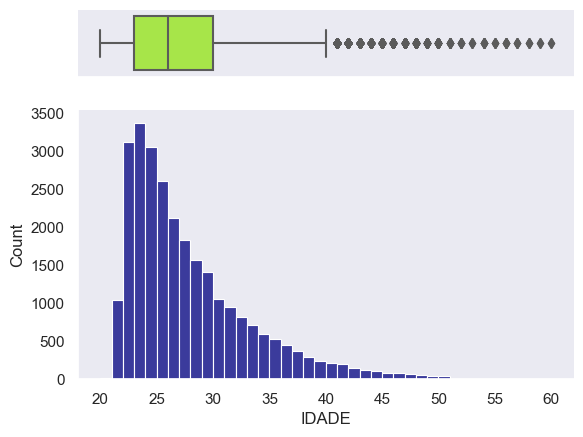

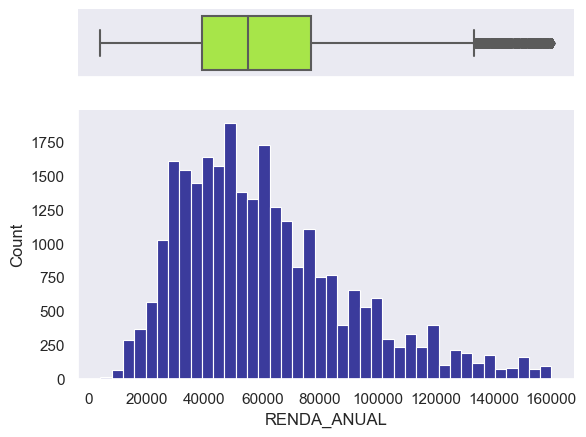

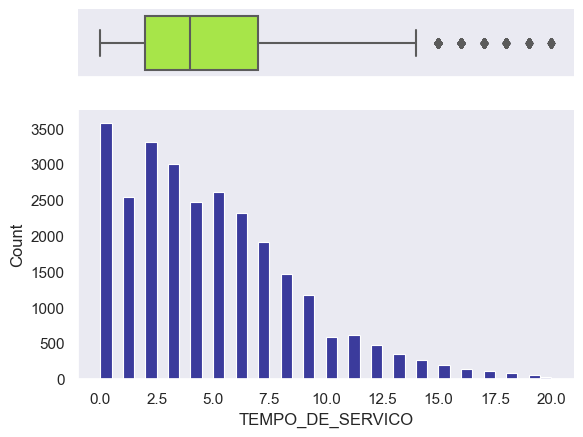

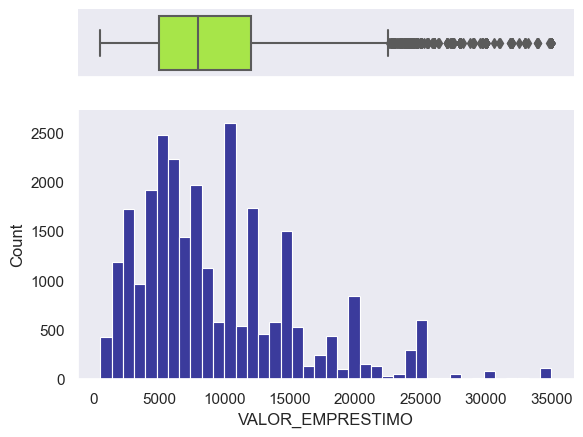

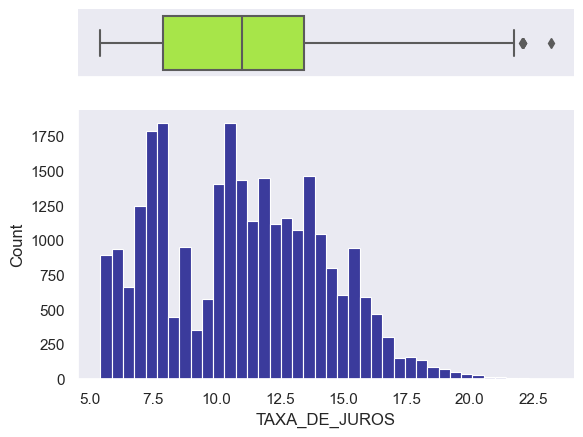

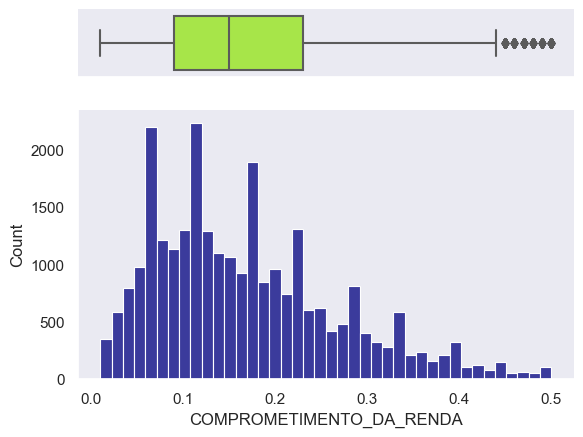

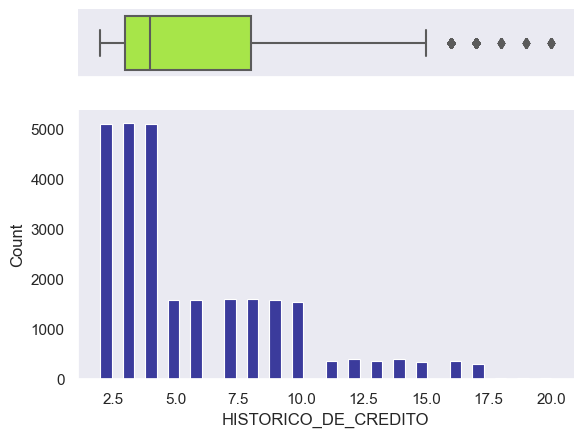

In [120]:
#Comparando Frequencia com BoxPlot para entender um pouco melhor os outliers
dados_numericos = AluraCash_out2.describe().columns
for i in ([0,1,2,3,4,6,7]):
    sns.set(style="dark")
    x = AluraCash_out2[dados_numericos[i]]

    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.20, .80)})

    sns.boxplot(data=x, ax=ax_box, orient='h', color='greenyellow')
    sns.histplot(data=x, ax=ax_hist, bins=40,  color='navy')

    ax_box.set(yticks=[])
    sns.despine(ax=ax_hist)
    sns.despine(ax=ax_box, left=True)    

# Passo iv

In [121]:
d = {'Completo':corr_0.values, 'IIQ':corr_1.values, 'Ajustado':corr_2.values}
df_compara = pd.DataFrame(data=d, index=corr_0.index)
df_compara

,Completo,IIQ,Ajustado
IDADE,-0.0229,-0.0250,-0.0235
RENDA_ANUAL,-0.1755,-0.2596,-0.2353
TEMPO_DE_SERVICO,-0.0826,-0.0926,-0.0906
VALOR_EMPRESTIMO,0.1134,0.0725,0.1122
TAXA_DE_JUROS,0.3393,0.3372,0.3428
SITUACAO_INADIMPLENCIA,1.0000,1.0000,1.0000
COMPROMETIMENTO_DA_RENDA,0.3796,0.3389,0.3652
HISTORICO_DE_CREDITO,-0.0154,-0.0161,-0.0169


In [122]:
AluraCash_out3=AluraCash[~(
 (AluraCash.IDADE>(2.5*AluraCash.IDADE.quantile(0.75)-1.5*AluraCash.IDADE.quantile(0.25))) |
 (AluraCash.RENDA_ANUAL>(2.5*AluraCash.RENDA_ANUAL.quantile(0.75)-1.5*AluraCash.RENDA_ANUAL.quantile(0.25))) |
 (AluraCash.TEMPO_DE_SERVICO>(2.5*AluraCash.TEMPO_DE_SERVICO.quantile(0.75)-1.5*AluraCash.TEMPO_DE_SERVICO.quantile(0.25))) |
 (AluraCash.HISTORICO_DE_CREDITO>20))]
AluraCash_out3

,IDADE,RENDA_ANUAL,MORADIA,TEMPO_DE_SERVICO,MOTIVO_EMPRESTIMO,SCORE_CREDITO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_INADIMPLENCIA,HISTORICO_DE_CREDITO
0,21,60000,alugada,2,educacao,B,8000,11.26,0,0.13,n,3
1,40,70000,hipoteca,6,educacao,A,18000,7.90,0,0.26,n,14
2,29,115000,hipoteca,3,saude,C,22000,15.23,0,0.19,s,7
3,26,84996,alugada,0,saude,B,9000,11.26,0,0.11,n,2
4,31,66000,alugada,11,reforma,B,10500,12.69,0,0.16,n,10
...,...,...,...,...,...,...,...,...,...,...,...,...
28625,23,50000,alugada,3,educacao,B,10000,9.91,0,0.20,n,3
28626,30,60000,hipoteca,14,empreendimento,A,8000,7.51,0,0.13,n,10
28627,25,79000,propria,3,empreendimento,A,14000,6.92,0,0.18,n,2
28628,25,95004,propria,9,educacao,B,2800,9.91,0,0.03,n,3


In [123]:
corr_3=(AluraCash_out3.select_dtypes('number').corr().round(4)).SITUACAO_INADIMPLENCIA
pd.DataFrame(corr_3)

,SITUACAO_INADIMPLENCIA
IDADE,-0.0227
RENDA_ANUAL,-0.2506
TEMPO_DE_SERVICO,-0.0918
VALOR_EMPRESTIMO,0.1272
TAXA_DE_JUROS,0.3382
SITUACAO_INADIMPLENCIA,1.0000
COMPROMETIMENTO_DA_RENDA,0.3810
HISTORICO_DE_CREDITO,-0.0144


In [124]:
d = {'Completo':corr_0.values, 'IIQ':corr_1.values, 'Ajustado':corr_2.values, 'Ajustado_2': corr_3.values}
df_compara = pd.DataFrame(data=d, index=corr_1.index)
df_compara

,Completo,IIQ,Ajustado,Ajustado_2
IDADE,-0.0229,-0.0250,-0.0235,-0.0227
RENDA_ANUAL,-0.1755,-0.2596,-0.2353,-0.2506
TEMPO_DE_SERVICO,-0.0826,-0.0926,-0.0906,-0.0918
VALOR_EMPRESTIMO,0.1134,0.0725,0.1122,0.1272
TAXA_DE_JUROS,0.3393,0.3372,0.3428,0.3382
SITUACAO_INADIMPLENCIA,1.0000,1.0000,1.0000,1.0000
COMPROMETIMENTO_DA_RENDA,0.3796,0.3389,0.3652,0.3810
HISTORICO_DE_CREDITO,-0.0154,-0.0161,-0.0169,-0.0144


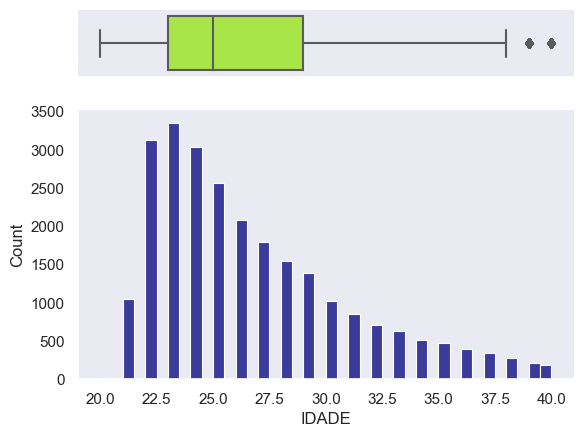

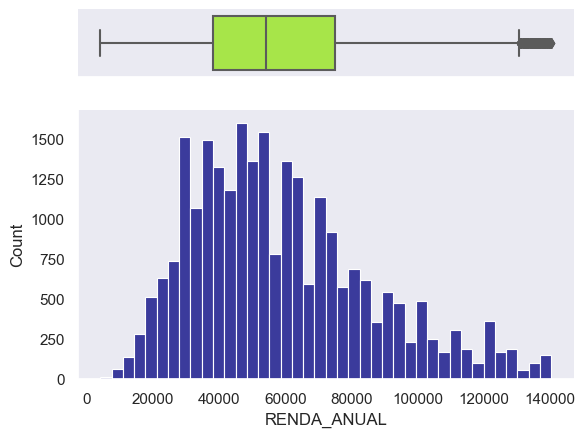

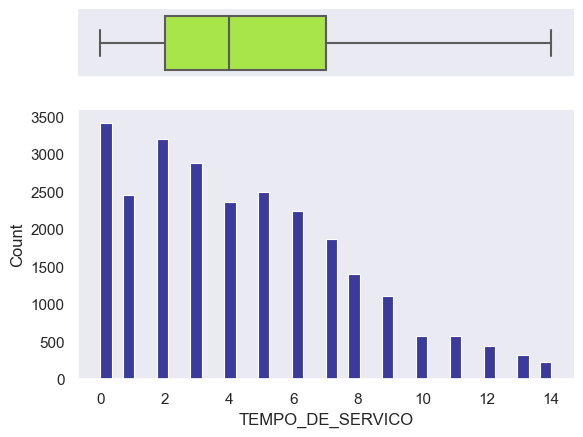

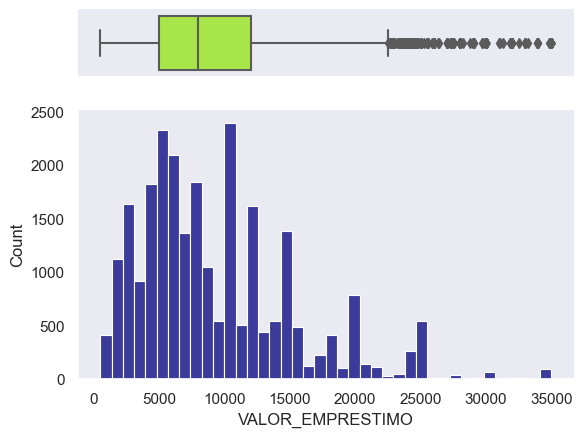

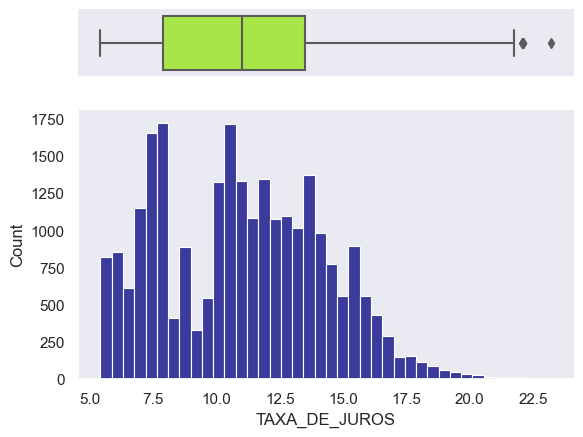

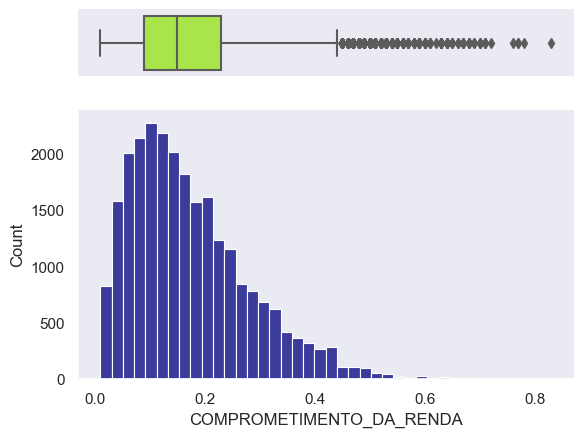

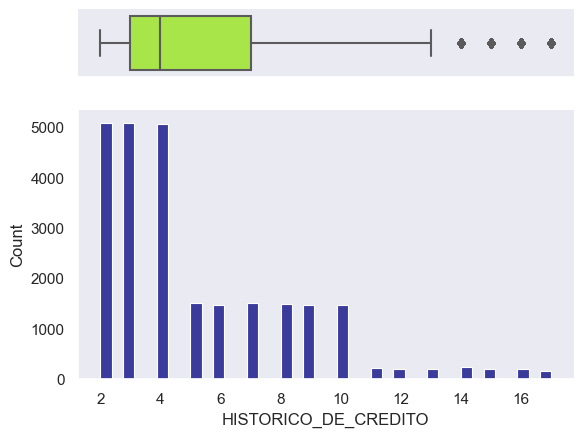

In [125]:
#Comparando Frequencia com BoxPlot para entender um pouco melhor os outliers
dados_numericos = AluraCash_out3.describe().columns
for i in ([0,1,2,3,4,6,7]):
    sns.set(style="dark")
    x = AluraCash_out3[dados_numericos[i]]

    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.20, .80)})

    sns.boxplot(data=x, ax=ax_box, orient='h', color='greenyellow')
    sns.histplot(data=x, ax=ax_hist, bins=40,  color='navy')

    ax_box.set(yticks=[])
    sns.despine(ax=ax_hist)
    sns.despine(ax=ax_box, left=True)    

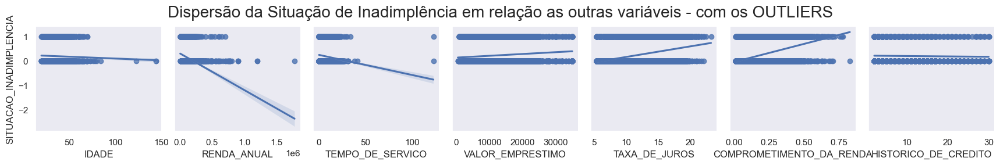

In [126]:
pp = sns.pairplot(AluraCash,
                y_vars='SITUACAO_INADIMPLENCIA',
                x_vars=['IDADE', 'RENDA_ANUAL', 'TEMPO_DE_SERVICO', 'VALOR_EMPRESTIMO',
                'TAXA_DE_JUROS', 'COMPROMETIMENTO_DA_RENDA', 'HISTORICO_DE_CREDITO'],
                kind='reg')
pp.fig.suptitle('Dispersão da Situação de Inadimplência em relação as outras variáveis - com os OUTLIERS', fontsize=20, y=1.1)
pp = pp

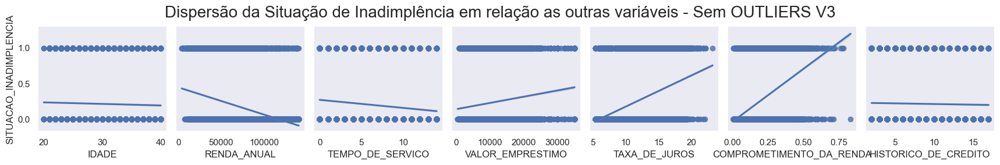

In [127]:
pp = sns.pairplot(AluraCash_out3,
                y_vars='SITUACAO_INADIMPLENCIA',
                x_vars=['IDADE', 'RENDA_ANUAL', 'TEMPO_DE_SERVICO', 'VALOR_EMPRESTIMO',
                'TAXA_DE_JUROS', 'COMPROMETIMENTO_DA_RENDA', 'HISTORICO_DE_CREDITO'],
                kind='reg')
pp.fig.suptitle('Dispersão da Situação de Inadimplência em relação as outras variáveis - Sem OUTLIERS V3', fontsize=20, y=1.1)
pp = pp

# **Aprendizado 02** 
## O Que?
    Agora que temos um banco de dados ajustado, sem dados 'faltantes' ou grandes distorções por outliers, o próximo passo é ajustar as variáveis categóricas.
## Por Quê?
    As variáveis categóricas não foram trabalhadas até o momento e os modelos preditivos não trabalham com esse tipo de variável assim precisamos transformar as variáveis categóricas em numéricas ou 'booleanas';
## Como?
    Usaremos o OneHotEncoder que transforma um variável com 'n' categorias em 'n' features que recebem os valore 1 ou 0;
    Usaremos uma técnica "experimental" (Frequência Relativa) que atribui a cada categoria o valor relativo da categoria na variável alvo.
    Com isso teremos dois bancos de dados para o modelo de previsão;

## APLICAR ENCODING nas Variáveis Categóricas

In [128]:
AluraCash_out3.select_dtypes('object').describe()

,MORADIA,MOTIVO_EMPRESTIMO,SCORE_CREDITO,HISTORICO_DE_INADIMPLENCIA
count,25556,25556,25556,25556
unique,4,6,7,2
top,alugada,educacao,A,n
freq,13453,5233,8397,21003


In [129]:
var_numericas = AluraCash_out3.describe().columns
var_categoricas = AluraCash_out3.select_dtypes('object').columns

## ENCODE v 1 - OneHotEncoder (OHE)

In [130]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder

one_hot_enc = make_column_transformer(
    (OneHotEncoder(handle_unknown = 'ignore'),
    var_categoricas),
    remainder='passthrough')

AluraCash_encode_0 = one_hot_enc.fit_transform(AluraCash_out3)
AluraCash_encode_0 = pd.DataFrame(AluraCash_encode_0, columns=one_hot_enc.get_feature_names_out())
AluraCash_encode_0

,onehotencoder__MORADIA_alugada,onehotencoder__MORADIA_hipoteca,onehotencoder__MORADIA_outro,onehotencoder__MORADIA_propria,onehotencoder__MOTIVO_EMPRESTIMO_educacao,onehotencoder__MOTIVO_EMPRESTIMO_empreendimento,onehotencoder__MOTIVO_EMPRESTIMO_quitacao_debitos,onehotencoder__MOTIVO_EMPRESTIMO_reforma,onehotencoder__MOTIVO_EMPRESTIMO_saude,onehotencoder__MOTIVO_EMPRESTIMO_uso_pessoal,...,onehotencoder__HISTORICO_DE_INADIMPLENCIA_n,onehotencoder__HISTORICO_DE_INADIMPLENCIA_s,remainder__IDADE,remainder__RENDA_ANUAL,remainder__TEMPO_DE_SERVICO,remainder__VALOR_EMPRESTIMO,remainder__TAXA_DE_JUROS,remainder__SITUACAO_INADIMPLENCIA,remainder__COMPROMETIMENTO_DA_RENDA,remainder__HISTORICO_DE_CREDITO
0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,21.0,60000.0,2.0,8000.0,11.26,0.0,0.13,3.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,40.0,70000.0,6.0,18000.0,7.90,0.0,0.26,14.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,29.0,115000.0,3.0,22000.0,15.23,0.0,0.19,7.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,26.0,84996.0,0.0,9000.0,11.26,0.0,0.11,2.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,31.0,66000.0,11.0,10500.0,12.69,0.0,0.16,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25551,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,23.0,50000.0,3.0,10000.0,9.91,0.0,0.20,3.0
25552,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,30.0,60000.0,14.0,8000.0,7.51,0.0,0.13,10.0
25553,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,25.0,79000.0,3.0,14000.0,6.92,0.0,0.18,2.0
25554,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,25.0,95004.0,9.0,2800.0,9.91,0.0,0.03,3.0


In [131]:
AluraCash_encode_0.columns

Index(['onehotencoder__MORADIA_alugada', 'onehotencoder__MORADIA_hipoteca',
       'onehotencoder__MORADIA_outro', 'onehotencoder__MORADIA_propria',
       'onehotencoder__MOTIVO_EMPRESTIMO_educacao',
       'onehotencoder__MOTIVO_EMPRESTIMO_empreendimento',
       'onehotencoder__MOTIVO_EMPRESTIMO_quitacao_debitos',
       'onehotencoder__MOTIVO_EMPRESTIMO_reforma',
       'onehotencoder__MOTIVO_EMPRESTIMO_saude',
       'onehotencoder__MOTIVO_EMPRESTIMO_uso_pessoal',
       'onehotencoder__SCORE_CREDITO_A', 'onehotencoder__SCORE_CREDITO_B',
       'onehotencoder__SCORE_CREDITO_C', 'onehotencoder__SCORE_CREDITO_D',
       'onehotencoder__SCORE_CREDITO_E', 'onehotencoder__SCORE_CREDITO_F',
       'onehotencoder__SCORE_CREDITO_G',
       'onehotencoder__HISTORICO_DE_INADIMPLENCIA_n',
       'onehotencoder__HISTORICO_DE_INADIMPLENCIA_s', 'remainder__IDADE',
       'remainder__RENDA_ANUAL', 'remainder__TEMPO_DE_SERVICO',
       'remainder__VALOR_EMPRESTIMO', 'remainder__TAXA_DE_JUROS',
  

In [132]:
novas_colunas = {'remainder__IDADE': 'IDADE' ,
    'remainder__RENDA_ANUAL': 'RENDA_ANUAL',
    'remainder__TEMPO_DE_SERVICO':'TEMPO_DE_SERVICO' ,
    'remainder__VALOR_EMPRESTIMO':'VALOR_EMPRESTIMO',
    'remainder__TAXA_DE_JUROS':'TAXA_DE_JUROS',
    'remainder__SITUACAO_INADIMPLENCIA': 'SITUACAO_INADIMPLENCIA',
    'remainder__COMPROMETIMENTO_DA_RENDA':'COMPROMETIMENTO_DA_RENDA',
    'remainder__HISTORICO_DE_CREDITO':'HISTORICO_DE_CREDITO',
    'onehotencoder__MORADIA_alugada' : 'OHE_M_alugada',
    'onehotencoder__MORADIA_hipoteca': 'OHE_M_hipoteca',
    'onehotencoder__MORADIA_outro': 'OHE_M_outro',
    'onehotencoder__MORADIA_propria': 'OHE_M_propria',
    'onehotencoder__MOTIVO_EMPRESTIMO_educacao' : 'OHE_ME_educacao',
    'onehotencoder__MOTIVO_EMPRESTIMO_empreendimento': 'OHE_ME_empreendimento',
    'onehotencoder__MOTIVO_EMPRESTIMO_quitacao_debitos': 'OHE_ME_quitacao_debitos',
    'onehotencoder__MOTIVO_EMPRESTIMO_reforma': 'OHE_ME_reforma',
    'onehotencoder__MOTIVO_EMPRESTIMO_saude': 'OHE_ME_saude',
    'onehotencoder__MOTIVO_EMPRESTIMO_uso_pessoal': 'OHE_ME_uso_pessoal',
    'onehotencoder__SCORE_CREDITO_A': 'OHE_SC_A',
    'onehotencoder__SCORE_CREDITO_B': 'OHE_SC_B',
    'onehotencoder__SCORE_CREDITO_C': 'OHE_SC_C',
    'onehotencoder__SCORE_CREDITO_D': 'OHE_SC_D',
    'onehotencoder__SCORE_CREDITO_E': 'OHE_SC_E',
    'onehotencoder__SCORE_CREDITO_F': 'OHE_SC_F',
    'onehotencoder__SCORE_CREDITO_G': 'OHE_SC_G',
    'onehotencoder__HISTORICO_DE_INADIMPLENCIA_n': 'OHE_HI_n',
    'onehotencoder__HISTORICO_DE_INADIMPLENCIA_s': 'OHE_HI_s',
}
AluraCash_encode_0 = AluraCash_encode_0.rename(columns=novas_colunas)
AluraCash_encode_0

,OHE_M_alugada,OHE_M_hipoteca,OHE_M_outro,OHE_M_propria,OHE_ME_educacao,OHE_ME_empreendimento,OHE_ME_quitacao_debitos,OHE_ME_reforma,OHE_ME_saude,OHE_ME_uso_pessoal,...,OHE_HI_n,OHE_HI_s,IDADE,RENDA_ANUAL,TEMPO_DE_SERVICO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_CREDITO
0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,21.0,60000.0,2.0,8000.0,11.26,0.0,0.13,3.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,40.0,70000.0,6.0,18000.0,7.90,0.0,0.26,14.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,29.0,115000.0,3.0,22000.0,15.23,0.0,0.19,7.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,26.0,84996.0,0.0,9000.0,11.26,0.0,0.11,2.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,31.0,66000.0,11.0,10500.0,12.69,0.0,0.16,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25551,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,23.0,50000.0,3.0,10000.0,9.91,0.0,0.20,3.0
25552,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,30.0,60000.0,14.0,8000.0,7.51,0.0,0.13,10.0
25553,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,25.0,79000.0,3.0,14000.0,6.92,0.0,0.18,2.0
25554,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,25.0,95004.0,9.0,2800.0,9.91,0.0,0.03,3.0


In [133]:
AluraCash_encode_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25556 entries, 0 to 25555
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   OHE_M_alugada             25556 non-null  float64
 1   OHE_M_hipoteca            25556 non-null  float64
 2   OHE_M_outro               25556 non-null  float64
 3   OHE_M_propria             25556 non-null  float64
 4   OHE_ME_educacao           25556 non-null  float64
 5   OHE_ME_empreendimento     25556 non-null  float64
 6   OHE_ME_quitacao_debitos   25556 non-null  float64
 7   OHE_ME_reforma            25556 non-null  float64
 8   OHE_ME_saude              25556 non-null  float64
 9   OHE_ME_uso_pessoal        25556 non-null  float64
 10  OHE_SC_A                  25556 non-null  float64
 11  OHE_SC_B                  25556 non-null  float64
 12  OHE_SC_C                  25556 non-null  float64
 13  OHE_SC_D                  25556 non-null  float64
 14  OHE_SC

In [134]:
AluraCash_encode_0.columns

Index(['OHE_M_alugada', 'OHE_M_hipoteca', 'OHE_M_outro', 'OHE_M_propria',
       'OHE_ME_educacao', 'OHE_ME_empreendimento', 'OHE_ME_quitacao_debitos',
       'OHE_ME_reforma', 'OHE_ME_saude', 'OHE_ME_uso_pessoal', 'OHE_SC_A',
       'OHE_SC_B', 'OHE_SC_C', 'OHE_SC_D', 'OHE_SC_E', 'OHE_SC_F', 'OHE_SC_G',
       'OHE_HI_n', 'OHE_HI_s', 'IDADE', 'RENDA_ANUAL', 'TEMPO_DE_SERVICO',
       'VALOR_EMPRESTIMO', 'TAXA_DE_JUROS', 'SITUACAO_INADIMPLENCIA',
       'COMPROMETIMENTO_DA_RENDA', 'HISTORICO_DE_CREDITO'],
      dtype='object')

In [135]:
AluraCash_encode=AluraCash_encode_0

In [136]:
AluraCash_encode

,OHE_M_alugada,OHE_M_hipoteca,OHE_M_outro,OHE_M_propria,OHE_ME_educacao,OHE_ME_empreendimento,OHE_ME_quitacao_debitos,OHE_ME_reforma,OHE_ME_saude,OHE_ME_uso_pessoal,...,OHE_HI_n,OHE_HI_s,IDADE,RENDA_ANUAL,TEMPO_DE_SERVICO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,SITUACAO_INADIMPLENCIA,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_CREDITO
0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,21.0,60000.0,2.0,8000.0,11.26,0.0,0.13,3.0
1,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,40.0,70000.0,6.0,18000.0,7.90,0.0,0.26,14.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,29.0,115000.0,3.0,22000.0,15.23,0.0,0.19,7.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,26.0,84996.0,0.0,9000.0,11.26,0.0,0.11,2.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,31.0,66000.0,11.0,10500.0,12.69,0.0,0.16,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25551,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,23.0,50000.0,3.0,10000.0,9.91,0.0,0.20,3.0
25552,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,30.0,60000.0,14.0,8000.0,7.51,0.0,0.13,10.0
25553,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,25.0,79000.0,3.0,14000.0,6.92,0.0,0.18,2.0
25554,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,25.0,95004.0,9.0,2800.0,9.91,0.0,0.03,3.0


In [137]:
#verificando as correlações com o OHE
corr_e=(AluraCash_encode.corr().round(4)).SITUACAO_INADIMPLENCIA
pd.DataFrame(corr_e)

,SITUACAO_INADIMPLENCIA
OHE_M_alugada,0.2334
OHE_M_hipoteca,-0.1831
OHE_M_outro,0.0103
OHE_M_propria,-0.1042
OHE_ME_educacao,-0.0626
OHE_ME_empreendimento,-0.0744
OHE_ME_quitacao_debitos,0.0645
OHE_ME_reforma,0.0421
OHE_ME_saude,0.0569
OHE_ME_uso_pessoal,-0.0142


## ENCODE v2 - uso da Distribuição relativa em relação ao dado a ser previsto
Por padrão usamos duas casas decimais, mas caso haja repetição de valor, em uma mesma categoria, deve ser adicionada uma nova casa ou adiciona-se um centésimo para a categoria com mais ocorrências absolutas, ou subtrai-se da categoria com menos ocorrencias, o que não gerar um novo "empate".
Caso haja exatamente a mesma quantidade absoluta de itens escolhe-se uma categoria e a diferencia com o acréscimo ou subtração de um centésimo

In [138]:
def relativos(resultados, nome_das_categorias, categorias , titulo):

    labels = list(resultados.keys())
    dados = np.array(list(resultados.values()))
    dados_acum = dados.cumsum(axis=1)
    cor_categorias = np.array([[0, 0, 128/255, 1], [173/255, 1, 47/255, 1]])

    fig1, ax = plt.subplots(figsize=(12, len(categorias)))
    ax.invert_yaxis()
    ax.xaxis.set_visible(False)
    ax.set_xlim(0, np.sum(dados, axis=1).max())

    for i, (colname, cor) in enumerate(zip(nome_das_categorias, cor_categorias)):
        widths = dados[:, i]
        starts = dados_acum[:, i] - widths
        rects = ax.barh(labels, widths, left=starts, height=0.5,label=colname, color=cor)

        r, g, b, a = cor
        text_color = 'white' if r * g * b == 0 else 'black'
        ax.bar_label(rects, label_type='center', color=text_color)
    ax.legend(ncol=len(nome_das_categorias), bbox_to_anchor=(1, (1+(1/(2*len(categorias))))), loc='upper right', fontsize='small')
    ax.set_title(titulo, loc='left', fontsize=18 )

    return fig1, ax

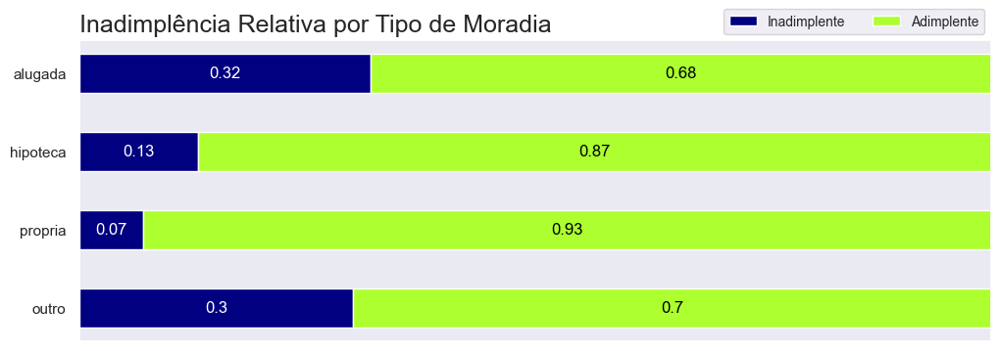

In [139]:
# Distribuição Relativa da inadimplencia por Tipo de Moradia
titulo = 'Inadimplência Relativa por Tipo de Moradia'
categorias = ['alugada','hipoteca','propria','outro']
dist_in={}
for i in range(len(categorias)):
    a,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 1) & (AluraCash_out3.MORADIA==categorias[i])].shape
    b,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 0) & (AluraCash_out3.MORADIA==categorias[i])].shape
    p1 = dist_in
    p2 = {categorias[i]: [round(a/(a+b),2),round(b/(a+b),2)]}
    dist_in={**p1,**p2}

resultados = dist_in

categoria_relativa = ['Inadimplente', 'Adimplente']

relativos(resultados, categoria_relativa, categorias, titulo)
plt.show()

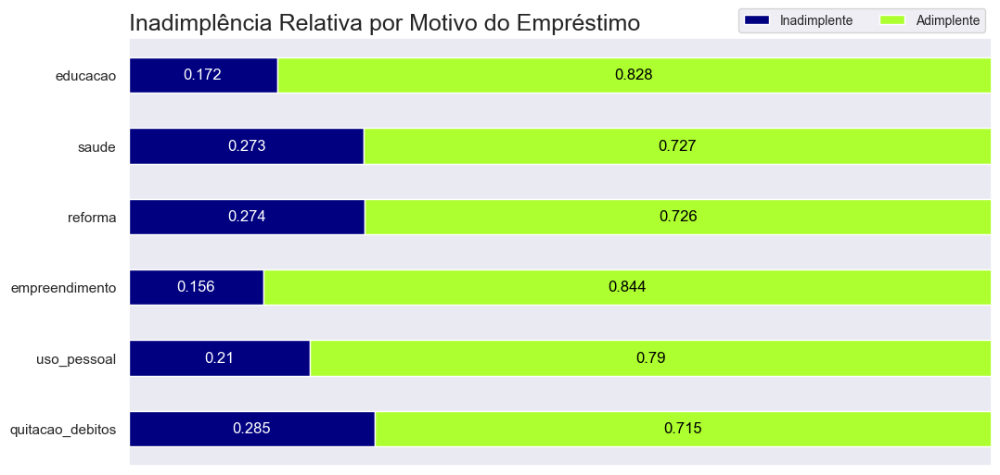

In [140]:
# Distribuição Relativa da inadimplencia por Motivo do Emprestimo
titulo = 'Inadimplência Relativa por Motivo do Empréstimo'
categorias = ['educacao', 'saude', 'reforma', 'empreendimento', 'uso_pessoal', 'quitacao_debitos']
dist_in={}
for i in range(len(categorias)):
    a,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 1) & (AluraCash_out3.MOTIVO_EMPRESTIMO==categorias[i])].shape
    b,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 0) & (AluraCash_out3.MOTIVO_EMPRESTIMO==categorias[i])].shape
    p1 = dist_in
    p2 = {categorias[i]: [round(a/(a+b),3),round(b/(a+b),3)]}
    dist_in={**p1,**p2}

resultados = dist_in

categoria_relativa = ['Inadimplente', 'Adimplente']

relativos(resultados, categoria_relativa, categorias, titulo)
plt.show()

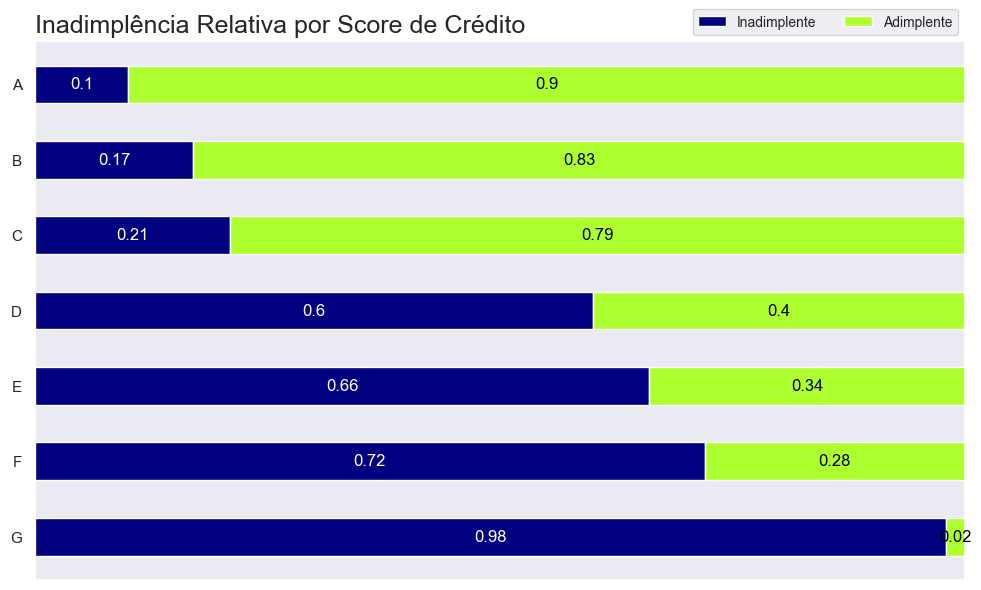

In [141]:
# Distribuição Relativa da inadimplencia por Score de Crédito
titulo='Inadimplência Relativa por Score de Crédito'
categorias = ['A', 'B', 'C', 'D', 'E', 'F', 'G']
dist_in={}
for i in range(len(categorias)):
    a,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 1) & (AluraCash_out3.SCORE_CREDITO==categorias[i])].shape
    b,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 0) & (AluraCash_out3.SCORE_CREDITO==categorias[i])].shape
    p1 = dist_in
    p2 = {categorias[i]: [round(a/(a+b),2),round(b/(a+b),2)]}
    dist_in={**p1,**p2}

resultados = dist_in

categoria_relativa = ['Inadimplente', 'Adimplente']

relativos(resultados, categoria_relativa, categorias, titulo)
plt.show()

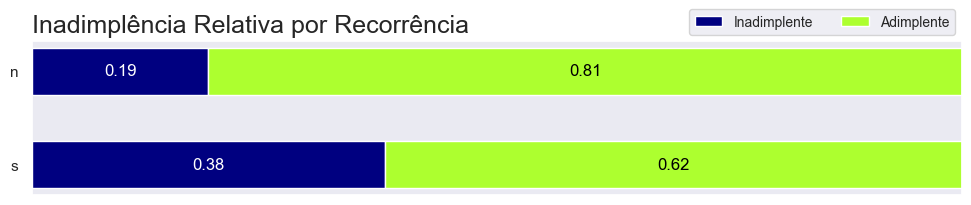

In [142]:
# Distribuição Relativa da inadimplencia por Histórico de Inadimplência
titulo = 'Inadimplência Relativa por Recorrência'
categorias = ['n', 's']
dist_in={}
for i in range(len(categorias)):
    a,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 1) & (AluraCash_out3.HISTORICO_DE_INADIMPLENCIA==categorias[i])].shape
    b,_ = AluraCash_out3[(AluraCash_out3.SITUACAO_INADIMPLENCIA == 0) & (AluraCash_out3.HISTORICO_DE_INADIMPLENCIA==categorias[i])].shape
    p1 = dist_in
    p2 = {categorias[i]: [round(a/(a+b),2),round(b/(a+b),2)]}
    dist_in={**p1,**p2}

resultados = dist_in

categoria_relativa = ['Inadimplente', 'Adimplente']

relativos(resultados, categoria_relativa, categorias, titulo)
plt.show()

# Encode (versão com frequência relativa)
### 'MORADIA'
'alugada' - 0.32

'hipoteca' - 0.13

'propria' - 0.07

'outro' - 0.30

### 'MOTIVO_EMPRESTIMO'
'educacao' - 0.172

'saude' - 0.273

'reforma' - 0.274

'empreendimento' - 0.156

'uso_pessoal' - 0.210

'quitacao_debitos' - 0.285

### 'SCORE_CREDITO'
'A' - 0.10     /   'B' - 0.17

'C' - 0.21    /   'D' - 0.60

'E' - 0.66    /   'F' - 0.72

'G' - 0.98

### 'HISTORICO_DE_INADIMPLENCIA'
'n' - 0.19    /   's' - 0.38

In [143]:
AluraCash_out3.reset_index(inplace=True, drop=True)

In [144]:
AluraCash_out3.columns

Index(['IDADE', 'RENDA_ANUAL', 'MORADIA', 'TEMPO_DE_SERVICO',
       'MOTIVO_EMPRESTIMO', 'SCORE_CREDITO', 'VALOR_EMPRESTIMO',
       'TAXA_DE_JUROS', 'SITUACAO_INADIMPLENCIA', 'COMPROMETIMENTO_DA_RENDA',
       'HISTORICO_DE_INADIMPLENCIA', 'HISTORICO_DE_CREDITO'],
      dtype='object')

In [145]:
AluraCash_fr = AluraCash_out3[['SITUACAO_INADIMPLENCIA', 'IDADE', 'RENDA_ANUAL', 'TEMPO_DE_SERVICO',
       'VALOR_EMPRESTIMO', 'TAXA_DE_JUROS', 'COMPROMETIMENTO_DA_RENDA', 'HISTORICO_DE_CREDITO']]

In [146]:
AluraCash_fr

,SITUACAO_INADIMPLENCIA,IDADE,RENDA_ANUAL,TEMPO_DE_SERVICO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_CREDITO
0,0,21,60000,2,8000,11.26,0.13,3
1,0,40,70000,6,18000,7.90,0.26,14
2,0,29,115000,3,22000,15.23,0.19,7
3,0,26,84996,0,9000,11.26,0.11,2
4,0,31,66000,11,10500,12.69,0.16,10
...,...,...,...,...,...,...,...,...
25551,0,23,50000,3,10000,9.91,0.20,3
25552,0,30,60000,14,8000,7.51,0.13,10
25553,0,25,79000,3,14000,6.92,0.18,2
25554,0,25,95004,9,2800,9.91,0.03,3


In [147]:
# Encode de Moradia
moradia_troca = {
    'alugada': 0.32,
    'hipoteca': 0.13,
    'propria': 0.07,
    'outro': 0.30
}
AluraCash_fr['e_MORADIA'] = AluraCash_out3.MORADIA.map(moradia_troca)

C:\Users\T-GAMER\AppData\Local\Temp\ipykernel_6272\3945608846.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AluraCash_fr['e_MORADIA'] = AluraCash_out3.MORADIA.map(moradia_troca)


In [148]:
# Encode de Motivo
motivo_troca = {
    'educacao': 0.172,
    'saude': 0.273,
    'reforma': 0.274,
    'empreendimento': 0.156,
    'uso_pessoal': 0.210,
    'quitacao_debitos': 0.285
}
AluraCash_fr['e_MOTIVO_EMPRESTIMO']=AluraCash_out3.MOTIVO_EMPRESTIMO.map(motivo_troca)

C:\Users\T-GAMER\AppData\Local\Temp\ipykernel_6272\3375509854.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AluraCash_fr['e_MOTIVO_EMPRESTIMO']=AluraCash_out3.MOTIVO_EMPRESTIMO.map(motivo_troca)


In [149]:
### 'SCORE_CREDITO'
score_troca = {
    'A': 0.10,
    'B': 0.17,
    'C': 0.21,
    'D': 0.60,
    'E': 0.66,
    'F': 0.72,
    'G': 0.98
}
AluraCash_fr['e_SCORE_CREDITO']=AluraCash_out3.SCORE_CREDITO.map(score_troca)

C:\Users\T-GAMER\AppData\Local\Temp\ipykernel_6272\3259666250.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  AluraCash_fr['e_SCORE_CREDITO']=AluraCash_out3.SCORE_CREDITO.map(score_troca)


In [150]:
### 'HISTORICO_DE_INADIMPLENCIA'
hist_troca = {
    'n': 0.19,
    's': 0.38
}
AluraCash_fr['e_HISTORICO_DE_INADIMPLENCIA']=AluraCash_out3.HISTORICO_DE_INADIMPLENCIA.map(hist_troca)

In [151]:
AluraCash_fr

,SITUACAO_INADIMPLENCIA,IDADE,RENDA_ANUAL,TEMPO_DE_SERVICO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_CREDITO,e_MORADIA,e_MOTIVO_EMPRESTIMO,e_SCORE_CREDITO,e_HISTORICO_DE_INADIMPLENCIA
0,0,21,60000,2,8000,11.26,0.13,3,0.32,0.172,0.17,0.19
1,0,40,70000,6,18000,7.90,0.26,14,0.13,0.172,0.10,0.19
2,0,29,115000,3,22000,15.23,0.19,7,0.13,0.273,0.21,0.38
3,0,26,84996,0,9000,11.26,0.11,2,0.32,0.273,0.17,0.19
4,0,31,66000,11,10500,12.69,0.16,10,0.32,0.274,0.17,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...
25551,0,23,50000,3,10000,9.91,0.20,3,0.32,0.172,0.17,0.19
25552,0,30,60000,14,8000,7.51,0.13,10,0.13,0.156,0.10,0.19
25553,0,25,79000,3,14000,6.92,0.18,2,0.07,0.156,0.10,0.19
25554,0,25,95004,9,2800,9.91,0.03,3,0.07,0.172,0.17,0.19


In [152]:
AluraCash_fr.describe()

,SITUACAO_INADIMPLENCIA,IDADE,RENDA_ANUAL,TEMPO_DE_SERVICO,VALOR_EMPRESTIMO,TAXA_DE_JUROS,COMPROMETIMENTO_DA_RENDA,HISTORICO_DE_CREDITO,e_MORADIA,e_MOTIVO_EMPRESTIMO,e_SCORE_CREDITO,e_HISTORICO_DE_INADIMPLENCIA
count,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000,25556.000000
mean,0.223587,26.557951,58794.869189,4.375450,9316.617428,11.034994,0.174067,5.166067,0.225977,0.223367,0.223555,0.223850
std,0.416657,4.386320,27285.621155,3.386281,6027.031782,3.218708,0.106643,3.237203,0.100783,0.051989,0.174602,0.072704
min,0.000000,20.000000,4080.000000,0.000000,500.000000,5.420000,0.010000,2.000000,0.070000,0.156000,0.100000,0.190000
25%,0.000000,23.000000,38000.000000,2.000000,5000.000000,7.900000,0.090000,3.000000,0.130000,0.172000,0.100000,0.190000
50%,0.000000,25.000000,54000.000000,4.000000,8000.000000,10.990000,0.150000,4.000000,0.320000,0.210000,0.170000,0.190000
75%,0.000000,29.000000,75000.000000,7.000000,12000.000000,13.480000,0.230000,7.000000,0.320000,0.274000,0.210000,0.190000
max,1.000000,40.000000,140304.000000,14.000000,35000.000000,23.220000,0.830000,17.000000,0.320000,0.285000,0.980000,0.380000


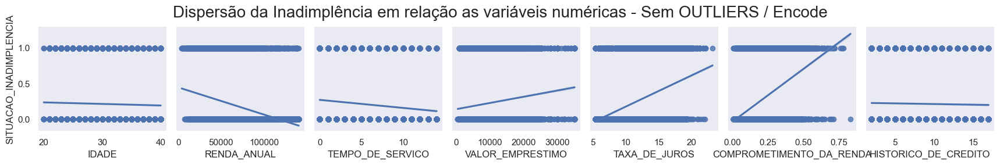

In [153]:
pp = sns.pairplot(AluraCash_out3,
                y_vars='SITUACAO_INADIMPLENCIA',
                x_vars=['IDADE', 'RENDA_ANUAL', 'TEMPO_DE_SERVICO', 'VALOR_EMPRESTIMO', 'TAXA_DE_JUROS',
                'COMPROMETIMENTO_DA_RENDA','HISTORICO_DE_CREDITO'],
                kind='reg'
                )
pp.fig.suptitle('Dispersão da Inadimplência em relação as variáveis numéricas - Sem OUTLIERS / Encode', fontsize=20, y=1.1)
pp = pp

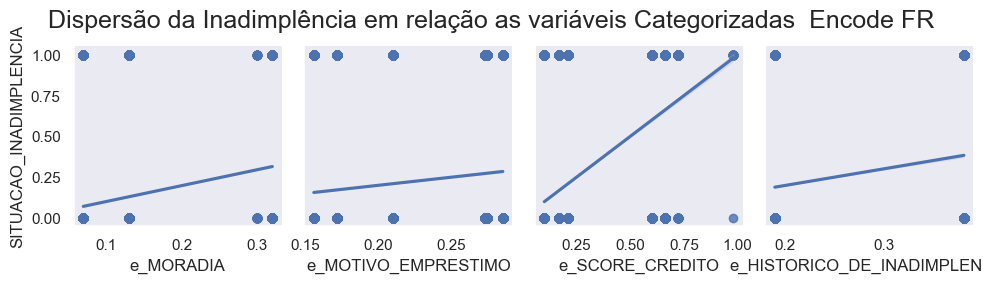

In [154]:
pp = sns.pairplot(AluraCash_fr,
                y_vars='SITUACAO_INADIMPLENCIA',
                x_vars=['e_MORADIA', 'e_MOTIVO_EMPRESTIMO',
                    'e_SCORE_CREDITO', 'e_HISTORICO_DE_INADIMPLENCIA'],
                kind='reg')
pp.fig.suptitle('Dispersão da Inadimplência em relação as variáveis Categorizadas  Encode FR', fontsize=18, y=1.1)
pp = pp,
                

In [155]:
corr_4=(AluraCash_fr.corr().round(4)).SITUACAO_INADIMPLENCIA
pd.DataFrame(corr_4)

,SITUACAO_INADIMPLENCIA
SITUACAO_INADIMPLENCIA,1.0000
IDADE,-0.0227
RENDA_ANUAL,-0.2506
TEMPO_DE_SERVICO,-0.0918
VALOR_EMPRESTIMO,0.1272
TAXA_DE_JUROS,0.3382
COMPROMETIMENTO_DA_RENDA,0.3810
HISTORICO_DE_CREDITO,-0.0144
e_MORADIA,0.2372
e_MOTIVO_EMPRESTIMO,0.1248


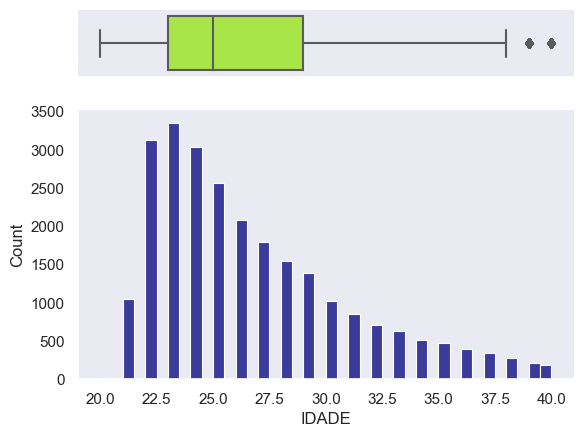

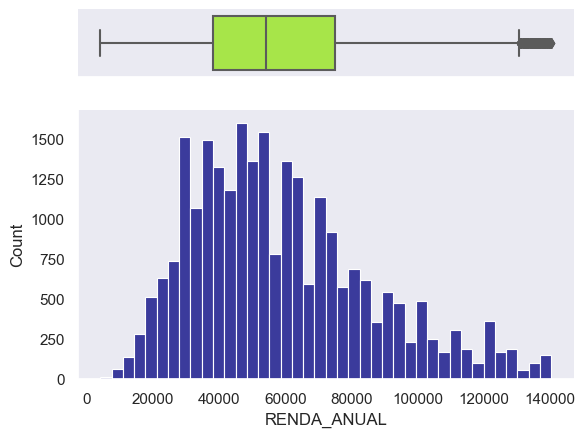

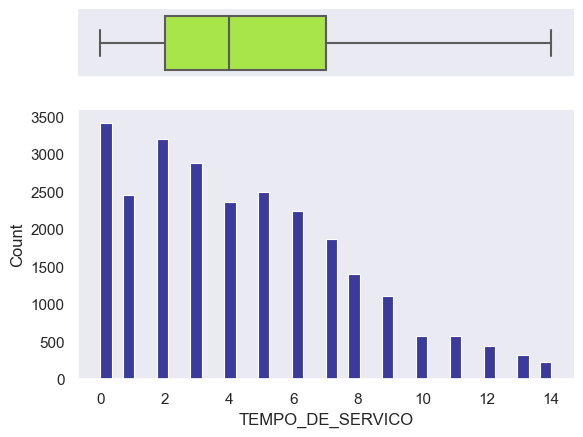

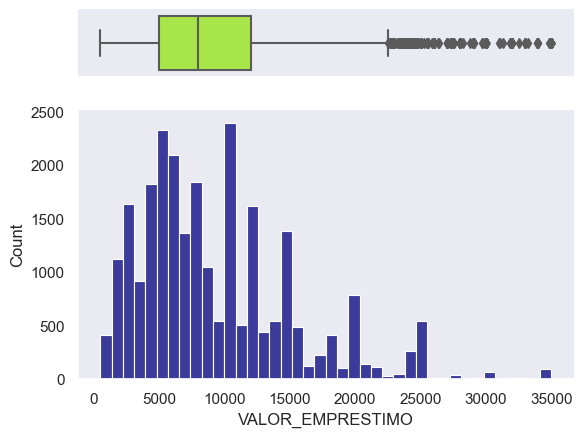

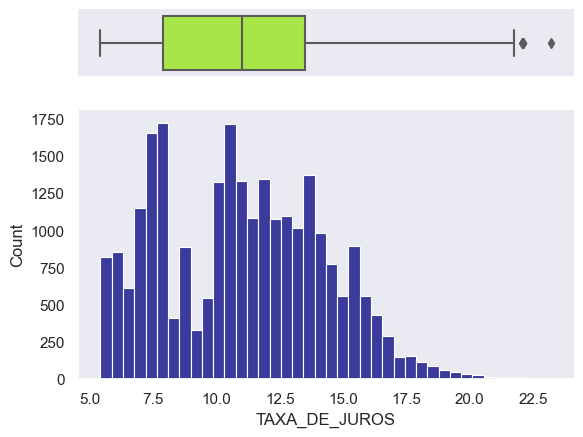

...

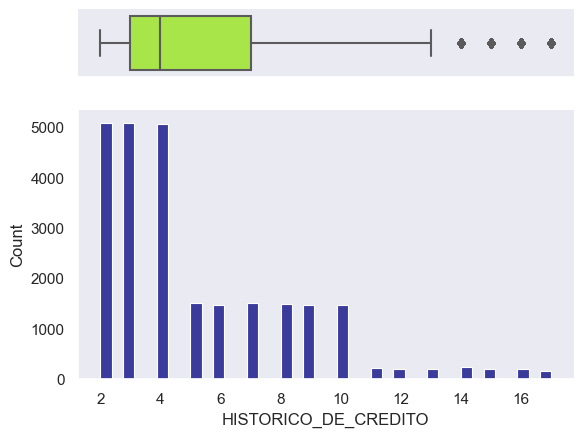

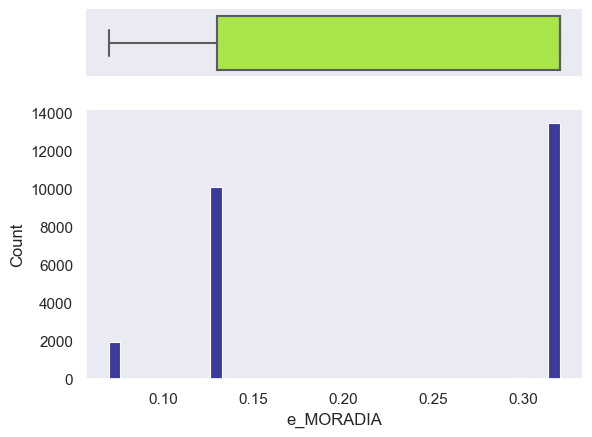

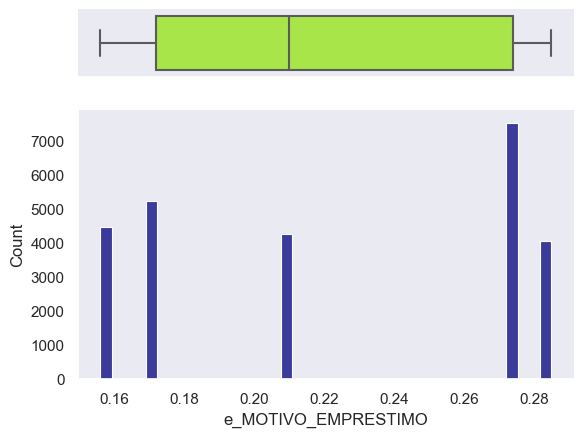

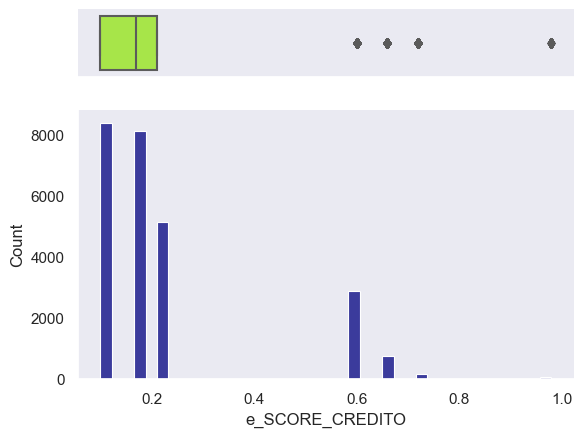

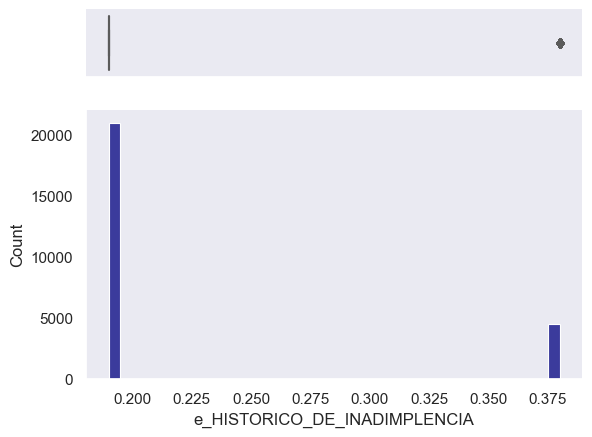

In [156]:
#Comparando Frequencia com BoxPlot para verificar as melhores opções de normalização
dados_numericos = AluraCash_fr.describe().columns
for i in (range(1,12,1)):
    sns.set(style="dark")
    x = AluraCash_fr[dados_numericos[i]]

    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.20, .80)})

    sns.boxplot(data=x, ax=ax_box, orient='h', color='greenyellow')
    sns.histplot(data=x, ax=ax_hist, bins=40,  color='navy')

    ax_box.set(yticks=[])
    sns.despine(ax=ax_hist)
    sns.despine(ax=ax_box, left=True)  

# **Aprendizado 03** 
## O Que?
    Já criamos dois bancos de dados íntegros, sem outliers e com variáveis categóricas preparadas para os modelos preditivos.
    Vamos selecionar, testar e escolher métodos de Machine Learning para, com a experiência desses bancos de dados, prever a Variável 'SITUACAO_INADIMPLENCIA' (Variável Alvo) com base no lançamento das outras variáveis.
## Por Quê?
    Há diversos modelos de machine learning cada um adaptado a um perfil de decisão os mais comuns são:
    - Classificadores - analisam os atributos de cada 'categoria do alvo', e classificam novos itens de acordo com essas características; 
    - Regressores - utilizando os atributos de cada item do 'alvo' constroem 'curvas' matemáticas (funções), que acomodam esses itens, e com base nos atributos de novos itens determinam a que ponto dessa curva corresponde o item.
    É importante experimentar diferentes modelos, principalmente quando o banco de dados traz muitos atributos de cada item, o que dificulta uma visualização clara das decisões.
## Como?
    No nosso caso convem utilizar classificadores, mas vou testar um modelo de regressão também.
    Precisamos:
    1- Definir o tamanho do banco que será direcionado para teste e para treino
    2- Dividir a base de teste e treino
    3- Definir os modelos que utilizaremos
    4- Definir as métricas e como as apresentaremos para escolha do resultado

    Obs. Como ferramenta auxiliar, criei uma grandeza batizada de grau de consciência, ela é o resultado do produto da precisão média (teste e treino) pelo ROC_score do teste. Esse número representa, de certo modo, o grau de assertividade das previsões em relação a sua precisão. Variando no intervalo (0,1) com 1 sendo o resultado ideal.


# Testando Modelos preditivos

Definindo os bancos para os testes:

- AluraCash_encode = com o uso do one hot encoder (xe, ye)

- AluraCash_fr = com o uso da frequencia relativa ao dado de previsão (xf, yf)


Usaremos a SEED = 42

Usaremos para_teste = 10% (0.10)

obs. na verdade vamos distribuir as amostras em teste e treino de modo que n_Teste/n_Treino = 0.11 (o que representa que cerca de 10% da Base foi definida como Teste)

#### Testaremos os Seguintes Métodos Classificadores:
* RandomForestClassifier
* BalancedRandomForestClassifier
* DecisionTreeClassifier
* GradientBoostingClassifier
* HistGradientBoostingClassifier
 

#### Para avaliar o comportamento de uma regressão:
* LogisticRegression

# Importações

### Classificadores e Regressão

In [157]:
from sklearn.dummy import DummyClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier
from imblearn.ensemble import BalancedRandomForestClassifier

from sklearn.linear_model import LogisticRegression

### Escaladores, pipeline, test_split

In [158]:
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit

### Métricas

In [159]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, ConfusionMatrixDisplay, roc_curve, roc_auc_score

## Criando os conjuntos de treino e teste

In [160]:
print('Como referencia temos %.2f%% de "Inadimplentes" no nosso DataBase' % (AluraCash_fr.SITUACAO_INADIMPLENCIA.sum()/len(AluraCash_fr)*100))
print('Ou seja ... procuramos mais de %.2f%% de "Precisão"' % ((1-(AluraCash_fr.SITUACAO_INADIMPLENCIA.sum()/len(AluraCash_fr)))*100)) 

Como referencia temos 22.36% de "Inadimplentes" no nosso DataBase
Ou seja ... procuramos mais de 77.64% de "Precisão"


In [161]:
AluraCash_encode.columns

Index(['OHE_M_alugada', 'OHE_M_hipoteca', 'OHE_M_outro', 'OHE_M_propria',
       'OHE_ME_educacao', 'OHE_ME_empreendimento', 'OHE_ME_quitacao_debitos',
       'OHE_ME_reforma', 'OHE_ME_saude', 'OHE_ME_uso_pessoal', 'OHE_SC_A',
       'OHE_SC_B', 'OHE_SC_C', 'OHE_SC_D', 'OHE_SC_E', 'OHE_SC_F', 'OHE_SC_G',
       'OHE_HI_n', 'OHE_HI_s', 'IDADE', 'RENDA_ANUAL', 'TEMPO_DE_SERVICO',
       'VALOR_EMPRESTIMO', 'TAXA_DE_JUROS', 'SITUACAO_INADIMPLENCIA',
       'COMPROMETIMENTO_DA_RENDA', 'HISTORICO_DE_CREDITO'],
      dtype='object')

In [162]:
xe = AluraCash_encode.drop(columns = ['SITUACAO_INADIMPLENCIA'])
ye = AluraCash_encode['SITUACAO_INADIMPLENCIA']

In [163]:
AluraCash_fr.columns

Index(['SITUACAO_INADIMPLENCIA', 'IDADE', 'RENDA_ANUAL', 'TEMPO_DE_SERVICO',
       'VALOR_EMPRESTIMO', 'TAXA_DE_JUROS', 'COMPROMETIMENTO_DA_RENDA',
       'HISTORICO_DE_CREDITO', 'e_MORADIA', 'e_MOTIVO_EMPRESTIMO',
       'e_SCORE_CREDITO', 'e_HISTORICO_DE_INADIMPLENCIA'],
      dtype='object')

In [164]:
xf = AluraCash_fr.drop(columns=['SITUACAO_INADIMPLENCIA'])
yf = AluraCash_fr['SITUACAO_INADIMPLENCIA']

In [165]:
SEED = 42
para_teste = 0.10

#Criando os DataFrames de teste e treino
xe_treino, xe_teste, ye_treino, ye_teste = train_test_split(xe, ye, random_state=SEED, test_size=para_teste, stratify=ye) # ONEHOTENCODER 
xf_treino, xf_teste, yf_treino, yf_teste = train_test_split(xf, yf, random_state=SEED, test_size=para_teste, stratify=yf) # FrequenciaRelativa 

In [166]:
#Apenas para verificação:
print('Para os DataFrames OHE: Treinaremos com %d elementos e testaremos com %d elementos' % (len(xe_treino), len(xe_teste)))
print('Para os DataFrames FR: Treinaremos com %d elementos e testaremos com %d elementos' % (len(xf_treino), len(xf_teste)))


Para os DataFrames OHE: Treinaremos com 23000 elementos e testaremos com 2556 elementos
Para os DataFrames FR: Treinaremos com 23000 elementos e testaremos com 2556 elementos


In [167]:
#relação entre Teste/Treino

print(len(xe_teste)/len(xe_treino))

0.1111304347826087


In [168]:
# Dicionários de registro dos resultados

resultado_testes={'classificador': ['Acc OneHotEncoder', 'Recall/OHE - VP', 'Recall/OHE - VN', 'OHE Acc Treino - Teste', 'OHE Consciência', 'Acc FreqRelativa', 'Recall/FR - VP','Recall/FR - VN', 'FR Acc Treino - Teste', 'FR Consciência']}

In [169]:
#Para facilitar o relatório de cada teste será exibido através da função descrita a seguir:

def relatorio_de_resultado(modelo, x_treino, y_treino, x_teste, y_teste, pipeline, previsoes, encode):
    
    A, L = (10,15)
    
    fig = plt.figure(figsize=(L,A))
    mc1 = fig.add_axes([0,5/10,45/150,45/100])
    mc2 = fig.add_axes([0,0,45/150,45/100])
    mc3 = fig.add_axes([55/150,2/5,35/150,35/100])
    mc4 = fig.add_axes([55/150,0,35/150,35/100])

    roc = fig.add_axes([10/15,0,6/15,8/10])
        
    tabela = fig.add_axes([55/150,8/10,10/15,2/10])
        

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, ax=mc1, cmap='winter')
    mc1.set_title('Matriz Confusão - Absoluto')
    mc1.set_xlabel('Previsão')
    mc1.set_ylabel('Valor Real')

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, normalize='all', ax=mc2, cmap='Blues')
    mc2.set_title('Matriz Confusão - Relativo')
    mc2.set_xlabel('Previsão')
    mc2.set_ylabel('Valor Real')

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, normalize='true', ax=mc3, cmap='winter')
    mc3.set_title('Matriz Confusão - Relativo Valor Real')
    mc3.set_xlabel('Previsão')
    mc3.set_ylabel('Valor Real')

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, normalize='pred', ax=mc4, cmap='Blues')
    mc4.set_title('Matriz Confusão - Relativo Previsão')
    mc4.set_xlabel('Previsão')
    mc4.set_ylabel('Valor Real')

    prob_previsao = modelo.predict_proba(x_teste)[:,1]

    #tfp = Taxa de Falsos Positivo
    #tvp = Taxa de Verdadeiro Positivo
    tfp, tvp, limite = roc_curve(y_teste, prob_previsao)

    roc.set_title('Curva ROC')
    roc.plot(tfp,tvp, linewidth=3, color='darkblue')
    roc.set_xlabel('Especificidade')
    roc.set_ylabel('Sensibilidade')
    roc.plot([0,1], ls='--', c='red') #diagonal
    roc.plot([0,0], [1,0], ls='--', c='green') #vertival em x=0
    roc.plot([1,1], ls='--', c='green') #horizontal em y=1
    roc.annotate('ROC_AUC_SCORE = '+str(round(roc_auc_score(y_teste, prob_previsao),2)),xy=[0.5,0])
        
        
    tabela.annotate('Modelo: '+ str(modelo), xy=[0,0.9], fontsize=16)
    tabela.annotate('Tipo de Encode: '+ encode ,xy=[0,0.6], fontsize=14)
    tabela.annotate('Precisão geral de Treino = '+str(round(pipeline.score(x_treino, y_treino),2)),xy=[0,0.4], fontsize=14)
    tabela.annotate('Precisão geral de Teste = '+str(round(pipeline.score(x_teste, y_teste),2)),xy=[0,0.2], fontsize=14)
    tabela.annotate('Consciência - Precisão Média x ROC = ' + str(round((roc_auc_score(y_teste, prob_previsao)*(pipeline.score(x_treino, y_treino) + pipeline.score(x_teste, y_teste))/2),2)),xy=[0,0], fontsize=10)
    tabela.axis('off')

    plt.show()

# Teste com Dummys

O teste com Dummys embora traga resultados pouco precisos serve como parametro de comparação para os mínimos 'aceitáveis';

Teste com Dummy - Stratified
A precisão para AluraCash_encode de foi 65.81% no Stratified.
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.78      0.78      0.78      1985
         1.0       0.24      0.24      0.24       571

    accuracy                           0.66      2556
   macro avg       0.51      0.51      0.51      2556
weighted avg       0.66      0.66      0.66      2556



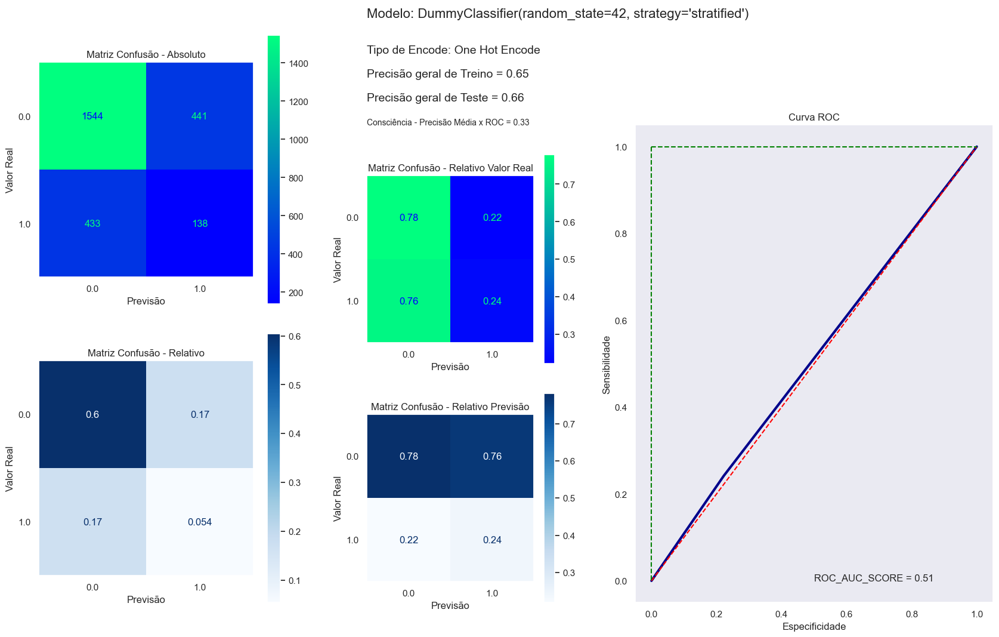

A precisão para AluraCash_fr de foi 65.81% no Stratified.
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.78      0.78      0.78      1985
           1       0.24      0.24      0.24       571

    accuracy                           0.66      2556
   macro avg       0.51      0.51      0.51      2556
weighted avg       0.66      0.66      0.66      2556



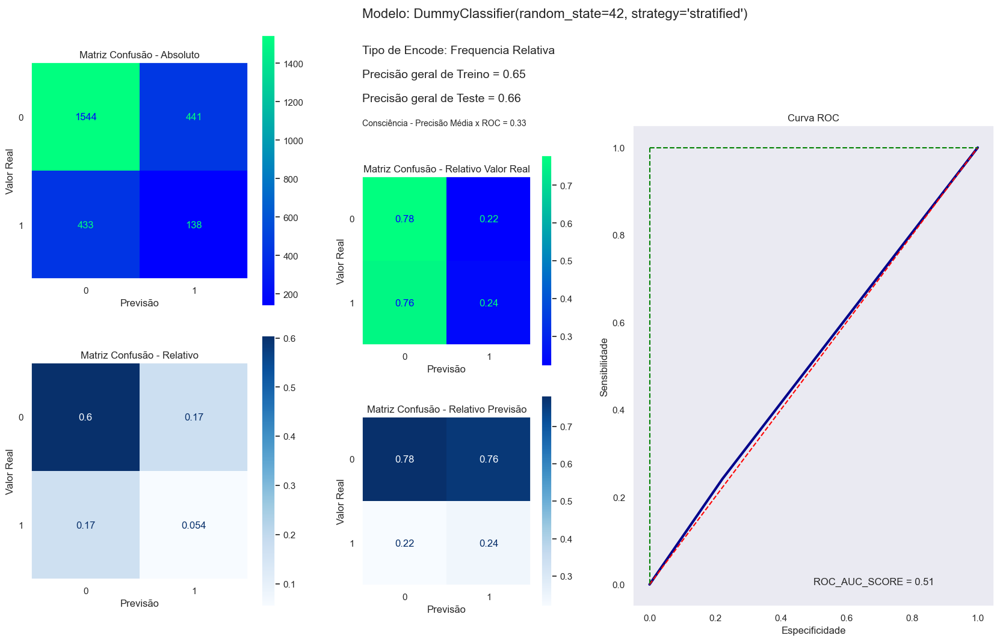

In [170]:
print('Teste com Dummy - Stratified')
print('='*70)

modelo = DummyClassifier(strategy='stratified', random_state=SEED)
modelo.fit(xe_treino, ye_treino)
previsoes = modelo.predict(xe_teste)

acuracia1 = accuracy_score(ye_teste, previsoes) * 100
print('A precisão para AluraCash_encode de foi %.2f%% no Stratified.' % acuracia1)
print('_'*70)
print(classification_report(ye_teste, previsoes))

prob_previsao1 = modelo.predict_proba(xe_teste)[:,1]
relatorio_de_resultado(modelo, xe_treino, ye_treino, xe_teste, ye_teste, modelo, previsoes, 'One Hot Encode')


modelo = DummyClassifier(strategy='stratified', random_state=SEED)
modelo.fit(xf_treino, yf_treino)
previsoes2 = modelo.predict(xf_teste)

acuracia2 = accuracy_score(yf_teste, previsoes2) * 100
print('A precisão para AluraCash_fr de foi %.2f%% no Stratified.' % acuracia2)
print('_'*70)
print(classification_report(yf_teste, previsoes2))

prob_previsao2 = modelo.predict_proba(xf_teste)[:,1]
relatorio_de_resultado(modelo, xf_treino, yf_treino, xf_teste, yf_teste, modelo, previsoes2, 'Frequencia Relativa')

#Dados do dicionário de Resultados
acc1 = round(acuracia1, 2) #Acc OneHotEncoder
vp1 = round(confusion_matrix(ye_teste, previsoes, normalize='true')[0][0],2)#Recall/OHE - VP
vn1 = round(confusion_matrix(ye_teste, previsoes, normalize='true')[1][1],2)#Recall/OHE - VN
tt1 = round(modelo.score(xe_treino, ye_treino),2) - round(modelo.score(xe_teste, ye_teste),2)
consc1 = round((roc_auc_score(ye_teste, prob_previsao1)*(modelo.score(xe_treino, ye_treino) + modelo.score(xe_teste, ye_teste))/2),2)
acc2 = round(acuracia2, 2) # Acc FreqRelativa
vp2 = round(confusion_matrix(yf_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
vn2 = round(confusion_matrix(yf_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
tt2 = round(modelo.score(xf_treino, yf_treino),2) - round(modelo.score(xf_teste, yf_teste),2)
consc2 = round((roc_auc_score(yf_teste, prob_previsao2)*(modelo.score(xf_treino, yf_treino) + modelo.score(xf_teste, yf_teste))/2),2)

pacote = resultado_testes
dicionario_resultado = {str(modelo): [acc1, vp1, vn1, tt1, consc1, acc2, vp2, vn2, tt2, consc2]}
resultado_testes = {**pacote, **dicionario_resultado}

Teste com Dummy - Most_frequent
A precisão para AluraCash_encode de foi 77.66% no Most_frequent.
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.78      1.00      0.87      1985
         1.0       0.00      0.00      0.00       571

    accuracy                           0.78      2556
   macro avg       0.39      0.50      0.44      2556
weighted avg       0.60      0.78      0.68      2556



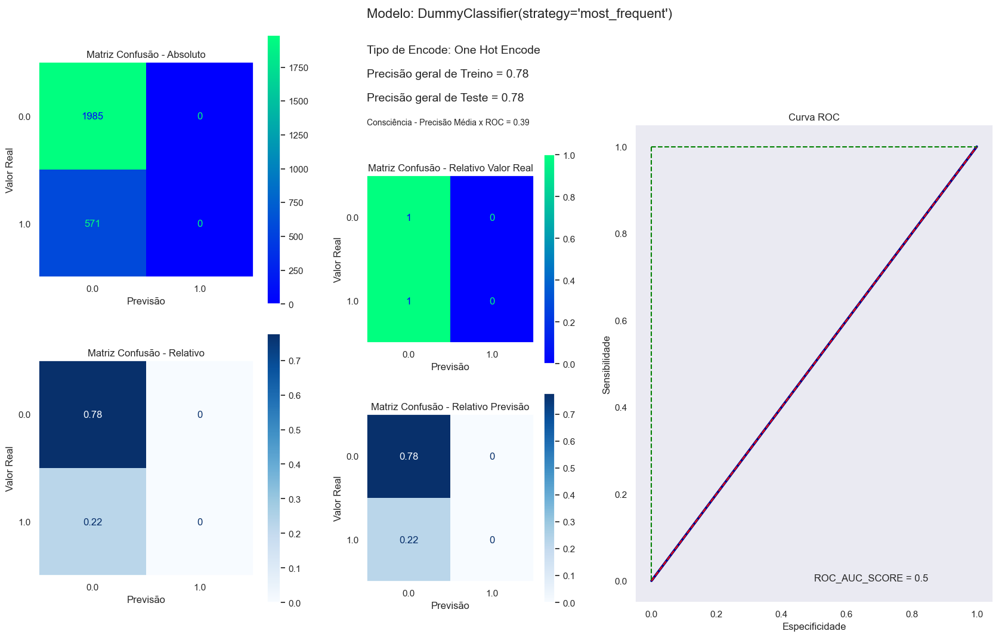

A precisão para AluraCash_fr de foi 77.66% no Most_frequent.
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.78      1.00      0.87      1985
           1       0.00      0.00      0.00       571

    accuracy                           0.78      2556
   macro avg       0.39      0.50      0.44      2556
weighted avg       0.60      0.78      0.68      2556



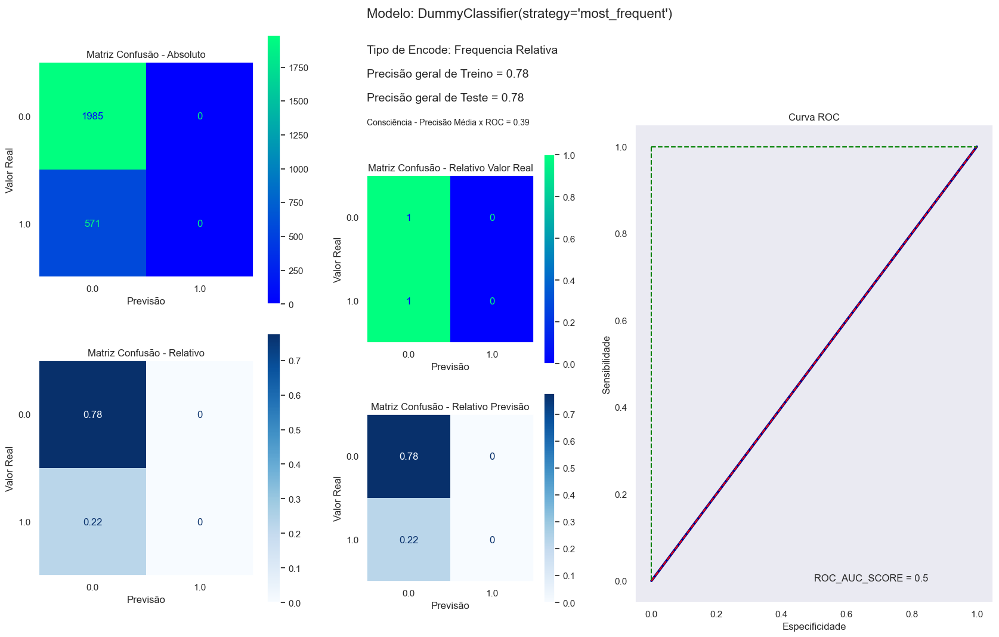

In [171]:
print('Teste com Dummy - Most_frequent')
print('='*70)

modelo = DummyClassifier(strategy='most_frequent')
modelo.fit(xe_treino, ye_treino)
previsoes = modelo.predict(xe_teste)

acuracia1 = accuracy_score(ye_teste, previsoes) * 100
print('A precisão para AluraCash_encode de foi %.2f%% no Most_frequent.' % acuracia1)
print('_'*70)
print(classification_report(ye_teste, previsoes, zero_division=0))

prob_previsao1 = modelo.predict_proba(xe_teste)[:,1]
relatorio_de_resultado(modelo, xe_treino, ye_treino, xe_teste, ye_teste, modelo, previsoes, 'One Hot Encode')

modelo = DummyClassifier(strategy='most_frequent')
modelo.fit(xf_treino, yf_treino)
previsoes2 = modelo.predict(xf_teste)

acuracia2 = accuracy_score(yf_teste, previsoes2) * 100
print('A precisão para AluraCash_fr de foi %.2f%% no Most_frequent.' % acuracia2)
print('_'*70)
print(classification_report(yf_teste, previsoes2, zero_division=0))

prob_previsao2 = modelo.predict_proba(xf_teste)[:,1]
relatorio_de_resultado(modelo, xe_treino, ye_treino, xe_teste, ye_teste, modelo, previsoes2, 'Frequencia Relativa')

#Dados do dicionário de Resultados
acc1 = round(acuracia1, 2) #Acc OneHotEncoder
vp1 = round(confusion_matrix(ye_teste, previsoes, normalize='true')[0][0],2)#Recall/OHE - VP
vn1 = round(confusion_matrix(ye_teste, previsoes, normalize='true')[1][1],2)#Recall/OHE - VN
tt1 = round(modelo.score(xe_treino, ye_treino),2) - round(modelo.score(xe_teste, ye_teste),2)
consc1 = round((roc_auc_score(ye_teste, prob_previsao1)*(modelo.score(xe_treino, ye_treino) + modelo.score(xe_teste, ye_teste))/2),2)
acc2 = round(acuracia2, 2) # Acc FreqRelativa
vp2 = round(confusion_matrix(yf_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
vn2 = round(confusion_matrix(yf_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
tt2 = round(modelo.score(xf_treino, yf_treino),2) - round(modelo.score(xf_teste, yf_teste),2)
consc2 = round((roc_auc_score(yf_teste, prob_previsao2)*(modelo.score(xf_treino, yf_treino) + modelo.score(xf_teste, yf_teste))/2),2)

pacote = resultado_testes
dicionario_resultado = {str(modelo): [acc1, vp1, vn1, tt1, consc1, acc2, vp2, vn2, tt2, consc2]}
resultado_testes = {**pacote, **dicionario_resultado}

# Métodos
A definição dos métodos será inicialmente com os parâmetros default - para controle vinculamos apenas a SEED

In [172]:
metodos = (RandomForestClassifier(random_state=SEED),
 BalancedRandomForestClassifier(random_state=SEED),
 DecisionTreeClassifier(random_state=SEED),
 GradientBoostingClassifier(random_state=SEED),
 HistGradientBoostingClassifier(random_state=SEED),
 LogisticRegression(random_state=SEED))

### Testes com One Hot Encoder e Frequencia Relativa

Treino com 23000 entradas.
Teste com 2556 registros.
RandomForestClassifier(random_state=42)
A Precisão Geral do RandomForestClassifier(random_state=42) com OneHotEncode foi de 93.31%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.93      0.99      0.96      1985
         1.0       0.96      0.73      0.83       571

    accuracy                           0.93      2556
   macro avg       0.94      0.86      0.89      2556
weighted avg       0.94      0.93      0.93      2556



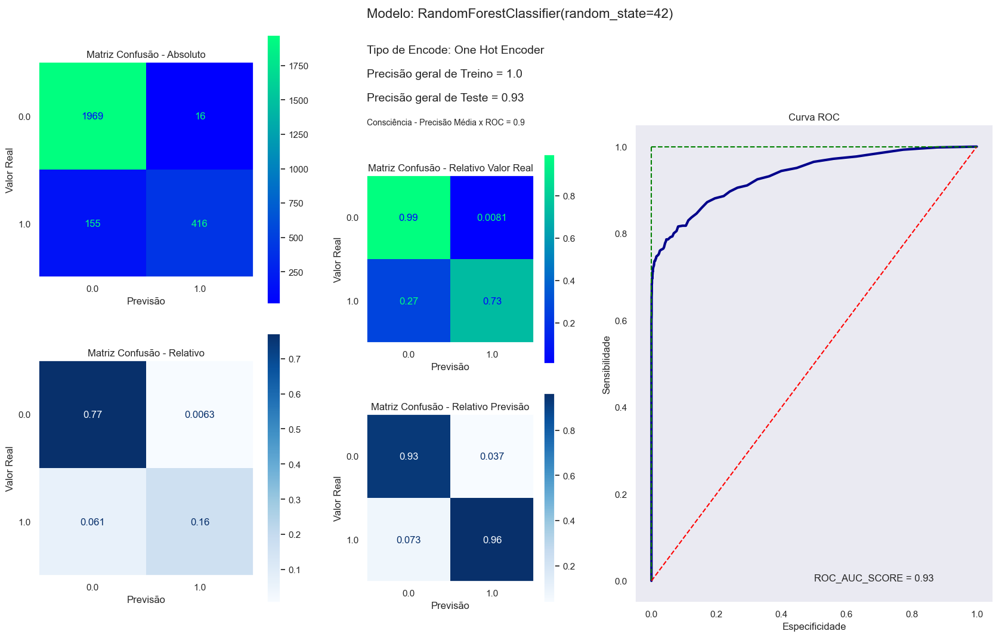

A Precisão Geral do RandomForestClassifier(random_state=42) com FreqRelativa foi de 93.27%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.93      0.99      0.96      1985
           1       0.97      0.73      0.83       571

    accuracy                           0.93      2556
   macro avg       0.95      0.86      0.89      2556
weighted avg       0.93      0.93      0.93      2556



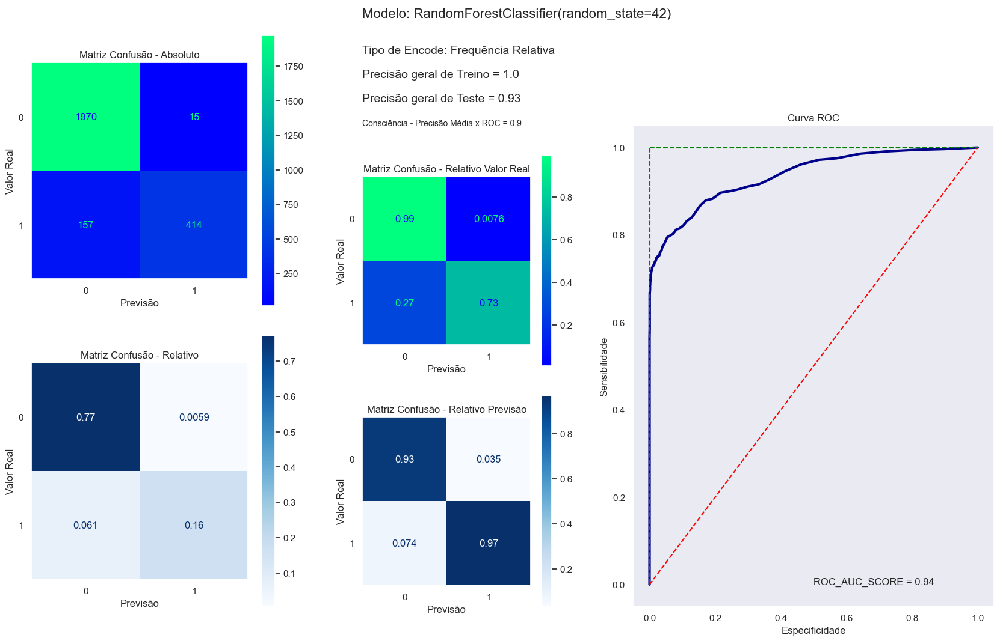

BalancedRandomForestClassifier(random_state=42)
A Precisão Geral do BalancedRandomForestClassifier(random_state=42) com OneHotEncode foi de 90.02%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.94      0.93      0.94      1985
         1.0       0.77      0.80      0.78       571

    accuracy                           0.90      2556
   macro avg       0.85      0.86      0.86      2556
weighted avg       0.90      0.90      0.90      2556



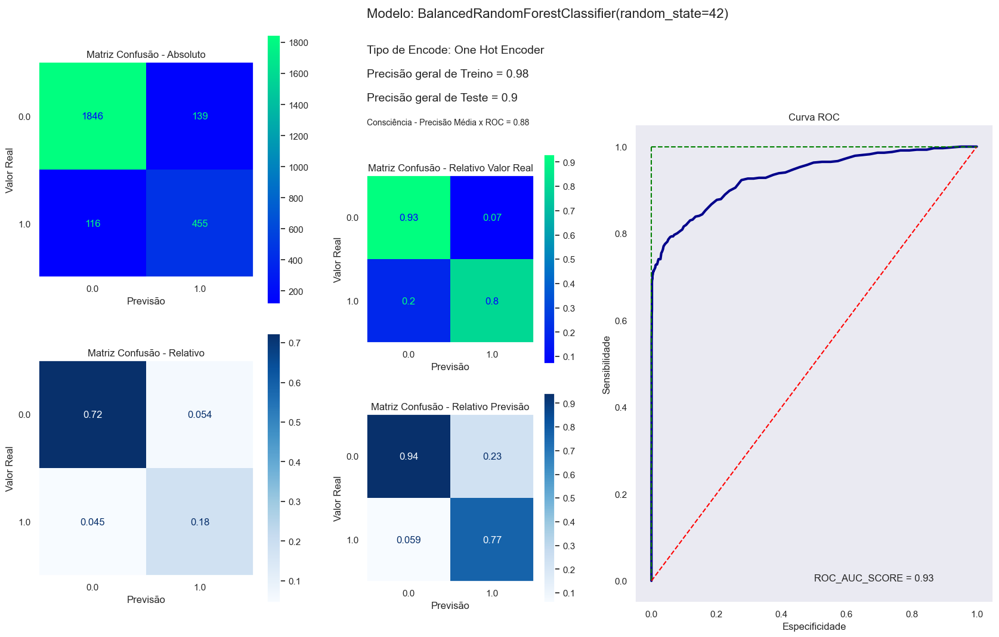

A Precisão Geral do BalancedRandomForestClassifier(random_state=42) com FreqRelativa foi de 90.26%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.93      0.94      1985
           1       0.78      0.79      0.78       571

    accuracy                           0.90      2556
   macro avg       0.86      0.86      0.86      2556
weighted avg       0.90      0.90      0.90      2556



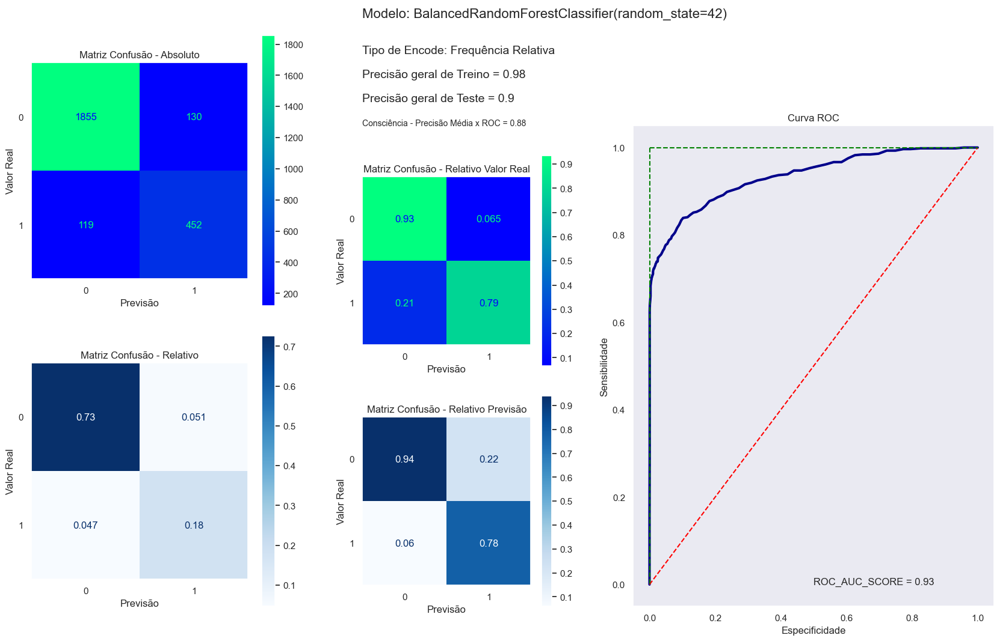

DecisionTreeClassifier(random_state=42)
A Precisão Geral do DecisionTreeClassifier(random_state=42) com OneHotEncode foi de 88.15%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.93      0.91      0.92      1985
         1.0       0.72      0.77      0.74       571

    accuracy                           0.88      2556
   macro avg       0.83      0.84      0.83      2556
weighted avg       0.88      0.88      0.88      2556



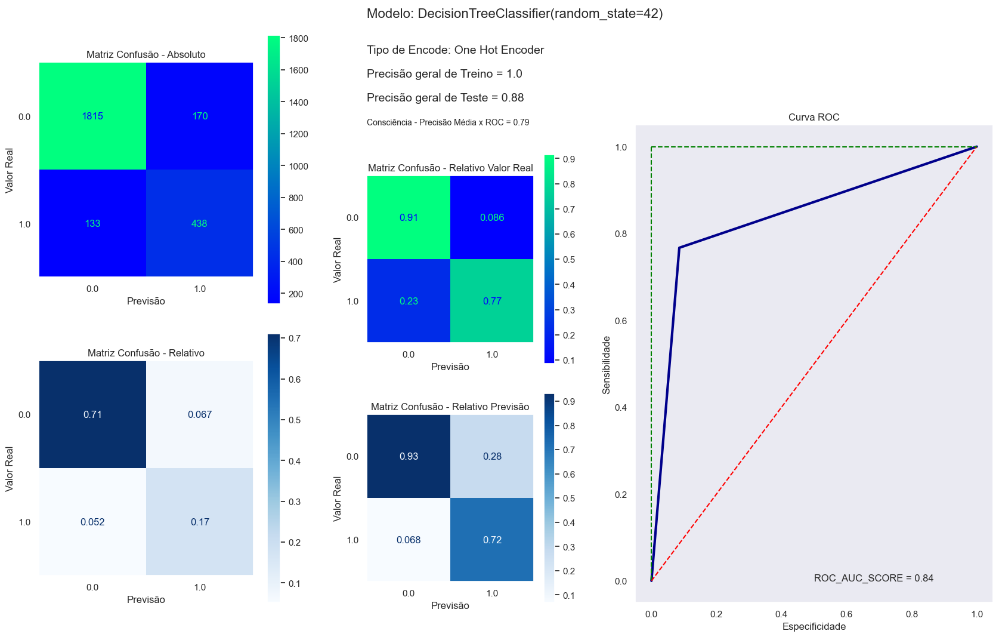

A Precisão Geral do DecisionTreeClassifier(random_state=42) com FreqRelativa foi de 89.59%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.93      0.93      1985
           1       0.76      0.79      0.77       571

    accuracy                           0.90      2556
   macro avg       0.85      0.86      0.85      2556
weighted avg       0.90      0.90      0.90      2556



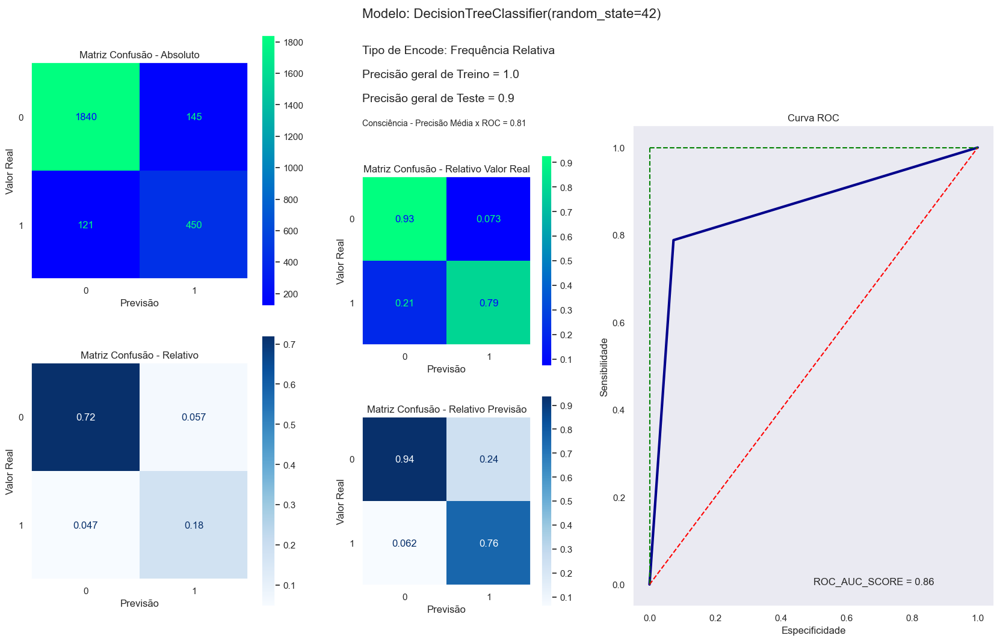

GradientBoostingClassifier(random_state=42)
A Precisão Geral do GradientBoostingClassifier(random_state=42) com OneHotEncode foi de 92.33%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95      1985
         1.0       0.93      0.71      0.81       571

    accuracy                           0.92      2556
   macro avg       0.92      0.85      0.88      2556
weighted avg       0.92      0.92      0.92      2556



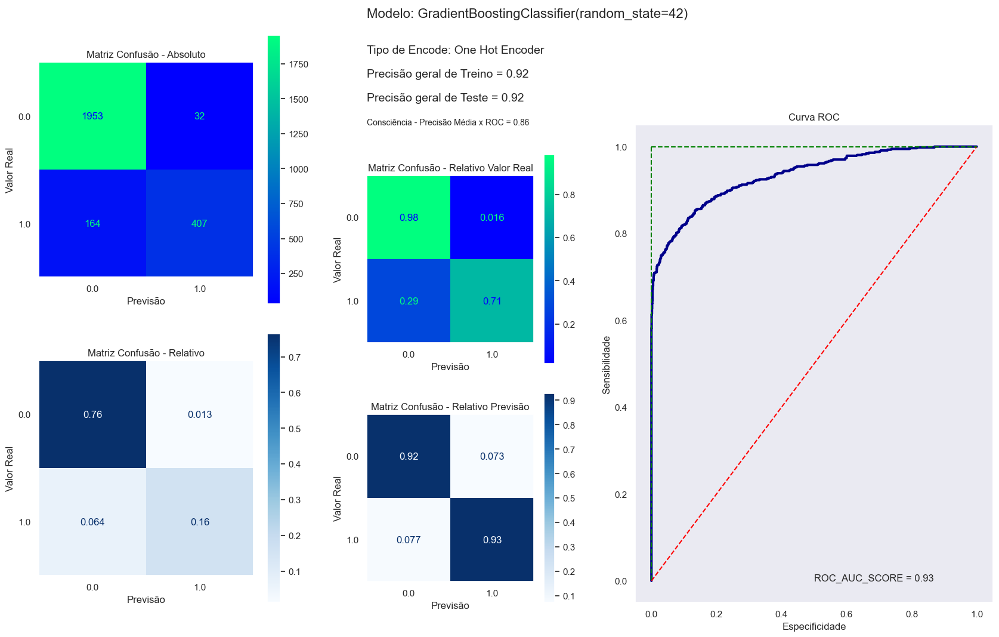

A Precisão Geral do GradientBoostingClassifier(random_state=42) com FreqRelativa foi de 92.53%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.92      0.98      0.95      1985
           1       0.93      0.72      0.81       571

    accuracy                           0.93      2556
   macro avg       0.93      0.85      0.88      2556
weighted avg       0.93      0.93      0.92      2556



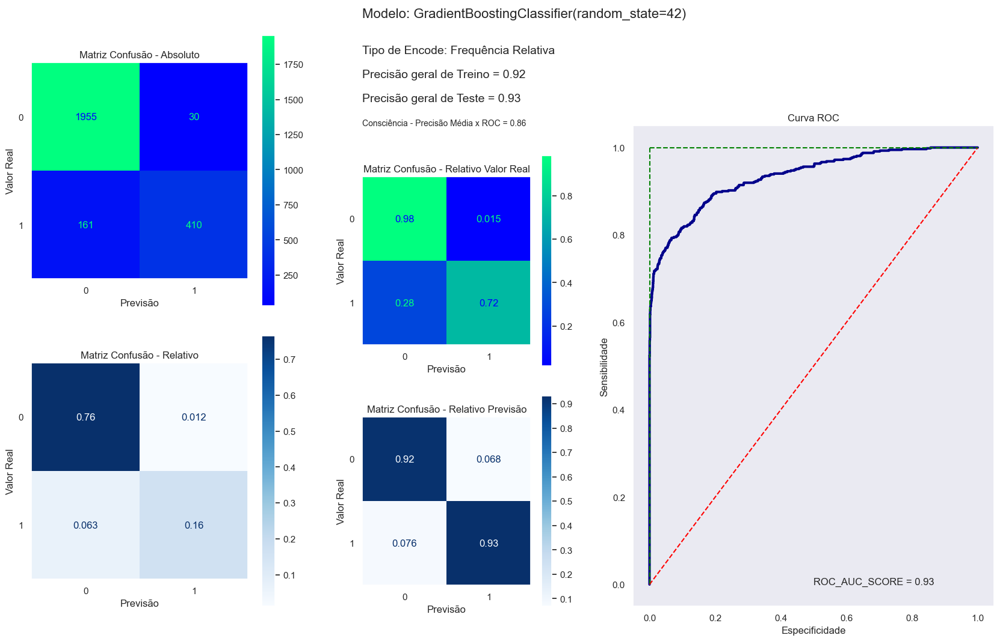

HistGradientBoostingClassifier(random_state=42)
A Precisão Geral do HistGradientBoostingClassifier(random_state=42) com OneHotEncode foi de 93.82%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96      1985
         1.0       0.98      0.74      0.84       571

    accuracy                           0.94      2556
   macro avg       0.96      0.87      0.90      2556
weighted avg       0.94      0.94      0.93      2556



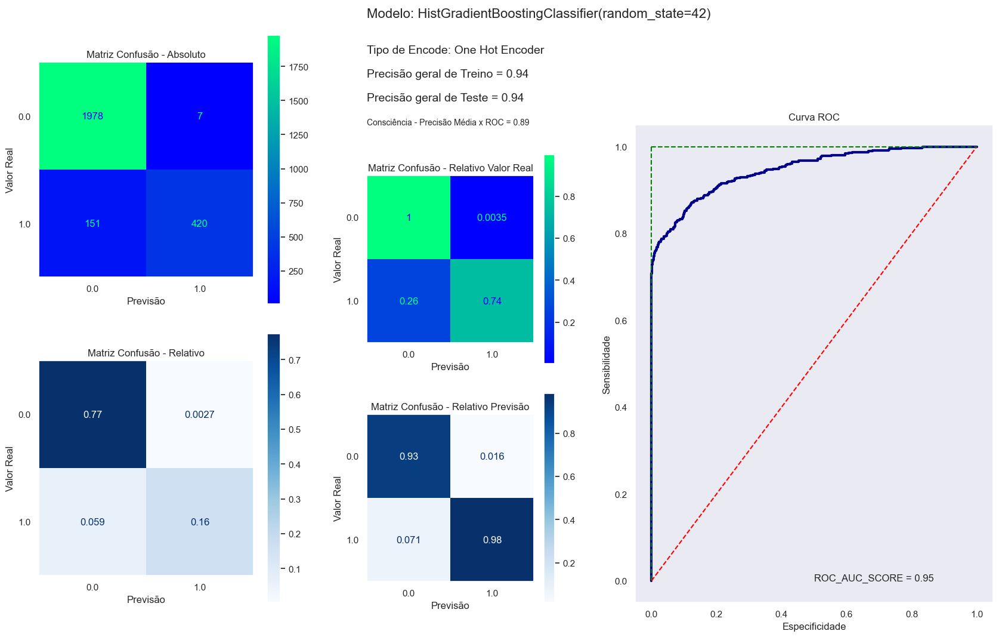

A Precisão Geral do HistGradientBoostingClassifier(random_state=42) com FreqRelativa foi de 93.90%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      1985
           1       0.99      0.74      0.84       571

    accuracy                           0.94      2556
   macro avg       0.96      0.87      0.90      2556
weighted avg       0.94      0.94      0.94      2556



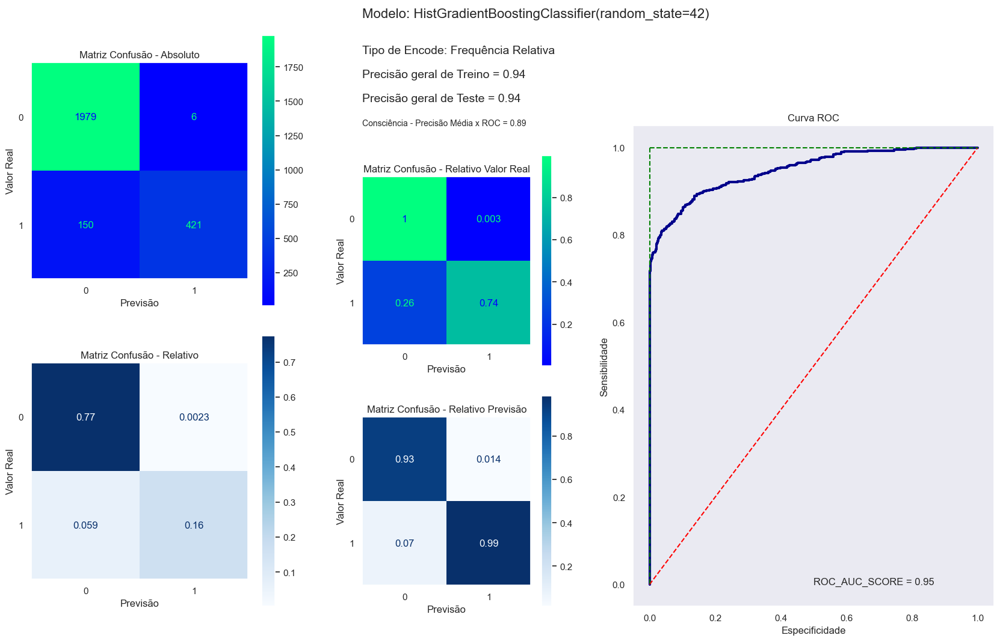

LogisticRegression(random_state=42)
A Precisão Geral do LogisticRegression(random_state=42) com OneHotEncode foi de 87.09%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.89      0.95      0.92      1985
         1.0       0.77      0.60      0.67       571

    accuracy                           0.87      2556
   macro avg       0.83      0.77      0.80      2556
weighted avg       0.86      0.87      0.86      2556



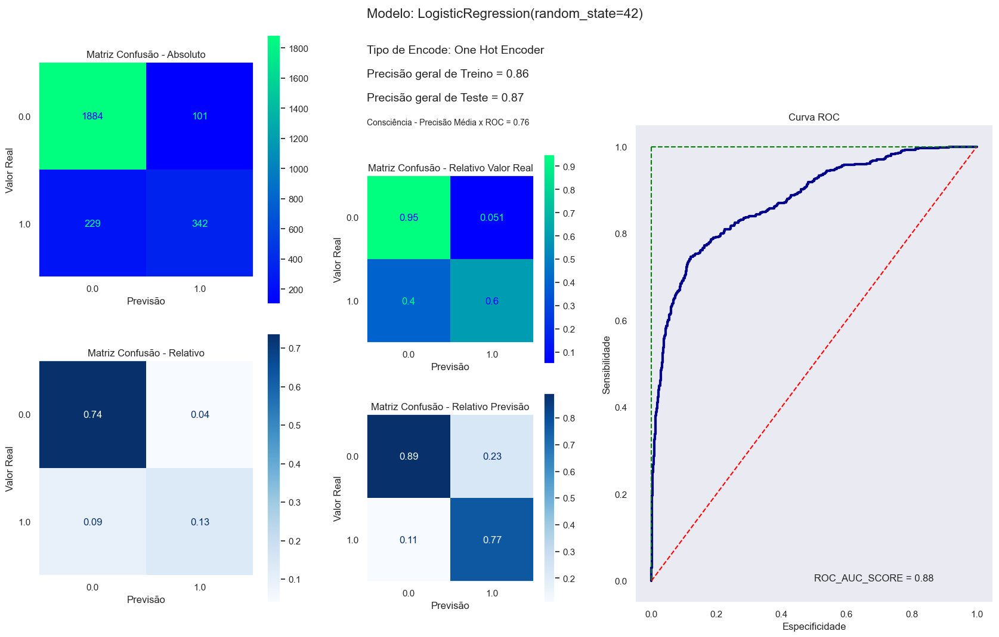

A Precisão Geral do LogisticRegression(random_state=42) com FreqRelativa foi de 86.85%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1985
           1       0.77      0.58      0.67       571

    accuracy                           0.87      2556
   macro avg       0.83      0.77      0.79      2556
weighted avg       0.86      0.87      0.86      2556



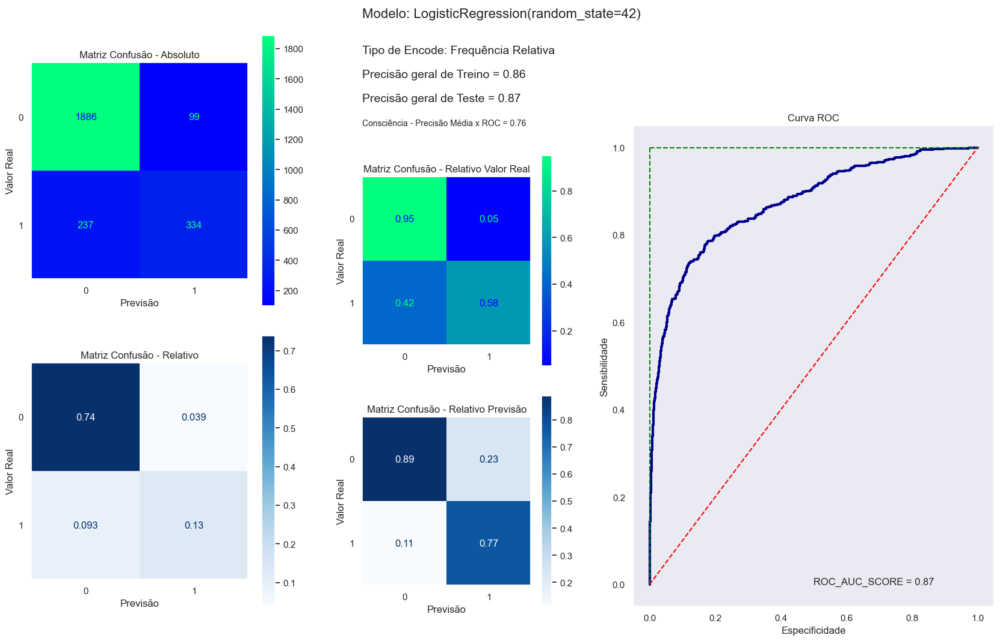

In [173]:
print('Treino com {} entradas.'.format(len(xe_treino)))
print('Teste com {} registros.'.format(len(xe_teste)))

for i in range(len(metodos)):
    print(70*'=')
    print(metodos[i])
    print(70*'=')
    
    escalador = StandardScaler()
    modo = metodos[i]
    
    escalador.fit(xe_treino)
    x_treino = escalador.transform(xe_treino)
    x_teste = escalador.transform(xe_teste)

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(x_treino, ye_treino)

    previsoes = modelo.predict(x_teste)

    acuracia1 = (accuracy_score(ye_teste,previsoes))*100
    print('A Precisão Geral do '+ str(modo) +' com OneHotEncode foi de %.2f%%: ' % acuracia1)
    print('_'*70)
    print(classification_report(ye_teste, previsoes))

    prob_previsao1 = modelo.predict_proba(x_teste)[:,1]
    relatorio_de_resultado(modo, x_treino, ye_treino, x_teste, ye_teste, modelo, previsoes, 'One Hot Encoder')

    #Dados do dicionário de Resultados
    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_teste, previsoes, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_teste, previsoes, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(x_treino, ye_treino),2) - round(modelo.score(x_teste, ye_teste),2)
    consc1 = round((roc_auc_score(ye_teste, prob_previsao1)*(modelo.score(x_treino, ye_treino) + modelo.score(x_teste, ye_teste))/2),2)

    escalador.fit(xf_treino)
    x_treino = escalador.transform(xf_treino)
    x_teste = escalador.transform(xf_teste)

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(x_treino, yf_treino)

    previsoes2 = modelo.predict(x_teste)

    acuracia2 = (accuracy_score(yf_teste,previsoes2))*100
    print('A Precisão Geral do '+ str(modo) +' com FreqRelativa foi de %.2f%%: ' % acuracia2)
    print('_'*70)
    print(classification_report(yf_teste, previsoes2))

    prob_previsao2 = modelo.predict_proba(x_teste)[:,1]
    relatorio_de_resultado(modo, x_treino, yf_treino, x_teste, yf_teste, modelo, previsoes2, 'Frequência Relativa')

    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(x_treino, yf_treino),2) - round(modelo.score(x_teste, yf_teste),2)
    consc2 = round((roc_auc_score(yf_teste, prob_previsao2)*(modelo.score(x_treino, yf_treino) + modelo.score(x_teste, yf_teste))/2),2)


    pacote = resultado_testes
    dicionario_resultado = {str(modo): [acc1, vp1, vn1, tt1, consc1, acc2, vp2, vn2, tt2, consc2]}
    resultado_testes = {**pacote, **dicionario_resultado}   

In [174]:
r1 = pd.DataFrame(resultado_testes).transpose()

In [175]:
#Resultado
# Na tabela de resultados podemos observar:
# Acc : Precisão indica o % de previsões corretas do modelo
# Recall VP : o percentual dos Verdadeiros Positivos que foram corretamente previstos
# Recall VN : o percentual dos  Verdadeiros Negativos que foram corretamente previstos
# Acc Treino - Teste : Precisão de treino - Precisão de teste, mostra se e quanto o treino foi melhor (valores positivos) ou pior (valores negativos) que o teste - dado em pontos percentuais


r1

,0,1,2,3,4,5,6,7,8,9
classificador,Acc OneHotEncoder,Recall/OHE - VP,Recall/OHE - VN,OHE Acc Treino - Teste,OHE Consciência,Acc FreqRelativa,Recall/FR - VP,Recall/FR - VN,FR Acc Treino - Teste,FR Consciência
"DummyClassifier(random_state=42, strategy='stratified')",65.81,0.78,0.24,-0.01,0.33,65.81,0.78,0.24,-0.01,0.33
DummyClassifier(strategy='most_frequent'),77.66,1.0,0.0,0.0,0.39,77.66,1.0,0.0,0.0,0.39
RandomForestClassifier(random_state=42),93.31,0.99,0.73,0.07,0.9,93.27,0.99,0.73,0.07,0.9
BalancedRandomForestClassifier(random_state=42),90.02,0.93,0.8,0.08,0.88,90.26,0.93,0.79,0.08,0.88
DecisionTreeClassifier(random_state=42),88.15,0.91,0.77,0.12,0.79,89.59,0.93,0.79,0.1,0.81
GradientBoostingClassifier(random_state=42),92.33,0.98,0.71,0.0,0.86,92.53,0.98,0.72,-0.01,0.86
HistGradientBoostingClassifier(random_state=42),93.82,1.0,0.74,0.0,0.89,93.9,1.0,0.74,0.0,0.89
LogisticRegression(random_state=42),87.09,0.95,0.6,-0.01,0.76,86.85,0.95,0.58,-0.01,0.76


# **Aprendizado 04** 
## O Que?
    Vamos reaplicar os modelos, mas com amostras balanceadas.
## Por Quê?
    Após a aplicação dos modelos é possivel verificar que há uma diferença muito grande entre as proporções de Adimplentes e Inadimplentes, o que parece estar afetando de certo modo a capacidade de prever corretamente os Verdadeiros Negativos - já que em todos os modelos ele preve com mais eficiência Verdadeiros Positivos (o que é matemáticamente justificável - uma vez que as previsões mais sensíveis, ou mais limitadas, serão verificadas por essa "desproporção");
    Faremos então um balanceamento das amostras para reduzir a diferença de proporção e tentar melhorar esse aspecto preditivo.
## Como?
    utilizaremos dois métodos:
    * Banco de dados sintético por inclusão (Oversampling - **SMOTE**) - baseados nas amostras existentes ele cria amostras sintéticas, da variável minoritária;
    * Banco de dados sintético por exclusão (Undersampling - **InstanceHardnessThreshold**) - baseado nas amostras existentes ele remove amostras da variável majoritária.
    


### Aplicar Balanceamento de dados - por Inclusão (OverSampling)

In [176]:
from imblearn.over_sampling import SMOTE #Opção por incluir "amostras" sintéticas para equilibrar "adimplentes e inadimplentes"

In [177]:
sm = SMOTE(sampling_strategy=1 ,random_state=42)
xe_sm, ye_sm = sm.fit_resample(xe, ye)
xf_sm, yf_sm = sm.fit_resample(xf, yf)

In [178]:
SEED = 42
para_teste = 0.10            

#Criando os DataFrames de teste e treino
xe_sm_treino, xe_sm_teste, ye_sm_treino, ye_sm_teste = train_test_split(xe_sm, ye_sm, random_state=SEED, test_size=para_teste, stratify=ye_sm) # ONEHOTENCODER 
xf_sm_treino, xf_sm_teste, yf_sm_treino, yf_sm_teste = train_test_split(xf_sm, yf_sm, random_state=SEED, test_size=para_teste, stratify=yf_sm) # FrequenciaRelativa 

In [179]:
#Apenas para verificação:
print('Para os DataFrames OHE: Treinaremos com %d elementos e testaremos com %d elementos' % (len(xe_sm_treino), len(xe_sm_teste)))
print('Para os DataFrames FR: Treinaremos com %d elementos e testaremos com %d elementos' % (len(xf_sm_treino), len(xf_sm_teste)))

Para os DataFrames OHE: Treinaremos com 35715 elementos e testaremos com 3969 elementos
Para os DataFrames FR: Treinaremos com 35715 elementos e testaremos com 3969 elementos


In [180]:
#Relação Teste / Treino
print(len(xe_sm_teste)/len(xe_sm_treino))
print(len(xf_sm_teste)/len(xf_sm_treino))

0.11112977740445192
0.11112977740445192


In [181]:
# Dicionários de registro dos resultados
resultado_testes_over={'classificador': ['Acc OneHotEncoder', 'Recall/OHE - VP', 'Recall/OHE - VN', 'OHE Acc Treino - Teste', 'OHE Consciência', 'Acc FreqRelativa', 'Recall/FR - VP','Recall/FR - VN', 'FR Acc Treino - Teste', 'FR Consciência']}

Treino com 35715 entradas.
Teste com 3969 registros.
RandomForestClassifier(random_state=42)
A Precisão Geral do RandomForestClassifier(random_state=42) com OneHotEncode foi de 96.07%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      1985
         1.0       0.99      0.93      0.96      1984

    accuracy                           0.96      3969
   macro avg       0.96      0.96      0.96      3969
weighted avg       0.96      0.96      0.96      3969



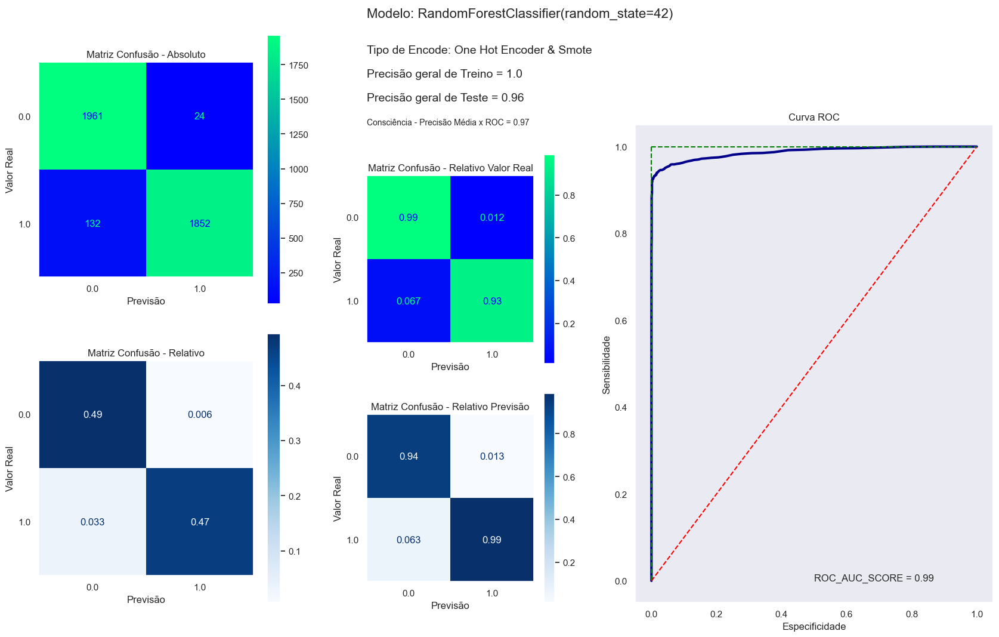

A Precisão Geral do RandomForestClassifier(random_state=42) com FreqRelativa foi de 96.22%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      1985
           1       0.99      0.94      0.96      1984

    accuracy                           0.96      3969
   macro avg       0.96      0.96      0.96      3969
weighted avg       0.96      0.96      0.96      3969



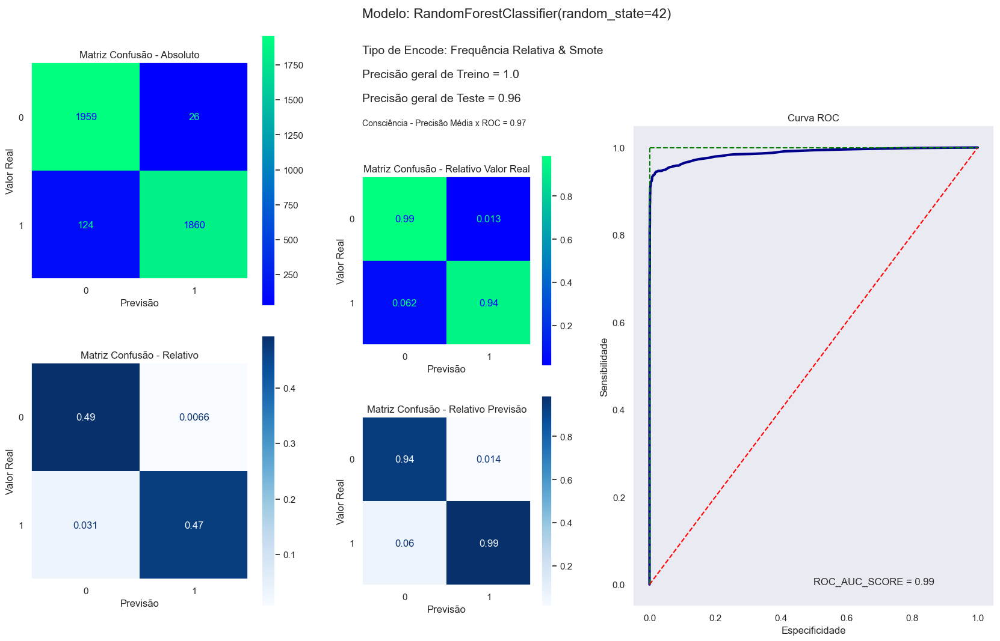

BalancedRandomForestClassifier(random_state=42)
A Precisão Geral do BalancedRandomForestClassifier(random_state=42) com OneHotEncode foi de 96.17%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      1985
         1.0       0.99      0.93      0.96      1984

    accuracy                           0.96      3969
   macro avg       0.96      0.96      0.96      3969
weighted avg       0.96      0.96      0.96      3969



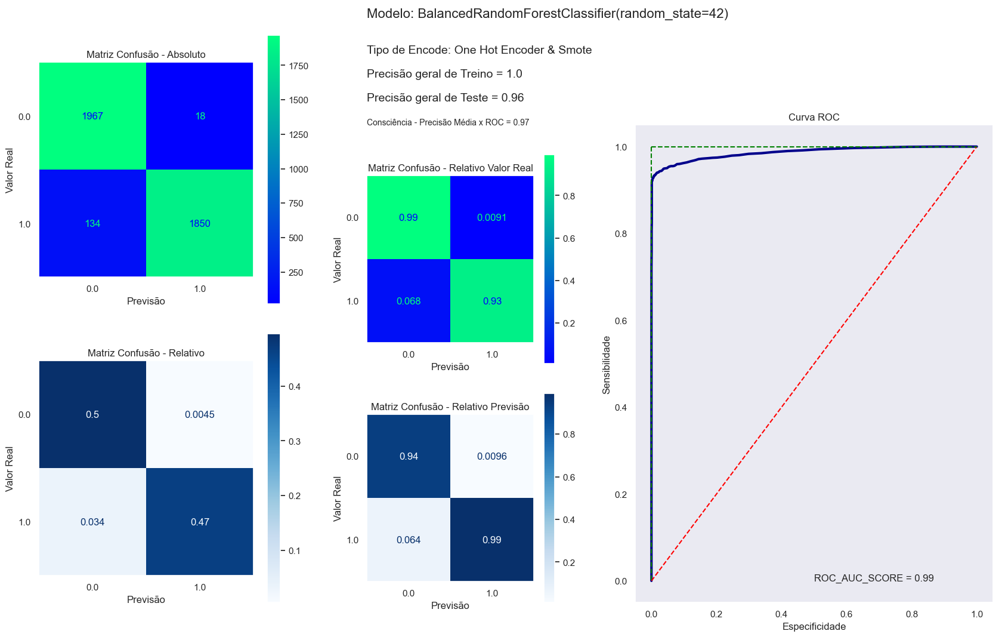

A Precisão Geral do BalancedRandomForestClassifier(random_state=42) com FreqRelativa foi de 96.09%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      1985
           1       0.99      0.93      0.96      1984

    accuracy                           0.96      3969
   macro avg       0.96      0.96      0.96      3969
weighted avg       0.96      0.96      0.96      3969



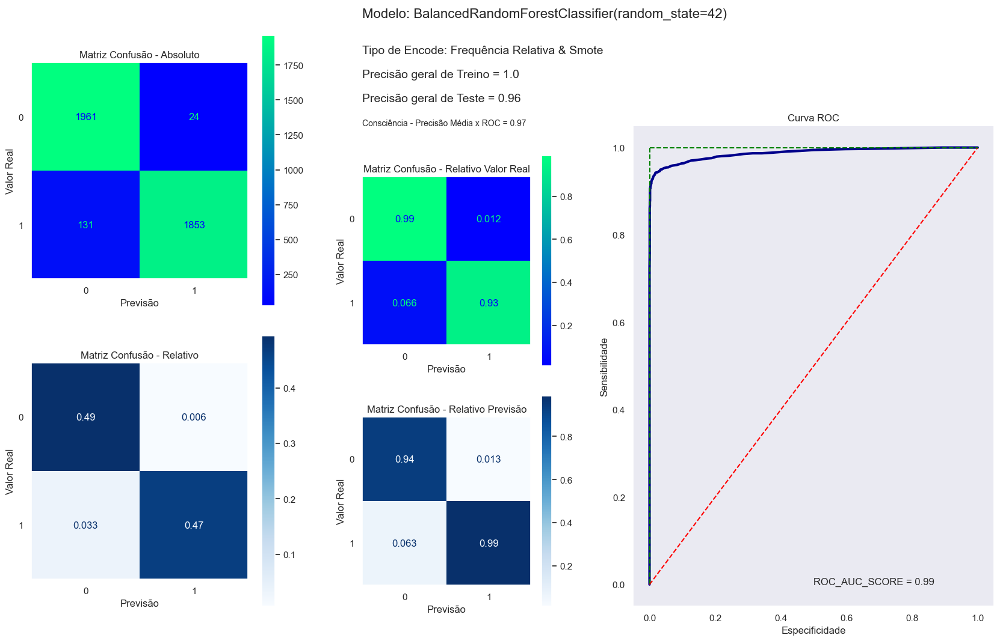

DecisionTreeClassifier(random_state=42)
A Precisão Geral do DecisionTreeClassifier(random_state=42) com OneHotEncode foi de 93.00%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.94      0.92      0.93      1985
         1.0       0.92      0.94      0.93      1984

    accuracy                           0.93      3969
   macro avg       0.93      0.93      0.93      3969
weighted avg       0.93      0.93      0.93      3969



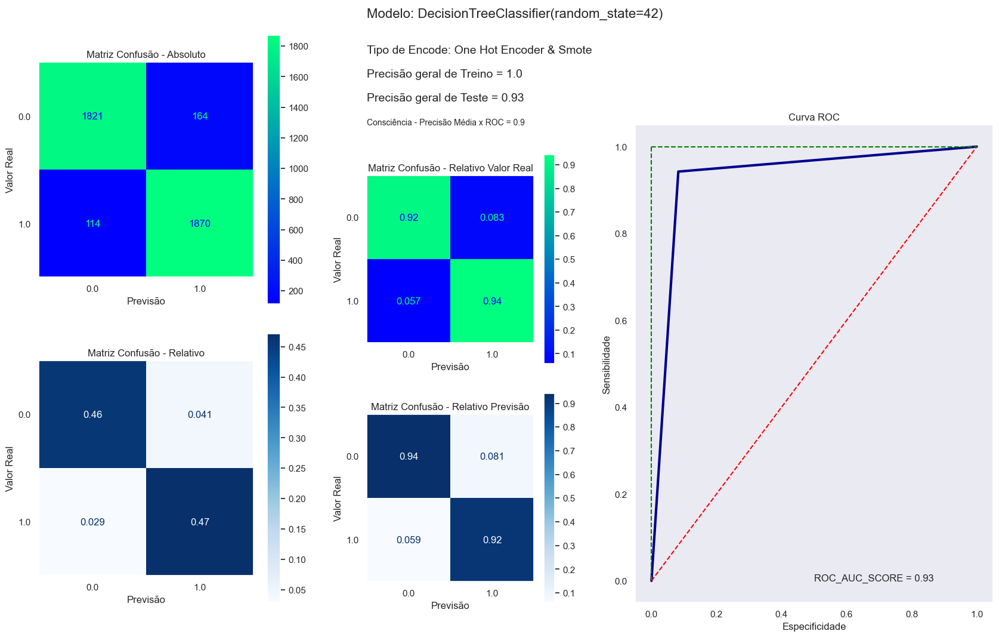

A Precisão Geral do DecisionTreeClassifier(random_state=42) com FreqRelativa foi de 93.52%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.92      0.93      1985
           1       0.93      0.95      0.94      1984

    accuracy                           0.94      3969
   macro avg       0.94      0.94      0.94      3969
weighted avg       0.94      0.94      0.94      3969



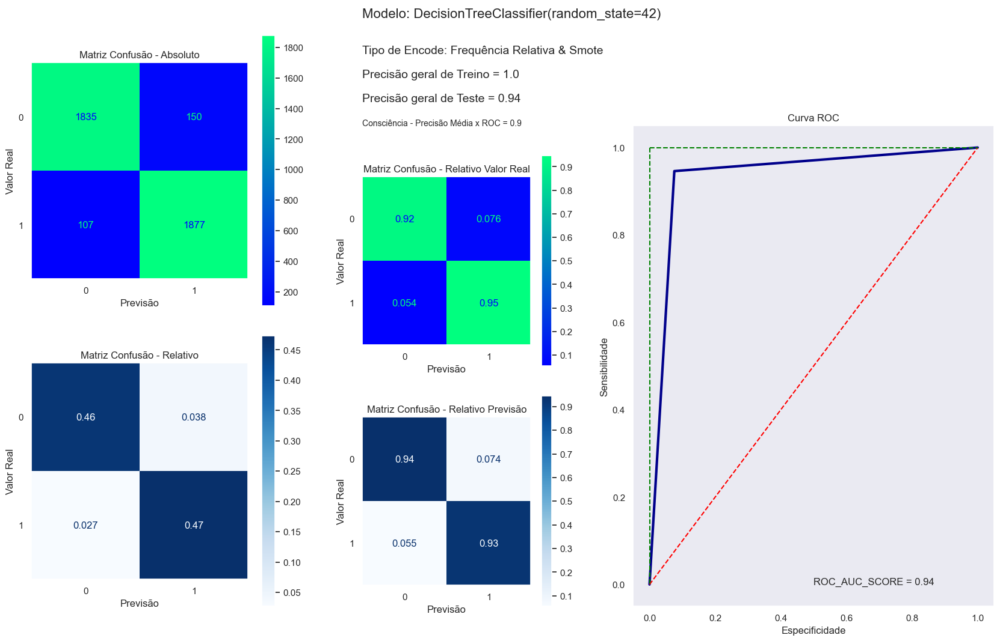

GradientBoostingClassifier(random_state=42)
A Precisão Geral do GradientBoostingClassifier(random_state=42) com OneHotEncode foi de 94.91%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95      1985
         1.0       0.97      0.92      0.95      1984

    accuracy                           0.95      3969
   macro avg       0.95      0.95      0.95      3969
weighted avg       0.95      0.95      0.95      3969



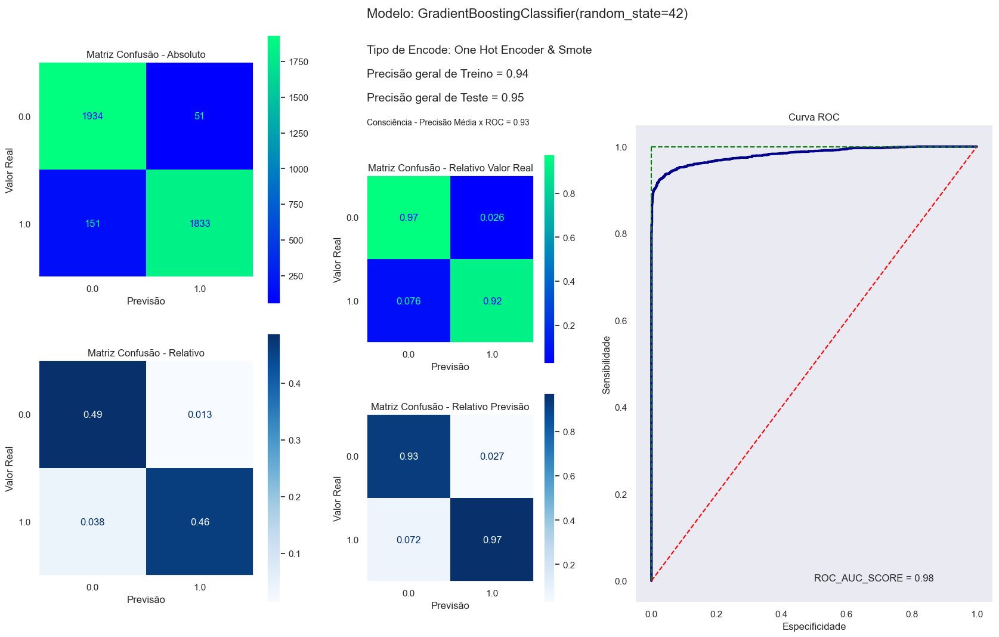

A Precisão Geral do GradientBoostingClassifier(random_state=42) com FreqRelativa foi de 94.36%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.92      0.97      0.95      1985
           1       0.97      0.91      0.94      1984

    accuracy                           0.94      3969
   macro avg       0.95      0.94      0.94      3969
weighted avg       0.95      0.94      0.94      3969



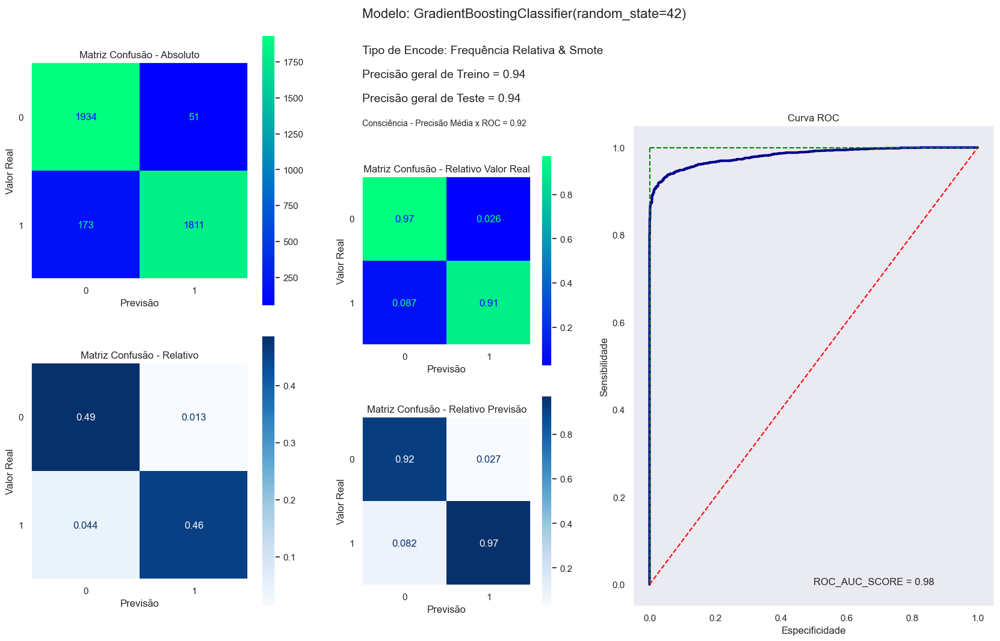

HistGradientBoostingClassifier(random_state=42)
A Precisão Geral do HistGradientBoostingClassifier(random_state=42) com OneHotEncode foi de 96.32%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.94      0.99      0.96      1985
         1.0       0.99      0.93      0.96      1984

    accuracy                           0.96      3969
   macro avg       0.97      0.96      0.96      3969
weighted avg       0.97      0.96      0.96      3969



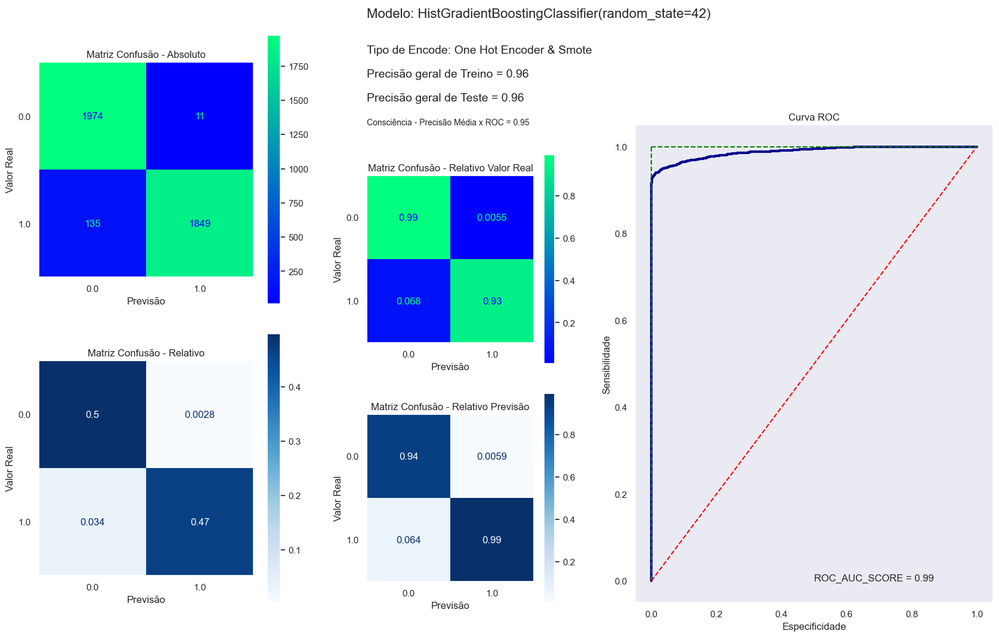

A Precisão Geral do HistGradientBoostingClassifier(random_state=42) com FreqRelativa foi de 96.30%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      1985
           1       1.00      0.93      0.96      1984

    accuracy                           0.96      3969
   macro avg       0.96      0.96      0.96      3969
weighted avg       0.96      0.96      0.96      3969



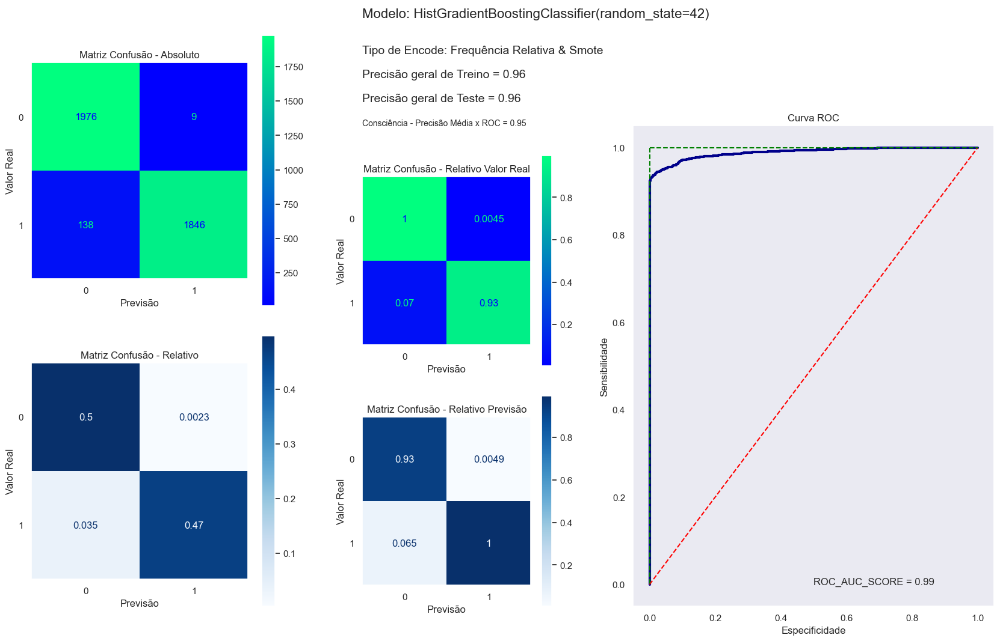

LogisticRegression(random_state=42)
A Precisão Geral do LogisticRegression(random_state=42) com OneHotEncode foi de 81.53%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.81      0.82      0.82      1985
         1.0       0.82      0.81      0.81      1984

    accuracy                           0.82      3969
   macro avg       0.82      0.82      0.82      3969
weighted avg       0.82      0.82      0.82      3969



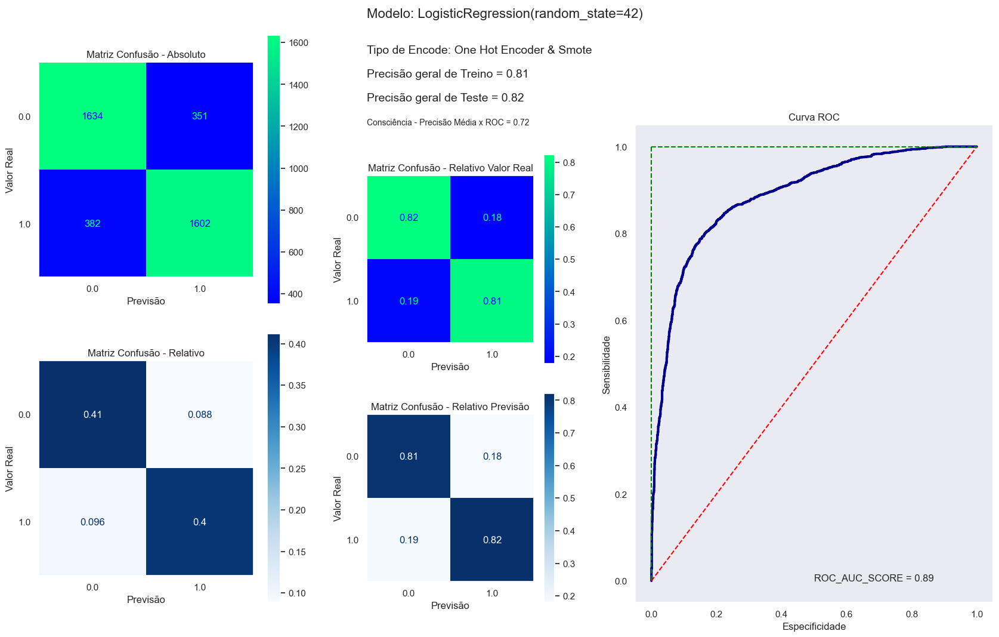

A Precisão Geral do LogisticRegression(random_state=42) com FreqRelativa foi de 81.23%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.81      0.82      0.81      1985
           1       0.82      0.81      0.81      1984

    accuracy                           0.81      3969
   macro avg       0.81      0.81      0.81      3969
weighted avg       0.81      0.81      0.81      3969



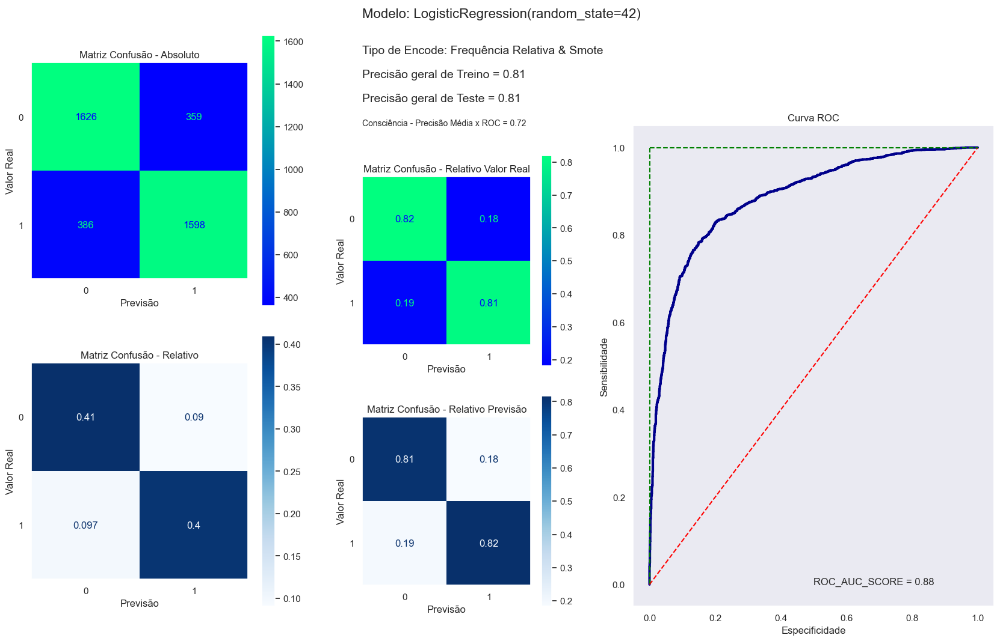

In [182]:
print('Treino com {} entradas.'.format(len(xe_sm_treino)))
print('Teste com {} registros.'.format(len(xe_sm_teste)))

for i in range(len(metodos)):
    print(70*'=')
    print(metodos[i])
    print(70*'=')

    escalador = StandardScaler()
    modo = metodos[i]
    
    escalador.fit(xe_sm_treino)
    x_treino = escalador.transform(xe_sm_treino)
    x_teste = escalador.transform(xe_sm_teste)

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(x_treino, ye_sm_treino)

    previsoes = modelo.predict(x_teste)

    acuracia1 = (accuracy_score(ye_sm_teste,previsoes))*100
    print('A Precisão Geral do '+ str(modo) +' com OneHotEncode foi de %.2f%%: ' % acuracia1)
    print('_'*70)
    print(classification_report(ye_sm_teste, previsoes))

    prob_previsao1 = modelo.predict_proba(x_teste)[:,1]
    relatorio_de_resultado(modo, x_treino, ye_sm_treino, x_teste, ye_sm_teste, modelo, previsoes, 'One Hot Encoder & Smote')
    
    #Dados do dicionário de Resultados
    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_sm_teste, previsoes, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_sm_teste, previsoes, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(x_treino, ye_sm_treino),2) - round(modelo.score(x_teste, ye_sm_teste),2)
    consc1 = round((roc_auc_score(ye_sm_teste, prob_previsao1)*(modelo.score(x_treino, ye_sm_treino) + modelo.score(x_teste, ye_sm_teste))/2),2)


    escalador.fit(xf_sm_treino)
    x_treino = escalador.transform(xf_sm_treino)
    x_teste = escalador.transform(xf_sm_teste)

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(x_treino, yf_sm_treino)

    previsoes2 = modelo.predict(x_teste)

    acuracia2 = (accuracy_score(yf_sm_teste,previsoes2))*100
    print('A Precisão Geral do '+ str(modo) +' com FreqRelativa foi de %.2f%%: ' % acuracia2)
    print('_'*70)
    print(classification_report(yf_sm_teste, previsoes2))

    prob_previsao2 = modelo.predict_proba(x_teste)[:,1]
    relatorio_de_resultado(modo, x_treino, yf_sm_treino, x_teste, yf_sm_teste, modelo, previsoes2, 'Frequência Relativa & Smote')
   
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(x_treino, yf_sm_treino),2) - round(modelo.score(x_teste, yf_sm_teste),2)
    consc2 = round((roc_auc_score(yf_sm_teste, prob_previsao2)*(modelo.score(x_treino, yf_sm_treino) + modelo.score(x_teste, yf_sm_teste))/2),2)

    pacote = resultado_testes_over
    dicionario_resultado = {str(modo): [acc1, vp1, vn1, tt1, consc1, acc2, vp2, vn2, tt2, consc2]}
    resultado_testes_over = {**pacote, **dicionario_resultado}   
   

### Aplicar Balanceamento de dados - por extração (UnderSampling)

In [183]:
from imblearn.under_sampling import InstanceHardnessThreshold #Opção por excluir "amostras" da classe majoritária para equilibrar "adimplentes e inadimplentes"

In [184]:
ye_int=ye.astype(int) #Como o OHE transformou todos os campos em FLOAT vamos retornar  para INT (alguns classificadores, e métodos precisam de dados booleanos ou inteiros)

In [185]:
iht = InstanceHardnessThreshold(sampling_strategy='majority', random_state=42, cv=4)


xe_iht, ye_iht = iht.fit_resample(xe, ye_int)
xf_iht, yf_iht = iht.fit_resample(xf, yf)

In [186]:
print('OHE_iht amostras 0 e 1 -> %d - %d' % (len(ye_iht[ye_iht == 0]), len(ye_iht[ye_iht == 1]) ))
print('FR_iht amostras 0 e 1 -> %d - %d' % (len(yf_iht[yf_iht == 0]), len(yf_iht[yf_iht == 1]) ))

OHE_iht amostras 0 e 1 -> 6117 - 5714
FR_iht amostras 0 e 1 -> 5775 - 5714


In [187]:
SEED = 42
para_teste = 0.10

#Criando os DataFrames de teste e treino
xe_iht_treino, xe_iht_teste, ye_iht_treino, ye_iht_teste = train_test_split(xe_iht, ye_iht, random_state=SEED, test_size=para_teste, stratify=ye_iht) # ONEHOTENCODER 
xf_iht_treino, xf_iht_teste, yf_iht_treino, yf_iht_teste = train_test_split(xf_iht, yf_iht, random_state=SEED, test_size=para_teste, stratify=yf_iht) # FrequenciaRelativa 

In [188]:
#Apenas para verificação:
print('Para os DataFrames OHE: Treinaremos com %d elementos e testaremos com %d elementos' % (len(xe_iht_treino), len(xe_iht_teste)))
print('Para os DataFrames FR: Treinaremos com %d elementos e testaremos com %d elementos' % (len(xf_iht_treino), len(xf_iht_teste)))

Para os DataFrames OHE: Treinaremos com 10647 elementos e testaremos com 1184 elementos
Para os DataFrames FR: Treinaremos com 10340 elementos e testaremos com 1149 elementos


In [189]:
#Relação Teste / Treino
print('OHE: {}'.format( len(xe_iht_teste)/len(xe_iht_treino)))
print('FR: {}'.format(len(xf_iht_teste)/len(xf_iht_treino)))

OHE: 0.11120503428195735
FR: 0.11112185686653772


In [190]:
# Dicionários de registro dos resultados
resultado_testes_under={'classificador': ['Acc OneHotEncoder', 'Recall/OHE - VP', 'Recall/OHE - VN', 'OHE Acc Treino - Teste', 'OHE Consciência', 'Acc FreqRelativa', 'Recall/FR - VP','Recall/FR - VN', 'FR Acc Treino - Teste', 'FR Consciência']}

Treino com 10647 entradas.
Teste com 1184 registros.
RandomForestClassifier(random_state=42)
A Precisão Geral do RandomForestClassifier(random_state=42) com OneHotEncode foi de 95.95%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.95      0.98      0.96       612
           1       0.97      0.94      0.96       572

    accuracy                           0.96      1184
   macro avg       0.96      0.96      0.96      1184
weighted avg       0.96      0.96      0.96      1184



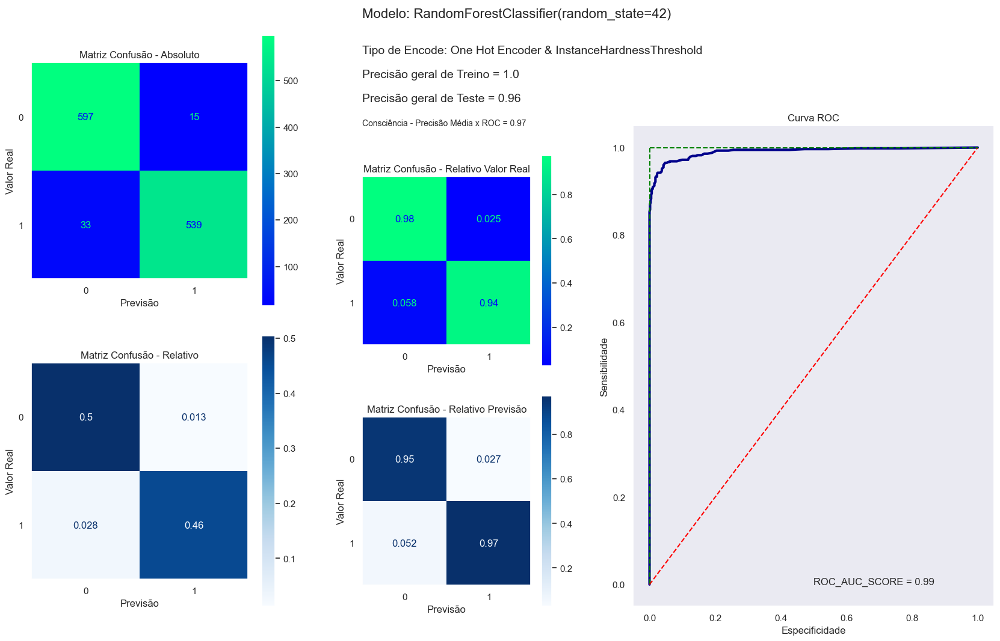

A Precisão Geral do RandomForestClassifier(random_state=42) com FreqRelativa foi de 95.39%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       578
           1       0.98      0.93      0.95       571

    accuracy                           0.95      1149
   macro avg       0.95      0.95      0.95      1149
weighted avg       0.95      0.95      0.95      1149



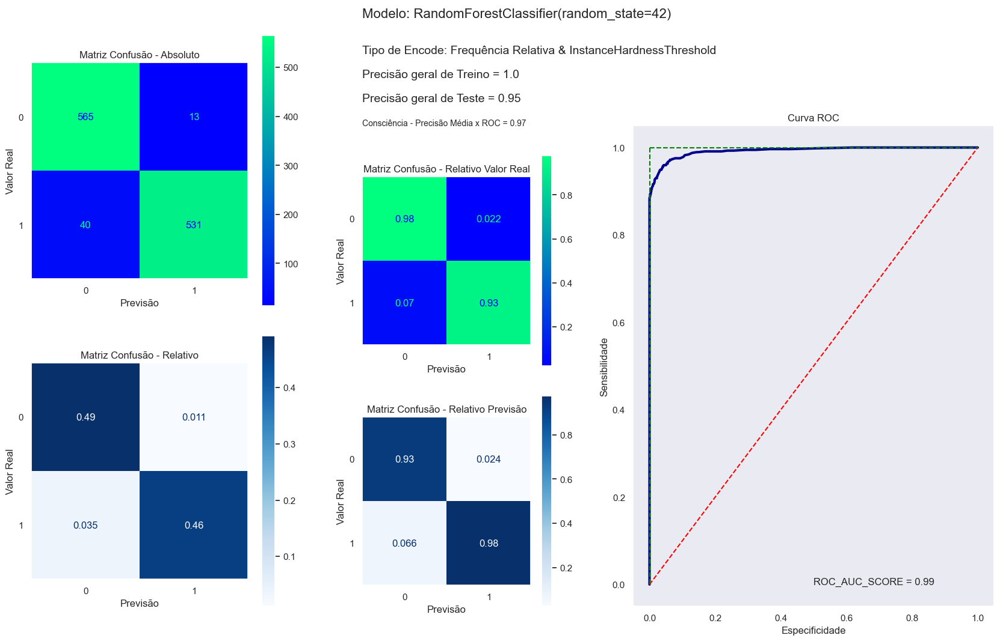

BalancedRandomForestClassifier(random_state=42)
A Precisão Geral do BalancedRandomForestClassifier(random_state=42) com OneHotEncode foi de 95.52%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       612
           1       0.97      0.94      0.95       572

    accuracy                           0.96      1184
   macro avg       0.96      0.95      0.96      1184
weighted avg       0.96      0.96      0.96      1184



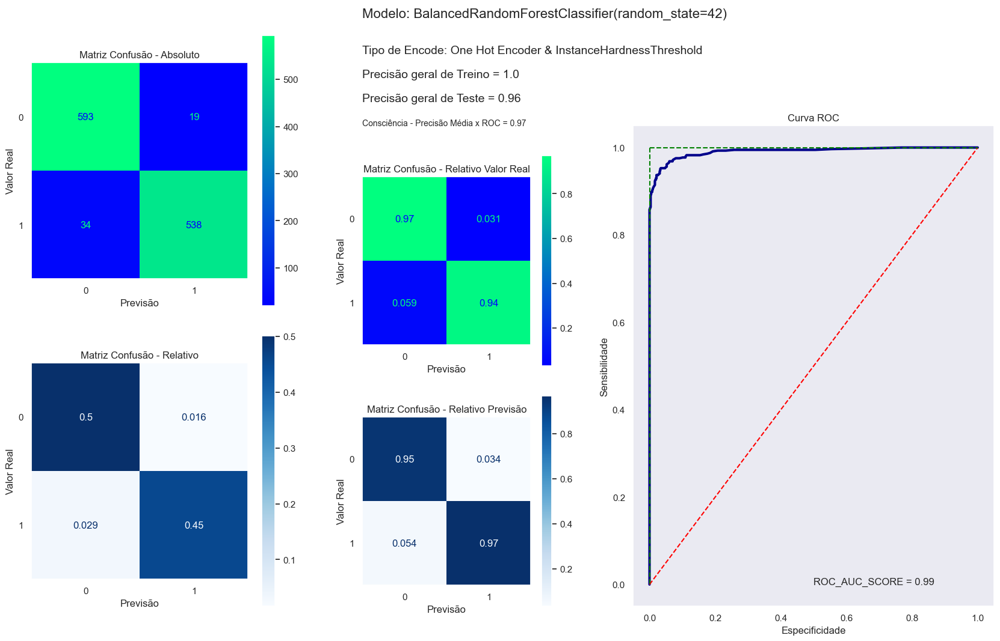

A Precisão Geral do BalancedRandomForestClassifier(random_state=42) com FreqRelativa foi de 95.47%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.93      0.98      0.96       578
           1       0.98      0.93      0.95       571

    accuracy                           0.95      1149
   macro avg       0.96      0.95      0.95      1149
weighted avg       0.96      0.95      0.95      1149



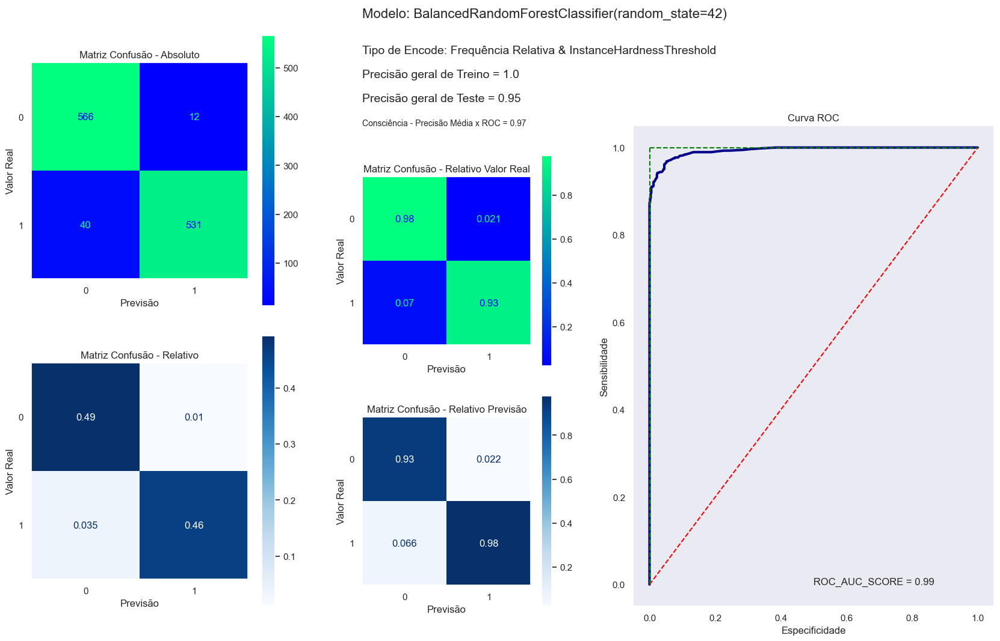

DecisionTreeClassifier(random_state=42)
A Precisão Geral do DecisionTreeClassifier(random_state=42) com OneHotEncode foi de 91.55%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.93      0.90      0.92       612
           1       0.90      0.93      0.91       572

    accuracy                           0.92      1184
   macro avg       0.92      0.92      0.92      1184
weighted avg       0.92      0.92      0.92      1184



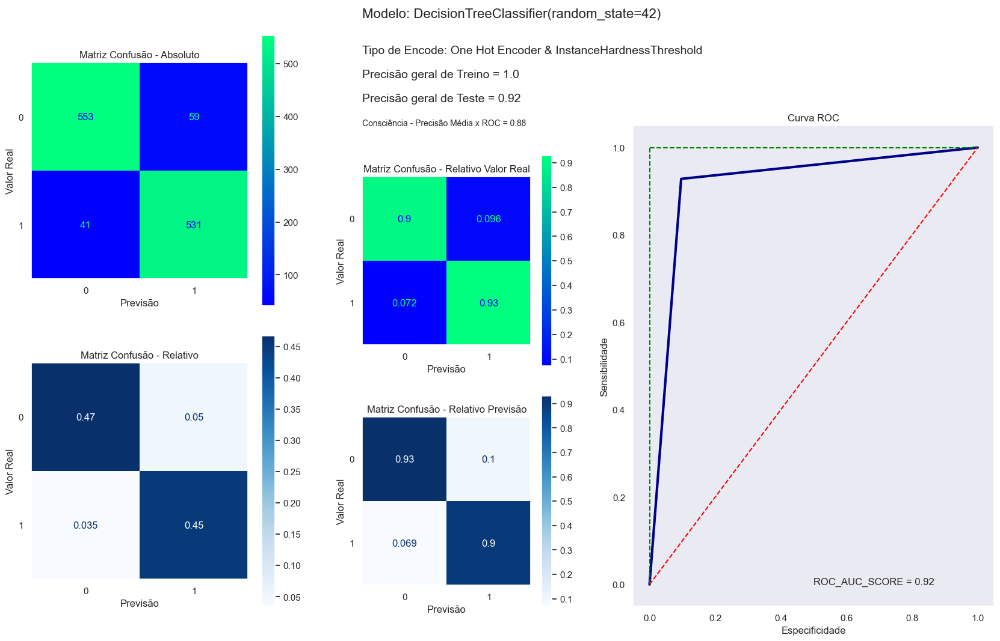

A Precisão Geral do DecisionTreeClassifier(random_state=42) com FreqRelativa foi de 95.13%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.95      0.96      0.95       578
           1       0.95      0.95      0.95       571

    accuracy                           0.95      1149
   macro avg       0.95      0.95      0.95      1149
weighted avg       0.95      0.95      0.95      1149



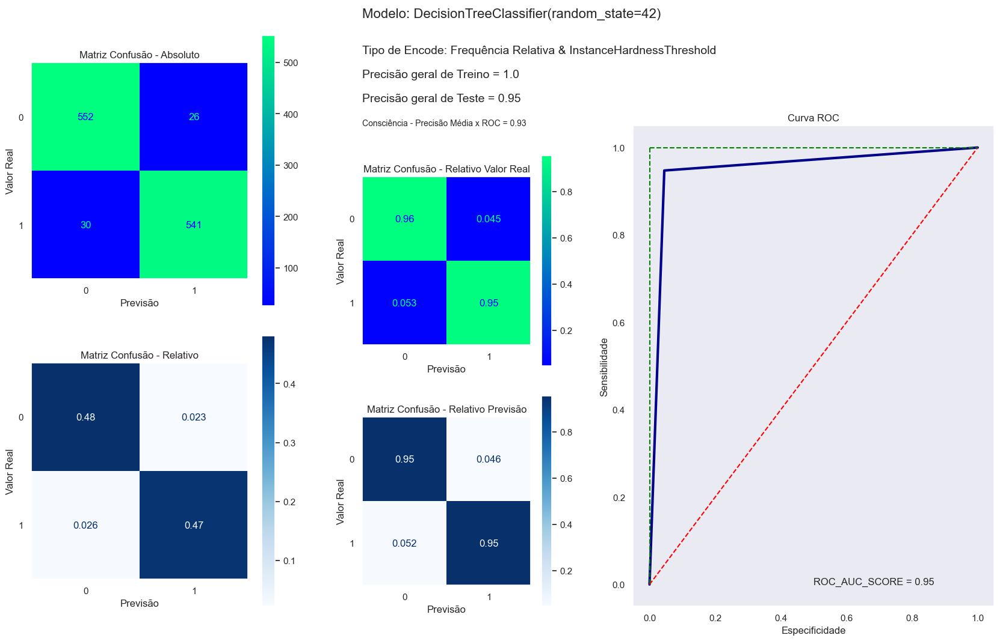

GradientBoostingClassifier(random_state=42)
A Precisão Geral do GradientBoostingClassifier(random_state=42) com OneHotEncode foi de 94.76%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.96      0.95       612
           1       0.96      0.93      0.94       572

    accuracy                           0.95      1184
   macro avg       0.95      0.95      0.95      1184
weighted avg       0.95      0.95      0.95      1184



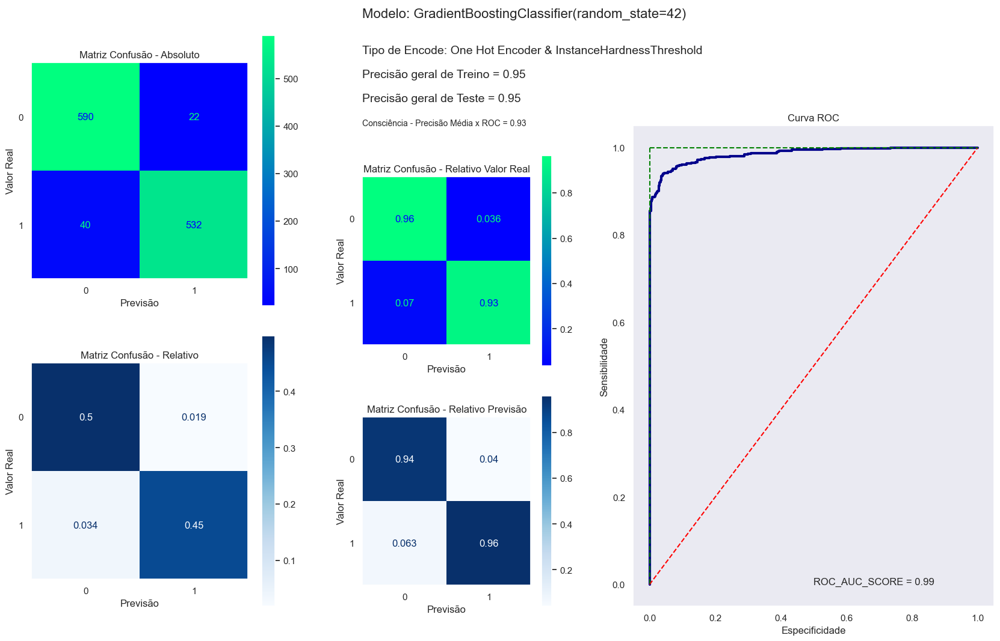

A Precisão Geral do GradientBoostingClassifier(random_state=42) com FreqRelativa foi de 94.43%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.92      0.97      0.95       578
           1       0.97      0.92      0.94       571

    accuracy                           0.94      1149
   macro avg       0.95      0.94      0.94      1149
weighted avg       0.95      0.94      0.94      1149



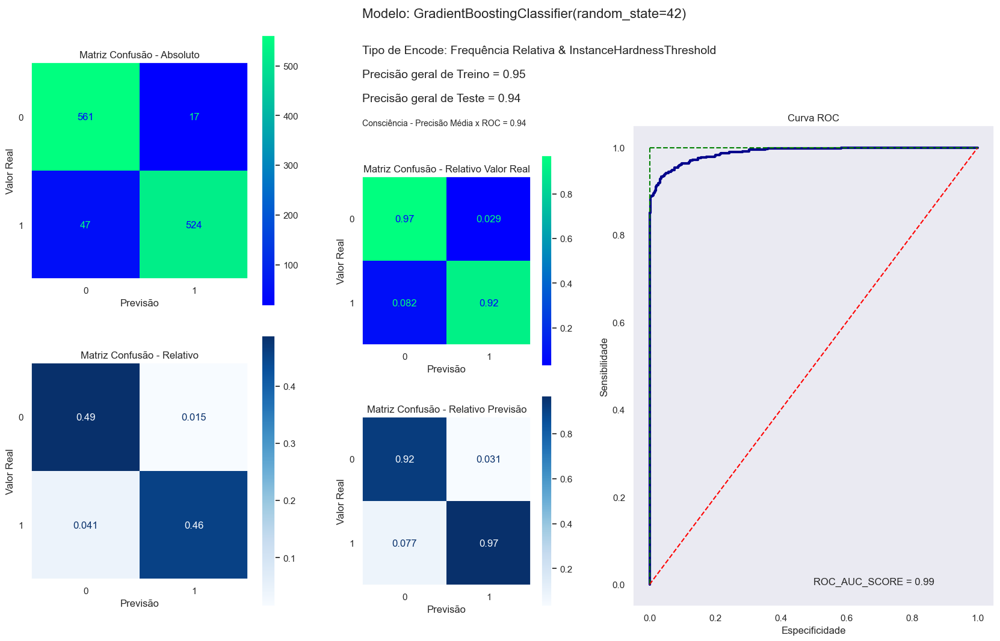

HistGradientBoostingClassifier(random_state=42)
A Precisão Geral do HistGradientBoostingClassifier(random_state=42) com OneHotEncode foi de 95.86%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       612
           1       0.96      0.95      0.96       572

    accuracy                           0.96      1184
   macro avg       0.96      0.96      0.96      1184
weighted avg       0.96      0.96      0.96      1184



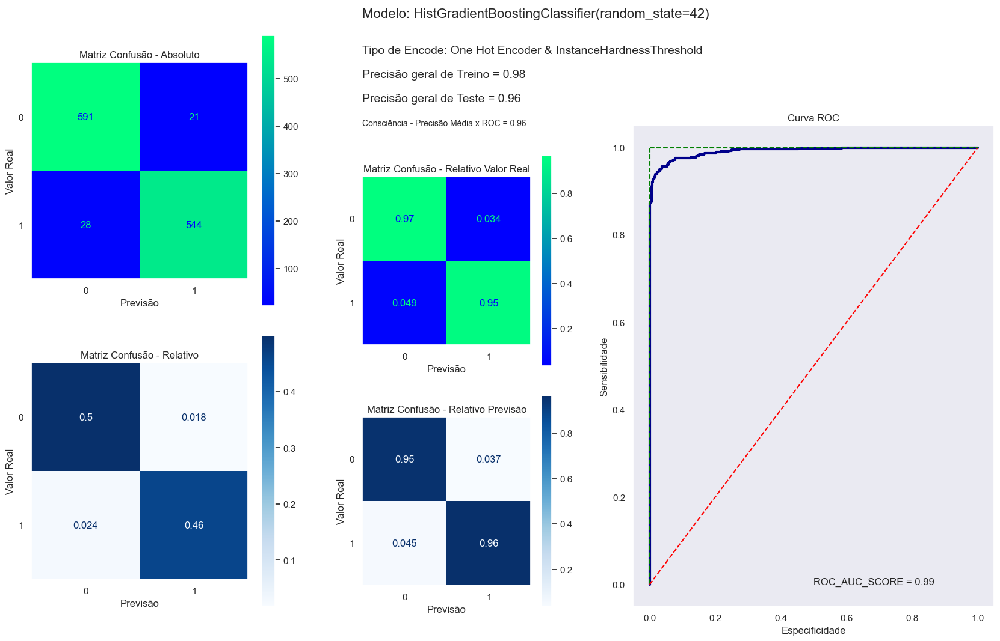

A Precisão Geral do HistGradientBoostingClassifier(random_state=42) com FreqRelativa foi de 95.91%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       578
           1       0.97      0.94      0.96       571

    accuracy                           0.96      1149
   macro avg       0.96      0.96      0.96      1149
weighted avg       0.96      0.96      0.96      1149



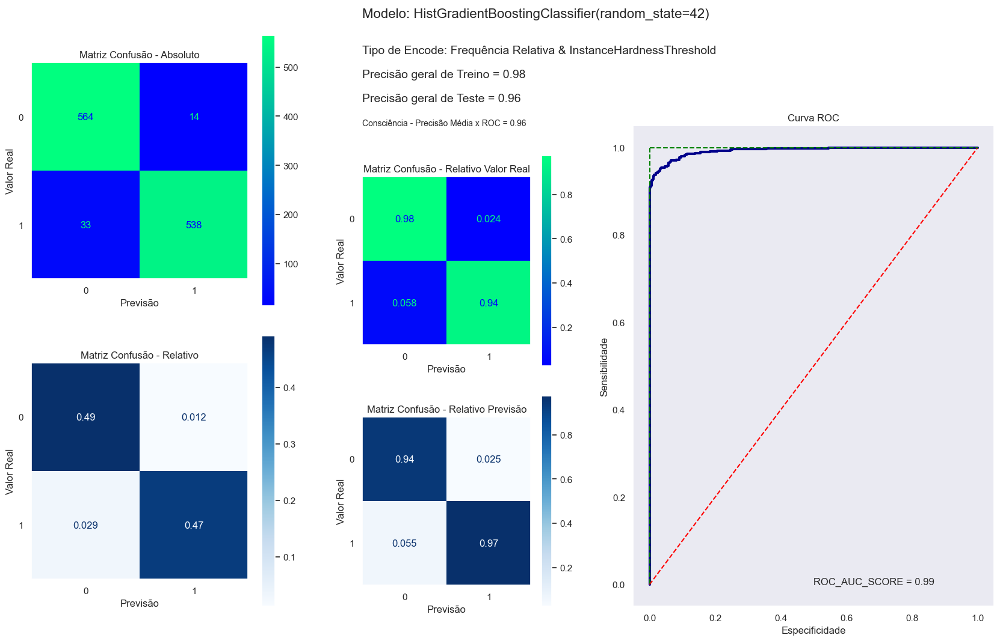

LogisticRegression(random_state=42)
A Precisão Geral do LogisticRegression(random_state=42) com OneHotEncode foi de 91.30%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.90      0.93      0.92       612
           1       0.93      0.89      0.91       572

    accuracy                           0.91      1184
   macro avg       0.91      0.91      0.91      1184
weighted avg       0.91      0.91      0.91      1184



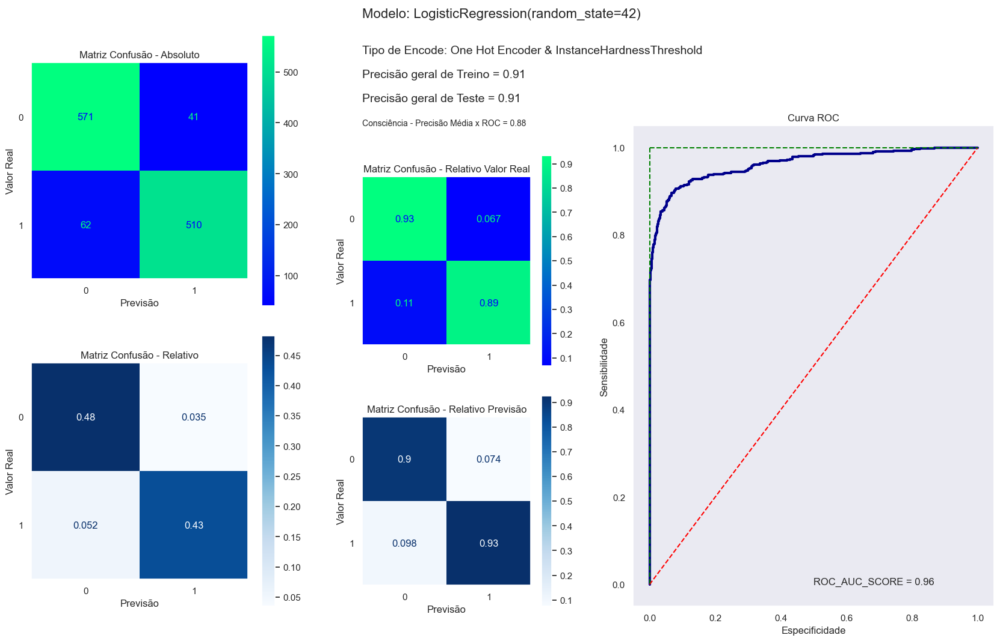

A Precisão Geral do LogisticRegression(random_state=42) com FreqRelativa foi de 90.60%: 
______________________________________________________________________
              precision    recall  f1-score   support

           0       0.89      0.93      0.91       578
           1       0.93      0.88      0.90       571

    accuracy                           0.91      1149
   macro avg       0.91      0.91      0.91      1149
weighted avg       0.91      0.91      0.91      1149



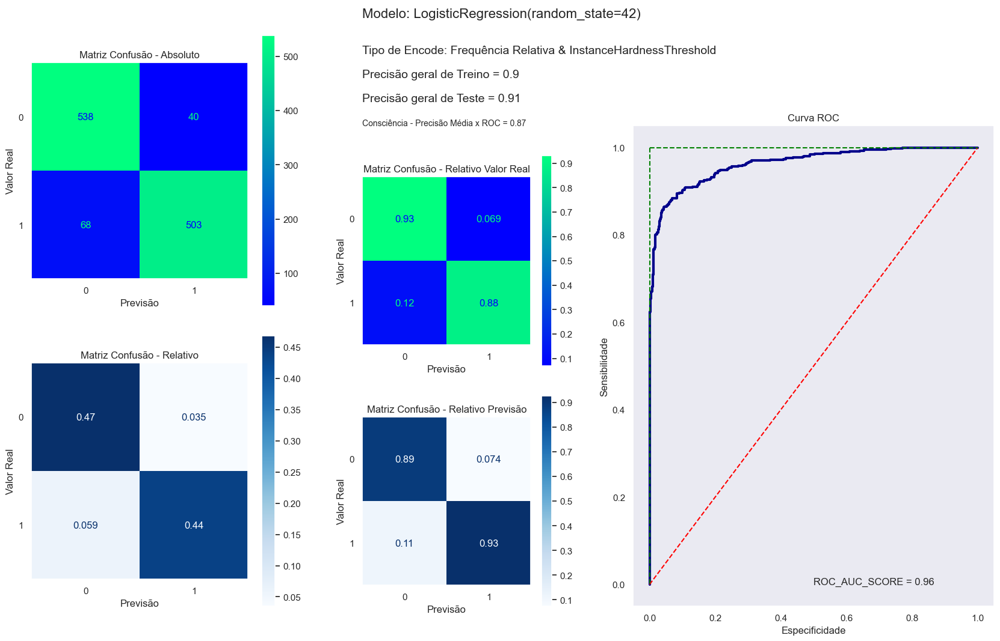

In [191]:
print('Treino com {} entradas.'.format(len(xe_iht_treino)))
print('Teste com {} registros.'.format(len(xe_iht_teste)))

for i in range(len(metodos)):
    print(70*'=')
    print(metodos[i])
    print(70*'=')

    escalador = StandardScaler()
    modo = metodos[i]
    
    escalador.fit(xe_iht_treino)
    x_treino = escalador.transform(xe_iht_treino)
    x_teste = escalador.transform(xe_iht_teste)

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(x_treino, ye_iht_treino)

    previsoes = modelo.predict(x_teste)

    acuracia1 = (accuracy_score(ye_iht_teste,previsoes))*100
    print('A Precisão Geral do '+ str(modo) +' com OneHotEncode foi de %.2f%%: ' % acuracia1)
    print('_'*70)
    print(classification_report(ye_iht_teste, previsoes))

    prob_previsao1 = modelo.predict_proba(x_teste)[:,1]
    relatorio_de_resultado(modo, x_treino, ye_iht_treino, x_teste, ye_iht_teste, modelo, previsoes, 'One Hot Encoder & InstanceHardnessThreshold')
    
    #Dados do dicionário de Resultados
    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_iht_teste, previsoes, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_iht_teste, previsoes, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(x_treino, ye_iht_treino),2) - round(modelo.score(x_teste, ye_iht_teste),2)
    consc1 = round((roc_auc_score(ye_iht_teste, prob_previsao1)*(modelo.score(x_treino, ye_iht_treino) + modelo.score(x_teste, ye_iht_teste))/2),2)


    escalador.fit(xf_iht_treino)
    x_treino = escalador.transform(xf_iht_treino)
    x_teste = escalador.transform(xf_iht_teste)

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(x_treino, yf_iht_treino)

    previsoes2 = modelo.predict(x_teste)

    acuracia2 = (accuracy_score(yf_iht_teste,previsoes2))*100
    print('A Precisão Geral do '+ str(modo) +' com FreqRelativa foi de %.2f%%: ' % acuracia2)
    print('_'*70)
    print(classification_report(yf_iht_teste, previsoes2))

    prob_previsao2 = modelo.predict_proba(x_teste)[:,1]
    relatorio_de_resultado(modo, x_treino, yf_iht_treino, x_teste, yf_iht_teste, modelo, previsoes2, 'Frequência Relativa & InstanceHardnessThreshold')

    
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_iht_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_iht_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(x_treino, yf_iht_treino),2) - round(modelo.score(x_teste, yf_iht_teste),2)
    consc2 = round((roc_auc_score(yf_iht_teste, prob_previsao2)*(modelo.score(x_treino, yf_iht_treino) + modelo.score(x_teste, yf_iht_teste))/2),2)

    pacote = resultado_testes_under
    dicionario_resultado = {str(modo): [acc1, vp1, vn1, tt1, consc1, acc2, vp2, vn2, tt2, consc2]}
    resultado_testes_under = {**pacote, **dicionario_resultado}

# Escolhendo o melhor modelo

A escolha do melhor modelo passa muito pelo que queremos do negócio,  pensando na matriz de confusão temos o seguinte:

| | Previsão = Adimplente | Previsão = Inadimplente |
|:-----:|:-----:|:-----:|
|Valor Real = Adimplente |Verdadeiro Negativo (VN)|Falso Positivo (FP)|
|Valor Real = inadimplente |Falso Negativo (FN)|Verdadeiro Positivo (VP)|

O VP e VN representam os negócios mais "seguros", ou seja, *emprestamos* onde o modelo diz que há maior probabilidade de Adimplência e *não emprestamos* onde diz que há maior probalidade de Inadimplência.


Nos Falsos Positivos **deixamos de emprestar** para alguem que possivelmente não reprentaria Inadimplência.

Nos Falsos Negativos **emprestamos** para alguém que representa um grande risco de inadimplência.

Assim buscamos os modelos com melhor capacidade de reconhecer VN e VP, mas com o melhor controle de FP e principalmente FN.


O Modelo escolhido precisa ter:
* Boa Precisão Geral
* Bom grau de consciência
* Ser capaz de manter o desempenho de treino no teste

In [192]:
pd.DataFrame(resultado_testes).transpose()

,0,1,2,3,4,5,6,7,8,9
classificador,Acc OneHotEncoder,Recall/OHE - VP,Recall/OHE - VN,OHE Acc Treino - Teste,OHE Consciência,Acc FreqRelativa,Recall/FR - VP,Recall/FR - VN,FR Acc Treino - Teste,FR Consciência
"DummyClassifier(random_state=42, strategy='stratified')",65.81,0.78,0.24,-0.01,0.33,65.81,0.78,0.24,-0.01,0.33
DummyClassifier(strategy='most_frequent'),77.66,1.0,0.0,0.0,0.39,77.66,1.0,0.0,0.0,0.39
RandomForestClassifier(random_state=42),93.31,0.99,0.73,0.07,0.9,93.27,0.99,0.73,0.07,0.9
BalancedRandomForestClassifier(random_state=42),90.02,0.93,0.8,0.08,0.88,90.26,0.93,0.79,0.08,0.88
DecisionTreeClassifier(random_state=42),88.15,0.91,0.77,0.12,0.79,89.59,0.93,0.79,0.1,0.81
GradientBoostingClassifier(random_state=42),92.33,0.98,0.71,0.0,0.86,92.53,0.98,0.72,-0.01,0.86
HistGradientBoostingClassifier(random_state=42),93.82,1.0,0.74,0.0,0.89,93.9,1.0,0.74,0.0,0.89
LogisticRegression(random_state=42),87.09,0.95,0.6,-0.01,0.76,86.85,0.95,0.58,-0.01,0.76


In [193]:
pd.DataFrame(resultado_testes_over).transpose()

,0,1,2,3,4,5,6,7,8,9
classificador,Acc OneHotEncoder,Recall/OHE - VP,Recall/OHE - VN,OHE Acc Treino - Teste,OHE Consciência,Acc FreqRelativa,Recall/FR - VP,Recall/FR - VN,FR Acc Treino - Teste,FR Consciência
RandomForestClassifier(random_state=42),96.07,0.99,0.93,0.04,0.97,96.22,0.99,0.94,0.04,0.97
BalancedRandomForestClassifier(random_state=42),96.17,0.99,0.93,0.04,0.97,96.09,0.99,0.93,0.04,0.97
DecisionTreeClassifier(random_state=42),93.0,0.92,0.94,0.07,0.9,93.52,0.92,0.95,0.06,0.9
GradientBoostingClassifier(random_state=42),94.91,0.97,0.92,-0.01,0.93,94.36,0.97,0.91,0.0,0.92
HistGradientBoostingClassifier(random_state=42),96.32,0.99,0.93,0.0,0.95,96.3,1.0,0.93,0.0,0.95
LogisticRegression(random_state=42),81.53,0.82,0.81,-0.01,0.72,81.23,0.82,0.81,0.0,0.72


In [194]:
pd.DataFrame(resultado_testes_under).transpose()

,0,1,2,3,4,5,6,7,8,9
classificador,Acc OneHotEncoder,Recall/OHE - VP,Recall/OHE - VN,OHE Acc Treino - Teste,OHE Consciência,Acc FreqRelativa,Recall/FR - VP,Recall/FR - VN,FR Acc Treino - Teste,FR Consciência
RandomForestClassifier(random_state=42),95.95,0.98,0.94,0.04,0.97,95.39,0.98,0.93,0.05,0.97
BalancedRandomForestClassifier(random_state=42),95.52,0.97,0.94,0.04,0.97,95.47,0.98,0.93,0.05,0.97
DecisionTreeClassifier(random_state=42),91.55,0.9,0.93,0.08,0.88,95.13,0.96,0.95,0.05,0.93
GradientBoostingClassifier(random_state=42),94.76,0.96,0.93,0.0,0.93,94.43,0.97,0.92,0.01,0.94
HistGradientBoostingClassifier(random_state=42),95.86,0.97,0.95,0.02,0.96,95.91,0.98,0.94,0.02,0.96
LogisticRegression(random_state=42),91.3,0.93,0.89,0.0,0.88,90.6,0.93,0.88,-0.01,0.87


## Conclusões 1


* Banco de dados Natural  

| Modelo | Tipo de Encode | Precisão Geral | Consciência | Mantem o desempenho no Teste |Comentários |
|:-----:|:-----:|:-----:|:-----:|:-----:|:-----:|
|HistGradientBoostingClassifier()|FR|93.9|0.89|Sim|O melhor modelo testado sem balanceamento|
|HistGradientBoostingClassifier()|OHE|93.82|0.89|Sim||

* Banco de dados sintético por inclusão (**SMOTE**)

| Modelo | Tipo de Encode | Precisão Geral | Consciência | Mantem o desempenho no Teste |Comentários |
|:-----:|:-----:|:-----:|:-----:|:-----:|:-----:|
|HistGradientBoostingClassifier()|OHE|96.32|0.95|Sim|O melhor modelo testado no geral|
|HistGradientBoostingClassifier()|FR|96.3|0.95|Sim||

* Banco de dados sintético por exclusão (**IHT**)

| Modelo | Tipo de Encode | Precisão Geral | Consciência | Mantem o desempenho no Teste |Comentários |
|:-----:|:-----:|:-----:|:-----:|:-----:|:-----:|
|RandomForestClassifier()|OHE|95.95|0.97|-4 p.p.|Apresenta uma boa relação de precisão e consciencia, mas perde um pouco de desempenho no teste, o que pode indicar um overfit do modelo|
|HistGradientBoostingClassifier()|FR|95.91|0.96|-2 p.p.||

### Resultados dos Teste

O HistGradientBoostingClassfier se mostrou mais estável ao longo dos teste com bom desempenho nos dois modelos de encode, muito próximos aliás, e também nos bancos de dados coletado e sintéticos, com leve vantagem para o SMOTE.

Como última ação vou testar os hiperparêmetros do modelo de classificação, com o Smote, em ambos os bancos de dados OHE e FR.

# **Aprendizado 05**
## O Que?
    Agora que foram testados os modelos e escolhido o "melhor candidato" precisamos "calibrar" o modelo para obter o melhor resultado.

## Por Quê?
    A aplicação dos classificadores possuem diversos parâmetros que permitem realizar alterações em como o classificador vai operar, esses parâmetros, também chamados hiperparâmetros, podem gerar alterações que promovam melhoria na assertividade do classificador.

## Como?
    Testaremos o HisGradientBoostingClassfier nos seguintes parâmetros:
    - max_iter: int = 100
    - max_depth: Any | None = None
    - learning_rate: float = 0.1
    - max_leaf_nodes: int = 31
    - min_samples_leaf: int = 20
    - max_bins: int = 255   

Os valores acima representam o "default" do classificador e serão mantidos sempre que justificável;


# TESTADO HIPERPARÂMETROS
Observanbdo os resultados iniciais perecebemos que o HistGradientBoostingClassifier() realmente parece ser a escolha mais acertada, existem alguns parâmetros que podem promover melhorias no modelo testaremos a seguir.

In [195]:
#Já temos definindo os bancos com SMOTE

#xe_sm_treino, xe_sm_teste, ye_sm_treino, ye_sm_teste = train_test_split(xe_sm, ye_sm, random_state=SEED, test_size=para_teste, stratify=ye_sm) # ONEHOTENCODER 
#xf_sm_treino, xf_sm_teste, yf_sm_treino, yf_sm_teste = train_test_split(xf_sm, yf_sm, random_state=SEED, test_size=para_teste, stratify=yf_sm) # FrequenciaRelativa 


### Verificação 1 - Vamos variar a Profundidade - max_depth

Será atribuida apenas uma SEED os outros parâmetros serão "default"

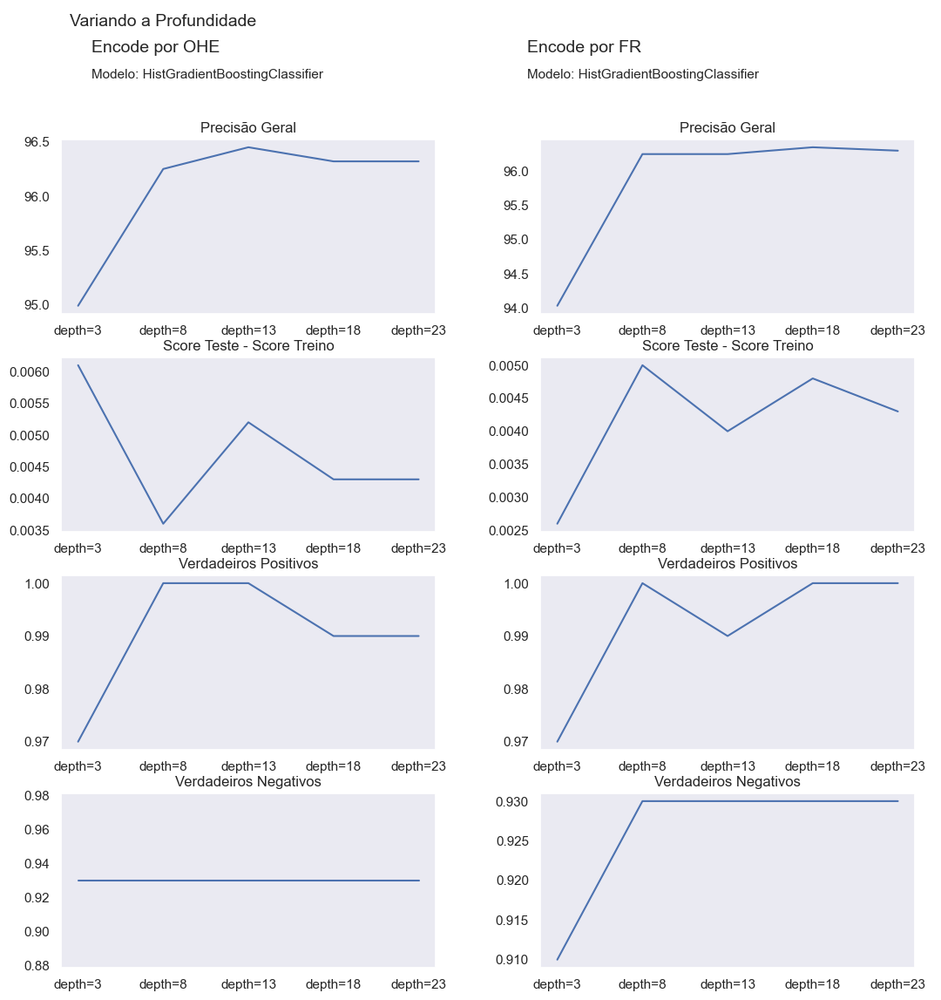

In [196]:
indice_teste1 = []
precisao_teste1 = []
verdadeiropositivo1 = []
verdadeironegativo1 = []
testeetreino1 = []

indice_teste2 = []
precisao_teste2 = []
verdadeiropositivo2 = []
verdadeironegativo2 = []
testeetreino2 = []

SEED = 42

escalador = StandardScaler()
        
escalador.fit(xe_sm_treino)
xe_h_treino = escalador.transform(xe_sm_treino)
xe_h_teste = escalador.transform(xe_sm_teste)

escalador.fit(xf_sm_treino)
xf_h_treino = escalador.transform(xf_sm_treino)
xf_h_teste = escalador.transform(xf_sm_teste)


for j in range(5):
    profundidade_teste = 5 * j + 3 

    modo = (HistGradientBoostingClassifier(max_depth=profundidade_teste, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xe_h_treino, ye_sm_treino)

    previsoes1 = modelo.predict(xe_h_teste)

    acuracia1 = (accuracy_score(ye_sm_teste,previsoes1))*100

    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(xe_h_teste, ye_sm_teste) - modelo.score(xe_h_treino, ye_sm_treino),4)

    indice_teste1 = indice_teste1 + [('depth='+str(profundidade_teste))]
    precisao_teste1 = precisao_teste1 + [acc1]
    verdadeiropositivo1 = verdadeiropositivo1 + [vp1]
    verdadeironegativo1 = verdadeironegativo1 + [vn1]
    testeetreino1 = testeetreino1 + [tt1]

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xf_h_treino, yf_sm_treino)

    previsoes2 = modelo.predict(xf_h_teste)

    acuracia2 = (accuracy_score(yf_sm_teste,previsoes2))*100
    
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(xf_h_teste, yf_sm_teste) - modelo.score(xf_h_treino, yf_sm_treino),4)
    
    indice_teste2 = indice_teste2 + [('depth='+str(profundidade_teste))]
    precisao_teste2 = precisao_teste2 + [acc2]
    verdadeiropositivo2 = verdadeiropositivo2 + [vp2]
    verdadeironegativo2 = verdadeironegativo2 + [vn2]
    testeetreino2 = testeetreino2 + [tt2]

    
fig1 = plt.figure(figsize=(10,10))

rt1 = fig1.add_axes([0,0.75,0.43,0.20])
rt2 = fig1.add_axes([0,0.5,0.43,0.20])
rt3 = fig1.add_axes([0,0.25,0.43,0.20])
rt4 = fig1.add_axes([0,0,0.43,0.20])
tit1 = fig1.add_axes([0,1,0.5,0.1])

rt5 = fig1.add_axes([0.55,0.75,0.43,0.20])
rt6 = fig1.add_axes([0.55,0.5,0.43,0.20])
rt7 = fig1.add_axes([0.55,0.25,0.43,0.20])
rt8 = fig1.add_axes([0.55,0,0.43,0.20])
tit2 = fig1.add_axes([0.5,1,0.5,0.1])

tit1.annotate('Variando a Profundidade', xy=[0.02,0.8], fontsize=14)
tit1.annotate('Encode por OHE', xy=[0.07,0.5], fontsize=14)
tit1.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit1.axis('off')

rt1.plot(indice_teste1, precisao_teste1)
rt1.set_title('Precisão Geral')

rt2.plot(indice_teste1, testeetreino1)
rt2.set_title('Score Teste - Score Treino')

rt3.plot(indice_teste1, verdadeiropositivo1)
rt3.set_title('Verdadeiros Positivos')

rt4.plot(indice_teste1, verdadeironegativo1)
rt4.set_title('Verdadeiros Negativos')

tit2.annotate('Encode por FR', xy=[0.07,0.5], fontsize=14)
tit2.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit2.axis('off')

rt5.plot(indice_teste2, precisao_teste2)
rt5.set_title('Precisão Geral')

rt6.plot(indice_teste2, testeetreino2)
rt6.set_title('Score Teste - Score Treino')

rt7.plot(indice_teste2, verdadeiropositivo2)
rt7.set_title('Verdadeiros Positivos')

rt8.plot(indice_teste2, verdadeironegativo2)
rt8.set_title('Verdadeiros Negativos')

fig1=fig1

Na Primeira Verificação podemos observar que a precisão aumenta se altera ao aumentarmos o "max_depth" para o OHE o pico de desempenho é em 13 e para o FR é em 18.

    Decisão 1:
    para OHE: "max_depht = 13"
    para FR: "max_depht = 18"

### Verificação 2 - Vamos variar agora o Máximo de interações - max_iter

OHE max_depht=13 e demais parâmetros "default"

FR max_depht=18 e demais parâmetros "default"

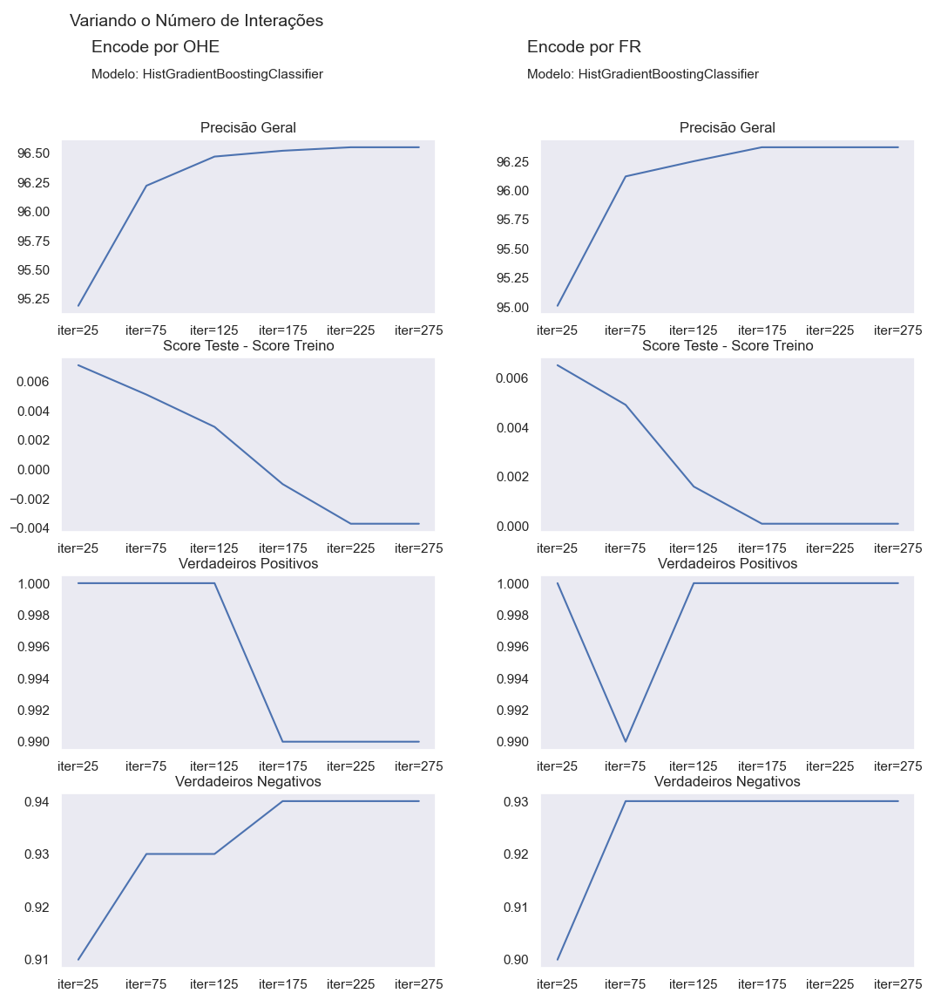

In [197]:
indice_teste1 = []
precisao_teste1 = []
verdadeiropositivo1 = []
verdadeironegativo1 = []
testeetreino1 = []

indice_teste2 = []
precisao_teste2 = []
verdadeiropositivo2 = []
verdadeironegativo2 = []
testeetreino2 = []

SEED = 42

escalador = StandardScaler()
        
escalador.fit(xe_sm_treino)
xe_h_treino = escalador.transform(xe_sm_treino)
xe_h_teste = escalador.transform(xe_sm_teste)

escalador.fit(xf_sm_treino)
xf_h_treino = escalador.transform(xf_sm_treino)
xf_h_teste = escalador.transform(xf_sm_teste)


for j in range(6):
    interacoes = 50 * j + 25 

    modo = (HistGradientBoostingClassifier(max_iter = interacoes, max_depth=13, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xe_h_treino, ye_sm_treino)

    previsoes1 = modelo.predict(xe_h_teste)

    acuracia1 = (accuracy_score(ye_sm_teste,previsoes1))*100

    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(xe_h_teste, ye_sm_teste) - modelo.score(xe_h_treino, ye_sm_treino),4)

    indice_teste1 = indice_teste1 + [('iter='+str(interacoes))]
    precisao_teste1 = precisao_teste1 + [acc1]
    verdadeiropositivo1 = verdadeiropositivo1 + [vp1]
    verdadeironegativo1 = verdadeironegativo1 + [vn1]
    testeetreino1 = testeetreino1 + [tt1]

    modo = (HistGradientBoostingClassifier(max_iter = interacoes, max_depth=18, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xf_h_treino, yf_sm_treino)

    previsoes2 = modelo.predict(xf_h_teste)

    acuracia2 = (accuracy_score(yf_sm_teste,previsoes2))*100
    
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(xf_h_teste, yf_sm_teste) - modelo.score(xf_h_treino, yf_sm_treino),4)
    
    indice_teste2 = indice_teste2 + [('iter='+str(interacoes))]
    precisao_teste2 = precisao_teste2 + [acc2]
    verdadeiropositivo2 = verdadeiropositivo2 + [vp2]
    verdadeironegativo2 = verdadeironegativo2 + [vn2]
    testeetreino2 = testeetreino2 + [tt2]

    
fig1 = plt.figure(figsize=(10,10))

rt1 = fig1.add_axes([0,0.75,0.43,0.20])
rt2 = fig1.add_axes([0,0.5,0.43,0.20])
rt3 = fig1.add_axes([0,0.25,0.43,0.20])
rt4 = fig1.add_axes([0,0,0.43,0.20])
tit1 = fig1.add_axes([0,1,0.5,0.1])

rt5 = fig1.add_axes([0.55,0.75,0.43,0.20])
rt6 = fig1.add_axes([0.55,0.5,0.43,0.20])
rt7 = fig1.add_axes([0.55,0.25,0.43,0.20])
rt8 = fig1.add_axes([0.55,0,0.43,0.20])
tit2 = fig1.add_axes([0.5,1,0.5,0.1])

tit1.annotate('Variando o Número de Interações', xy=[0.02,0.8], fontsize=14)
tit1.annotate('Encode por OHE', xy=[0.07,0.5], fontsize=14)
tit1.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit1.axis('off')

rt1.plot(indice_teste1, precisao_teste1)
rt1.set_title('Precisão Geral')

rt2.plot(indice_teste1, testeetreino1)
rt2.set_title('Score Teste - Score Treino')

rt3.plot(indice_teste1, verdadeiropositivo1)
rt3.set_title('Verdadeiros Positivos')

rt4.plot(indice_teste1, verdadeironegativo1)
rt4.set_title('Verdadeiros Negativos')

tit2.annotate('Encode por FR', xy=[0.07,0.5], fontsize=14)
tit2.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit2.axis('off')

rt5.plot(indice_teste2, precisao_teste2)
rt5.set_title('Precisão Geral')

rt6.plot(indice_teste2, testeetreino2)
rt6.set_title('Score Teste - Score Treino')

rt7.plot(indice_teste2, verdadeiropositivo2)
rt7.set_title('Verdadeiros Positivos')

rt8.plot(indice_teste2, verdadeironegativo2)
rt8.set_title('Verdadeiros Negativos')

fig1=fig1

Na Segunda Verificação podemos observar que a precisão aumenta até aumentarmos o "max_iter" até, mais ou menos, 200 e estabiliza. Há uma variação de cerca de 1 ponto percentual, para menos, na relação teste e treino, e a perca de um ponto percentual nos verdadeiros positivos é compensada com o acrescimo de 3 pontos nos verdadeiros negativos. Os picos são levemente diferentes em 225 para o OHE e 175 para o FR.

    Decisão 1 
    PARA OHE "max_iter = 225"
    PARA FR "max_iter = 175"

### Verificação 3 - O learning_rate padrão é 0.1 - vamos verificar se a sua alteração pode promover alguma melhoria.

OHE (max_depht= 13, max_iter=225)

FR (max_depht= 18, max_iter=175)

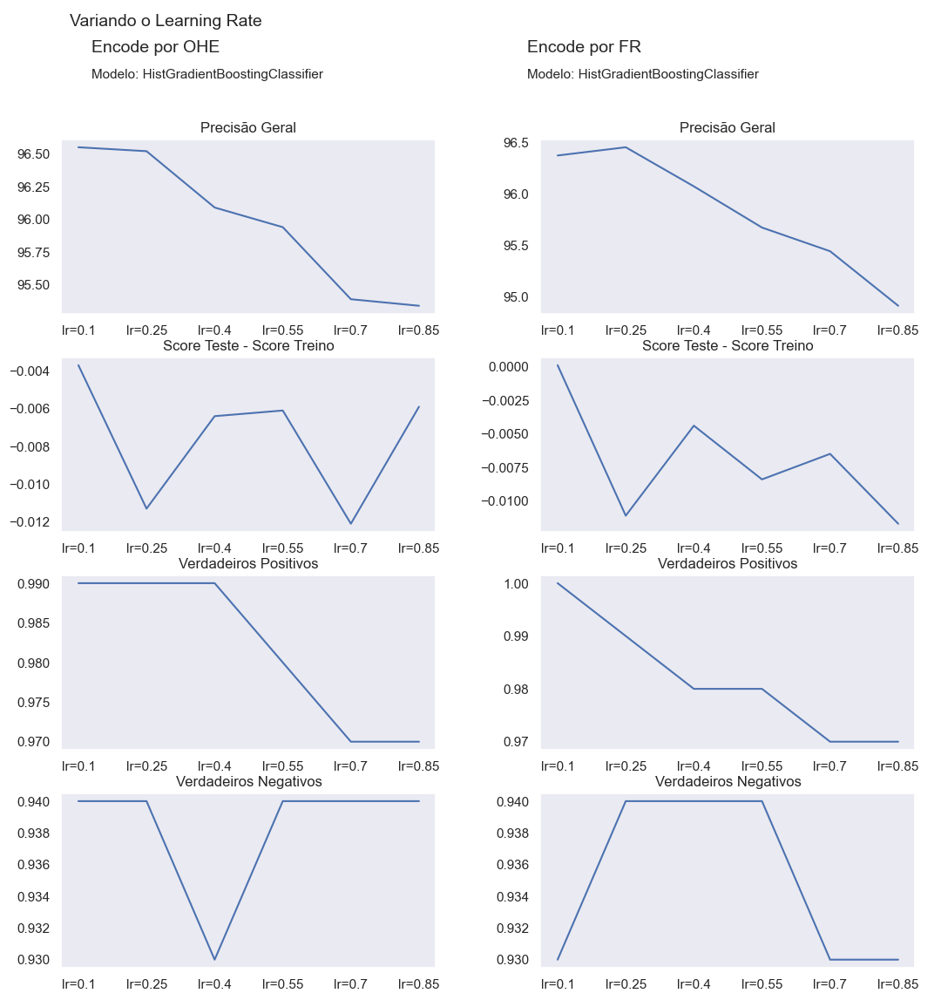

In [212]:
indice_teste1 = []
precisao_teste1 = []
verdadeiropositivo1 = []
verdadeironegativo1 = []
testeetreino1 = []

indice_teste2 = []
precisao_teste2 = []
verdadeiropositivo2 = []
verdadeironegativo2 = []
testeetreino2 = []

SEED = 42

escalador = StandardScaler()
        
escalador.fit(xe_sm_treino)
xe_h_treino = escalador.transform(xe_sm_treino)
xe_h_teste = escalador.transform(xe_sm_teste)

escalador.fit(xf_sm_treino)
xf_h_treino = escalador.transform(xf_sm_treino)
xf_h_teste = escalador.transform(xf_sm_teste)


for j in range(6):
    l_rate = round(0.15*j+0.1,2) 

    modo = (HistGradientBoostingClassifier(learning_rate=l_rate, max_iter = 225, max_depth=13, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xe_h_treino, ye_sm_treino)

    previsoes1 = modelo.predict(xe_h_teste)

    acuracia1 = (accuracy_score(ye_sm_teste,previsoes1))*100

    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(xe_h_teste, ye_sm_teste) - modelo.score(xe_h_treino, ye_sm_treino),4)

    indice_teste1 = indice_teste1 + [('lr='+str(l_rate))]
    precisao_teste1 = precisao_teste1 + [acc1]
    verdadeiropositivo1 = verdadeiropositivo1 + [vp1]
    verdadeironegativo1 = verdadeironegativo1 + [vn1]
    testeetreino1 = testeetreino1 + [tt1]

    modo = (HistGradientBoostingClassifier(learning_rate=l_rate, max_iter = 175, max_depth=18, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xf_h_treino, yf_sm_treino)

    previsoes2 = modelo.predict(xf_h_teste)

    acuracia2 = (accuracy_score(yf_sm_teste,previsoes2))*100
    
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(xf_h_teste, yf_sm_teste) - modelo.score(xf_h_treino, yf_sm_treino),4)
    
    indice_teste2 = indice_teste2 + [('lr='+str(l_rate))]
    precisao_teste2 = precisao_teste2 + [acc2]
    verdadeiropositivo2 = verdadeiropositivo2 + [vp2]
    verdadeironegativo2 = verdadeironegativo2 + [vn2]
    testeetreino2 = testeetreino2 + [tt2]

    
fig1 = plt.figure(figsize=(10,10))

rt1 = fig1.add_axes([0,0.75,0.43,0.20])
rt2 = fig1.add_axes([0,0.5,0.43,0.20])
rt3 = fig1.add_axes([0,0.25,0.43,0.20])
rt4 = fig1.add_axes([0,0,0.43,0.20])
tit1 = fig1.add_axes([0,1,0.5,0.1])

rt5 = fig1.add_axes([0.55,0.75,0.43,0.20])
rt6 = fig1.add_axes([0.55,0.5,0.43,0.20])
rt7 = fig1.add_axes([0.55,0.25,0.43,0.20])
rt8 = fig1.add_axes([0.55,0,0.43,0.20])
tit2 = fig1.add_axes([0.5,1,0.5,0.1])

tit1.annotate('Variando o Learning Rate', xy=[0.02,0.8], fontsize=14)
tit1.annotate('Encode por OHE', xy=[0.07,0.5], fontsize=14)
tit1.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit1.axis('off')

rt1.plot(indice_teste1, precisao_teste1)
rt1.set_title('Precisão Geral')

rt2.plot(indice_teste1, testeetreino1)
rt2.set_title('Score Teste - Score Treino')

rt3.plot(indice_teste1, verdadeiropositivo1)
rt3.set_title('Verdadeiros Positivos')

rt4.plot(indice_teste1, verdadeironegativo1)
rt4.set_title('Verdadeiros Negativos')

tit2.annotate('Encode por FR', xy=[0.07,0.5], fontsize=14)
tit2.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit2.axis('off')

rt5.plot(indice_teste2, precisao_teste2)
rt5.set_title('Precisão Geral')

rt6.plot(indice_teste2, testeetreino2)
rt6.set_title('Score Teste - Score Treino')

rt7.plot(indice_teste2, verdadeiropositivo2)
rt7.set_title('Verdadeiros Positivos')

rt8.plot(indice_teste2, verdadeironegativo2)
rt8.set_title('Verdadeiros Negativos')

fig1=fig1

De modo geral perdemos precisão e não há melhora significativa do modelo para OHE, para FR há uma pequena melhora com 0.25.

    Decisão 3
    OHE - manter "learning_rate = 0.1" default
    FR - "learning_rate = 0.25"

### Verificação 4 - O bins padrão é 255 , que também é o máximo- vamos verificar se a sua redução pode promover alguma melhoria.

OHE (max_depht= 13, max_iter= 225)

FR (max_depht= 18, max_iter= 175, learning_rate= 0.25)

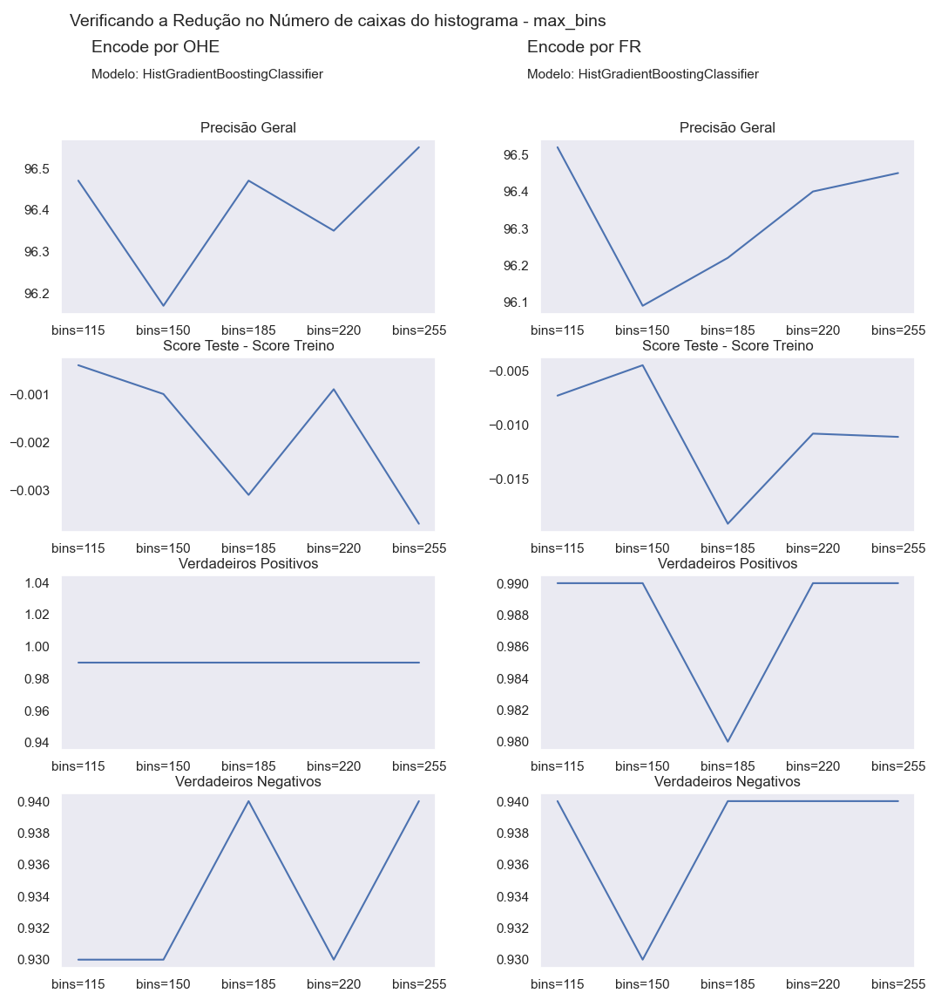

In [199]:
indice_teste1 = []
precisao_teste1 = []
verdadeiropositivo1 = []
verdadeironegativo1 = []
testeetreino1 = []

indice_teste2 = []
precisao_teste2 = []
verdadeiropositivo2 = []
verdadeironegativo2 = []
testeetreino2 = []

SEED = 42

escalador = StandardScaler()
        
escalador.fit(xe_sm_treino)
xe_h_treino = escalador.transform(xe_sm_treino)
xe_h_teste = escalador.transform(xe_sm_teste)

escalador.fit(xf_sm_treino)
xf_h_treino = escalador.transform(xf_sm_treino)
xf_h_teste = escalador.transform(xf_sm_teste)


for j in range(5):
    bins = 115+j*35

    modo = (HistGradientBoostingClassifier(max_bins=bins, max_iter = 225, max_depth=13, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xe_h_treino, ye_sm_treino)

    previsoes1 = modelo.predict(xe_h_teste)

    acuracia1 = (accuracy_score(ye_sm_teste,previsoes1))*100

    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(xe_h_teste, ye_sm_teste) - modelo.score(xe_h_treino, ye_sm_treino),4)

    indice_teste1 = indice_teste1 + [('bins='+str(bins))]
    precisao_teste1 = precisao_teste1 + [acc1]
    verdadeiropositivo1 = verdadeiropositivo1 + [vp1]
    verdadeironegativo1 = verdadeironegativo1 + [vn1]
    testeetreino1 = testeetreino1 + [tt1]

    modo = (HistGradientBoostingClassifier(max_bins= bins, learning_rate=0.25, max_iter = 175, max_depth=18, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xf_h_treino, yf_sm_treino)

    previsoes2 = modelo.predict(xf_h_teste)

    acuracia2 = (accuracy_score(yf_sm_teste,previsoes2))*100
    
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(xf_h_teste, yf_sm_teste) - modelo.score(xf_h_treino, yf_sm_treino),4)
    
    indice_teste2 = indice_teste2 + [('bins='+str(bins))]
    precisao_teste2 = precisao_teste2 + [acc2]
    verdadeiropositivo2 = verdadeiropositivo2 + [vp2]
    verdadeironegativo2 = verdadeironegativo2 + [vn2]
    testeetreino2 = testeetreino2 + [tt2]

    
fig1 = plt.figure(figsize=(10,10))

rt1 = fig1.add_axes([0,0.75,0.43,0.20])
rt2 = fig1.add_axes([0,0.5,0.43,0.20])
rt3 = fig1.add_axes([0,0.25,0.43,0.20])
rt4 = fig1.add_axes([0,0,0.43,0.20])
tit1 = fig1.add_axes([0,1,0.5,0.1])

rt5 = fig1.add_axes([0.55,0.75,0.43,0.20])
rt6 = fig1.add_axes([0.55,0.5,0.43,0.20])
rt7 = fig1.add_axes([0.55,0.25,0.43,0.20])
rt8 = fig1.add_axes([0.55,0,0.43,0.20])
tit2 = fig1.add_axes([0.5,1,0.5,0.1])

tit1.annotate('Verificando a Redução no Número de caixas do histograma - max_bins', xy=[0.02,0.8], fontsize=14)
tit1.annotate('Encode por OHE', xy=[0.07,0.5], fontsize=14)
tit1.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit1.axis('off')

rt1.plot(indice_teste1, precisao_teste1)
rt1.set_title('Precisão Geral')

rt2.plot(indice_teste1, testeetreino1)
rt2.set_title('Score Teste - Score Treino')

rt3.plot(indice_teste1, verdadeiropositivo1)
rt3.set_title('Verdadeiros Positivos')

rt4.plot(indice_teste1, verdadeironegativo1)
rt4.set_title('Verdadeiros Negativos')

tit2.annotate('Encode por FR', xy=[0.07,0.5], fontsize=14)
tit2.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit2.axis('off')

rt5.plot(indice_teste2, precisao_teste2)
rt5.set_title('Precisão Geral')

rt6.plot(indice_teste2, testeetreino2)
rt6.set_title('Score Teste - Score Treino')

rt7.plot(indice_teste2, verdadeiropositivo2)
rt7.set_title('Verdadeiros Positivos')

rt8.plot(indice_teste2, verdadeironegativo2)
rt8.set_title('Verdadeiros Negativos')

fig1=fig1

As variações do máximo de 255 "bins" não provome grandes alterações mas para o FR há um pico em 115, no OHE é o padrão.

    Decisão 4
    OHE - manter "max_bins = 255" default
    
    FR = "max_bins = 115"

### Verificação 5 - O max_leaf_nodes padrão é 31 - máximo de folhas por nó - vamos verificar se a sua alteração pode promover alguma melhoria.

OHE (max_depht= 13, max_iter= 225)

FR (max_depht= 18, max_iter= 175, learning_rate= 0.25, max_bins=115)

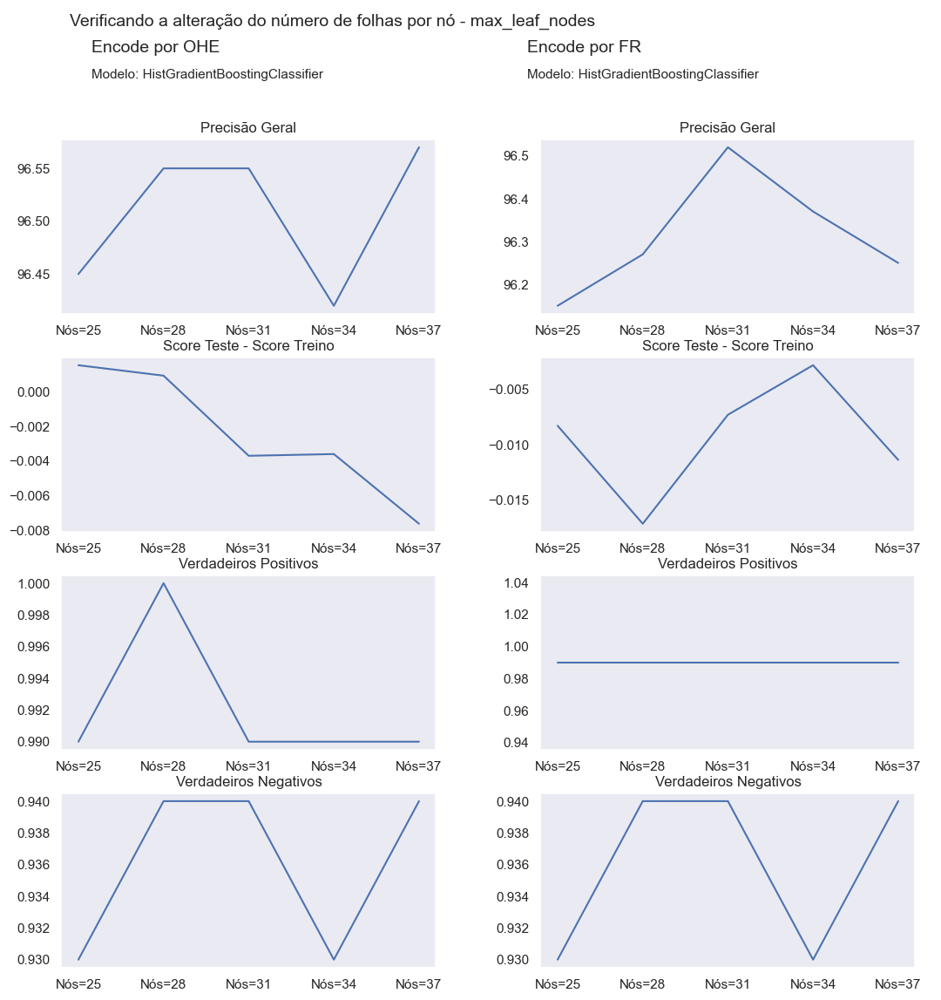

In [200]:
indice_teste1 = []
precisao_teste1 = []
verdadeiropositivo1 = []
verdadeironegativo1 = []
testeetreino1 = []

indice_teste2 = []
precisao_teste2 = []
verdadeiropositivo2 = []
verdadeironegativo2 = []
testeetreino2 = []

SEED = 42

escalador = StandardScaler()
        
escalador.fit(xe_sm_treino)
xe_h_treino = escalador.transform(xe_sm_treino)
xe_h_teste = escalador.transform(xe_sm_teste)

escalador.fit(xf_sm_treino)
xf_h_treino = escalador.transform(xf_sm_treino)
xf_h_teste = escalador.transform(xf_sm_teste)


for j in range(5):
    nos =  25 + 3 * j

    modo = (HistGradientBoostingClassifier(max_leaf_nodes = nos, max_iter = 225, max_depth=13, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xe_h_treino, ye_sm_treino)

    previsoes1 = modelo.predict(xe_h_teste)

    acuracia1 = (accuracy_score(ye_sm_teste,previsoes1))*100

    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(xe_h_teste, ye_sm_teste) - modelo.score(xe_h_treino, ye_sm_treino),4)

    indice_teste1 = indice_teste1 + [('Nós='+str(nos))]
    precisao_teste1 = precisao_teste1 + [acc1]
    verdadeiropositivo1 = verdadeiropositivo1 + [vp1]
    verdadeironegativo1 = verdadeironegativo1 + [vn1]
    testeetreino1 = testeetreino1 + [tt1]

    modo = (HistGradientBoostingClassifier(max_leaf_nodes = nos, max_bins= 115, learning_rate=0.25, max_iter = 175, max_depth=18, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xf_h_treino, yf_sm_treino)

    previsoes2 = modelo.predict(xf_h_teste)

    acuracia2 = (accuracy_score(yf_sm_teste,previsoes2))*100
    
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(xf_h_teste, yf_sm_teste) - modelo.score(xf_h_treino, yf_sm_treino),4)
    
    indice_teste2 = indice_teste2 + [('Nós='+str(nos))]
    precisao_teste2 = precisao_teste2 + [acc2]
    verdadeiropositivo2 = verdadeiropositivo2 + [vp2]
    verdadeironegativo2 = verdadeironegativo2 + [vn2]
    testeetreino2 = testeetreino2 + [tt2]

    
fig1 = plt.figure(figsize=(10,10))

rt1 = fig1.add_axes([0,0.75,0.43,0.20])
rt2 = fig1.add_axes([0,0.5,0.43,0.20])
rt3 = fig1.add_axes([0,0.25,0.43,0.20])
rt4 = fig1.add_axes([0,0,0.43,0.20])
tit1 = fig1.add_axes([0,1,0.5,0.1])

rt5 = fig1.add_axes([0.55,0.75,0.43,0.20])
rt6 = fig1.add_axes([0.55,0.5,0.43,0.20])
rt7 = fig1.add_axes([0.55,0.25,0.43,0.20])
rt8 = fig1.add_axes([0.55,0,0.43,0.20])
tit2 = fig1.add_axes([0.5,1,0.5,0.1])

tit1.annotate('Verificando a alteração do número de folhas por nó - max_leaf_nodes', xy=[0.02,0.8], fontsize=14)
tit1.annotate('Encode por OHE', xy=[0.07,0.5], fontsize=14)
tit1.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit1.axis('off')

rt1.plot(indice_teste1, precisao_teste1)
rt1.set_title('Precisão Geral')

rt2.plot(indice_teste1, testeetreino1)
rt2.set_title('Score Teste - Score Treino')

rt3.plot(indice_teste1, verdadeiropositivo1)
rt3.set_title('Verdadeiros Positivos')

rt4.plot(indice_teste1, verdadeironegativo1)
rt4.set_title('Verdadeiros Negativos')

tit2.annotate('Encode por FR', xy=[0.07,0.5], fontsize=14)
tit2.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit2.axis('off')

rt5.plot(indice_teste2, precisao_teste2)
rt5.set_title('Precisão Geral')

rt6.plot(indice_teste2, testeetreino2)
rt6.set_title('Score Teste - Score Treino')

rt7.plot(indice_teste2, verdadeiropositivo2)
rt7.set_title('Verdadeiros Positivos')

rt8.plot(indice_teste2, verdadeironegativo2)
rt8.set_title('Verdadeiros Negativos')

fig1=fig1

Novamente, de modo geral perdemos não há melhora significativa do modelo com a alteração de 31 "Folhas por Nós, mas para o OHE há um pico em 37".

    Decisão 5
    OHE - "max_leaf_nodes = 37"

    FR - manter "max_leaf_nodes = 31" default

### Verificação 6 - O min_samples_leaf padrão é 20 - minimo de amostras por folha - vamos verificar se a sua alteração pode promover alguma melhoria.

OHE (max_depht= 13, max_iter= 225, max_leaf_nodes = 37)

FR (max_depht= 18, max_iter= 175, learning_rate= 0.25, max_bins=115)




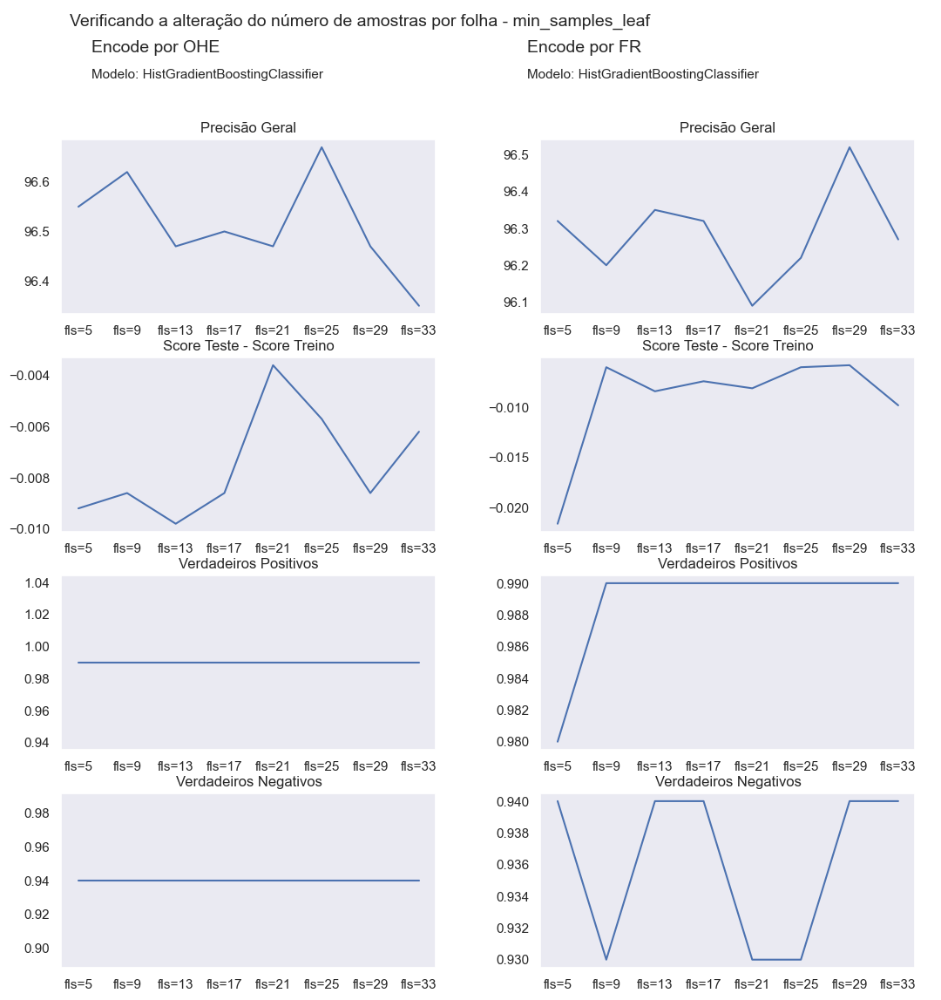

In [201]:
indice_teste1 = []
precisao_teste1 = []
verdadeiropositivo1 = []
verdadeironegativo1 = []
testeetreino1 = []

indice_teste2 = []
precisao_teste2 = []
verdadeiropositivo2 = []
verdadeironegativo2 = []
testeetreino2 = []

SEED = 42

escalador = StandardScaler()
        
escalador.fit(xe_sm_treino)
xe_h_treino = escalador.transform(xe_sm_treino)
xe_h_teste = escalador.transform(xe_sm_teste)

escalador.fit(xf_sm_treino)
xf_h_treino = escalador.transform(xf_sm_treino)
xf_h_teste = escalador.transform(xf_sm_teste)


for j in range(8):
    folha =  5 + 4 * j

    modo = (HistGradientBoostingClassifier(min_samples_leaf = folha, max_leaf_nodes = 37, max_iter = 225, max_depth=13, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xe_h_treino, ye_sm_treino)

    previsoes1 = modelo.predict(xe_h_teste)

    acuracia1 = (accuracy_score(ye_sm_teste,previsoes1))*100

    acc1 = round(acuracia1, 2) #Acc OneHotEncoder
    vp1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[0][0],2)#Recall/OHE - VP
    vn1 = round(confusion_matrix(ye_sm_teste, previsoes1, normalize='true')[1][1],2)#Recall/OHE - VN
    tt1 = round(modelo.score(xe_h_teste, ye_sm_teste) - modelo.score(xe_h_treino, ye_sm_treino),4)

    indice_teste1 = indice_teste1 + [('fls='+str(folha))]
    precisao_teste1 = precisao_teste1 + [acc1]
    verdadeiropositivo1 = verdadeiropositivo1 + [vp1]
    verdadeironegativo1 = verdadeironegativo1 + [vn1]
    testeetreino1 = testeetreino1 + [tt1]

    modo = (HistGradientBoostingClassifier(min_samples_leaf = folha, max_bins= 115, learning_rate=0.25, max_iter = 175, max_depth=18, random_state=SEED))

    modelo = Pipeline([('estimador', modo)])
    modelo.fit(xf_h_treino, yf_sm_treino)

    previsoes2 = modelo.predict(xf_h_teste)

    acuracia2 = (accuracy_score(yf_sm_teste,previsoes2))*100
    
    acc2 = round(acuracia2, 2) # Acc FreqRelativa
    vp2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[0][0],2)# Recall/FR - VP
    vn2 = round(confusion_matrix(yf_sm_teste, previsoes2, normalize='true')[1][1],2)# Recall/FR - VN
    tt2 = round(modelo.score(xf_h_teste, yf_sm_teste) - modelo.score(xf_h_treino, yf_sm_treino),4)
    
    indice_teste2 = indice_teste2 + [('fls='+str(folha))]
    precisao_teste2 = precisao_teste2 + [acc2]
    verdadeiropositivo2 = verdadeiropositivo2 + [vp2]
    verdadeironegativo2 = verdadeironegativo2 + [vn2]
    testeetreino2 = testeetreino2 + [tt2]

    
fig1 = plt.figure(figsize=(10,10))

rt1 = fig1.add_axes([0,0.75,0.43,0.20])
rt2 = fig1.add_axes([0,0.5,0.43,0.20])
rt3 = fig1.add_axes([0,0.25,0.43,0.20])
rt4 = fig1.add_axes([0,0,0.43,0.20])
tit1 = fig1.add_axes([0,1,0.5,0.1])

rt5 = fig1.add_axes([0.55,0.75,0.43,0.20])
rt6 = fig1.add_axes([0.55,0.5,0.43,0.20])
rt7 = fig1.add_axes([0.55,0.25,0.43,0.20])
rt8 = fig1.add_axes([0.55,0,0.43,0.20])
tit2 = fig1.add_axes([0.5,1,0.5,0.1])

tit1.annotate('Verificando a alteração do número de amostras por folha - min_samples_leaf', xy=[0.02,0.8], fontsize=14)
tit1.annotate('Encode por OHE', xy=[0.07,0.5], fontsize=14)
tit1.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit1.axis('off')

rt1.plot(indice_teste1, precisao_teste1)
rt1.set_title('Precisão Geral')

rt2.plot(indice_teste1, testeetreino1)
rt2.set_title('Score Teste - Score Treino')

rt3.plot(indice_teste1, verdadeiropositivo1)
rt3.set_title('Verdadeiros Positivos')

rt4.plot(indice_teste1, verdadeironegativo1)
rt4.set_title('Verdadeiros Negativos')

tit2.annotate('Encode por FR', xy=[0.07,0.5], fontsize=14)
tit2.annotate('Modelo: HistGradientBoostingClassifier', xy=[0.07,0.2], fontsize=11)
tit2.axis('off')

rt5.plot(indice_teste2, precisao_teste2)
rt5.set_title('Precisão Geral')

rt6.plot(indice_teste2, testeetreino2)
rt6.set_title('Score Teste - Score Treino')

rt7.plot(indice_teste2, verdadeiropositivo2)
rt7.set_title('Verdadeiros Positivos')

rt8.plot(indice_teste2, verdadeironegativo2)
rt8.set_title('Verdadeiros Negativos')

fig1=fig1

Há pequenas alterações, mas o melhor valor para a precisão para o OHE é 25 e para o FR 29.
    
    Decisão 6
    OHE - "min_samples_leaf = 25"

    FR - "min_samples_leaf = 29"

# Decisão Final

Rodar os dois modelos, com OHE e FR, e escolher o melhor:

* Oversampling com SMOTE

#### OHE - HistGradientBoostingClassifier(min_samples_leaf = 25, max_leaf_nodes = 37, max_iter = 225, max_depth=13, random_state=SEED)

#### FR - HistGradientBoostingClassifier(min_samples_leaf = 29, max_bins= 115, learning_rate=0.25, max_iter = 175, max_depth=18, random_state=SEED)


Teste Final - Smote e One Hot Encoder
HistGradientBoostingClassifier(min_samples_leaf = 25, max_leaf_nodes = 37, max_iter = 225, max_depth=13, random_state=SEED)
A Precisão Geral foi de 96.67%: 
_______________________________________________________________________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.94      0.99      0.97      1985
         1.0       0.99      0.94      0.97      1984

    accuracy                           0.97      3969
   macro avg       0.97      0.97      0.97      3969
weighted avg       0.97      0.97      0.97      3969



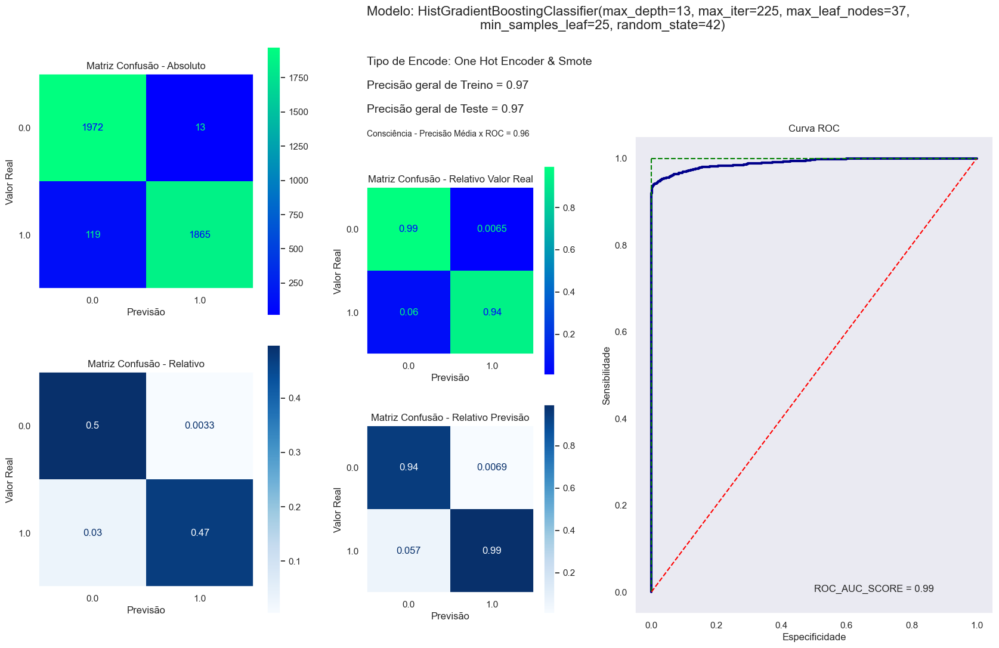

In [202]:
print(122*'=')
print('Teste Final - Smote e One Hot Encoder')
print(122*'=')
print('HistGradientBoostingClassifier(min_samples_leaf = 25, max_leaf_nodes = 37, max_iter = 225, max_depth=13, random_state=SEED)')
print(122*'=')

escalador = StandardScaler()
modo = HistGradientBoostingClassifier(min_samples_leaf = 25, max_leaf_nodes = 37, max_iter = 225, max_depth=13, random_state=SEED)

escalador.fit(xe_sm_treino)
x_treino = escalador.transform(xe_sm_treino)
x_teste = escalador.transform(xe_sm_teste)

modelo = Pipeline([('estimador', modo)])
modelo.fit(x_treino, ye_sm_treino)

previsoes = modelo.predict(x_teste)

acuracia1 = (accuracy_score(ye_sm_teste,previsoes))*100
print('A Precisão Geral foi de %.2f%%: ' % acuracia1)
print('_'*127)
print(classification_report(ye_sm_teste, previsoes))

relatorio_de_resultado(modo, x_treino, ye_sm_treino, x_teste, ye_sm_teste, modelo, previsoes, 'One Hot Encoder & Smote')


Teste Final - Smote e Frequência Relativa
HistGradientBoostingClassifier(min_samples_leaf = 29, max_bins= 115, learning_rate=0.25, max_iter = 175, max_depth=18, random_state=SEED)
A Precisão Geral foi de 96.52%: 
_______________________________________________________________________________________________________________________________
              precision    recall  f1-score   support

           0       0.94      0.99      0.97      1985
           1       0.99      0.94      0.96      1984

    accuracy                           0.97      3969
   macro avg       0.97      0.97      0.97      3969
weighted avg       0.97      0.97      0.97      3969



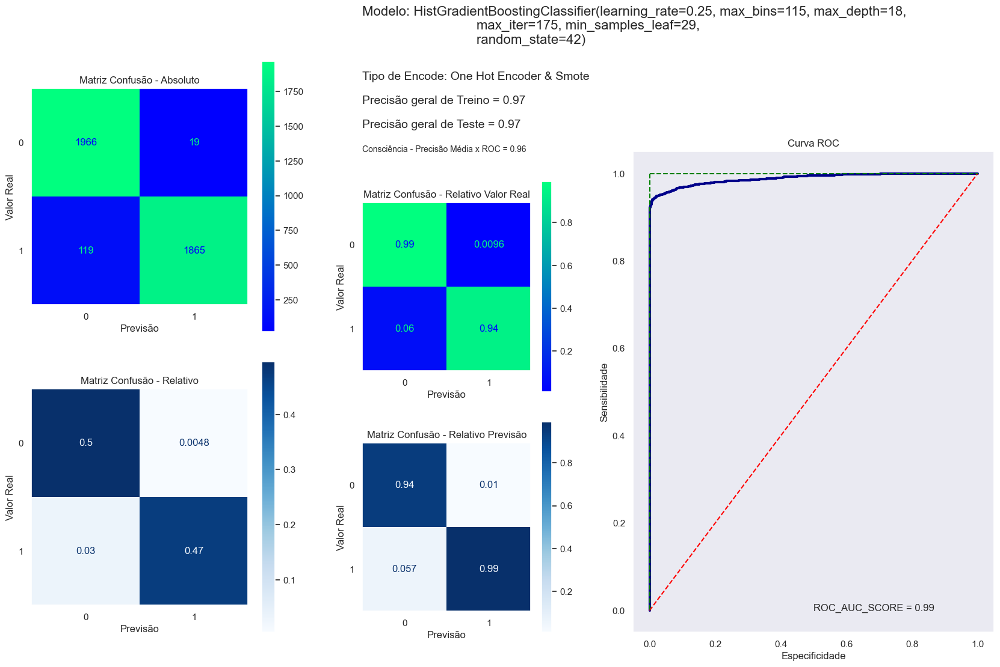

In [203]:
print(122*'=')
print('Teste Final - Smote e Frequência Relativa')
print(122*'=')
print('HistGradientBoostingClassifier(min_samples_leaf = 29, max_bins= 115, learning_rate=0.25, max_iter = 175, max_depth=18, random_state=SEED)')
print(122*'=')

escalador = StandardScaler()
modo = HistGradientBoostingClassifier(min_samples_leaf = 29, max_bins= 115, learning_rate=0.25, max_iter = 175, max_depth=18, random_state=SEED)

escalador.fit(xf_sm_treino)
x_treino = escalador.transform(xf_sm_treino)
x_teste = escalador.transform(xf_sm_teste)

modelo = Pipeline([('estimador', modo)])
modelo.fit(x_treino, yf_sm_treino)

previsoes = modelo.predict(x_teste)

acuracia1 = (accuracy_score(yf_sm_teste,previsoes))*100
print('A Precisão Geral foi de %.2f%%: ' % acuracia1)
print('_'*127)
print(classification_report(yf_sm_teste, previsoes))

relatorio_de_resultado(modo, x_treino, yf_sm_treino, x_teste, yf_sm_teste, modelo, previsoes, 'One Hot Encoder & Smote')


## Decisão Final: 

#### Encode:    OneHotEncoder
#### Oversampling:  Smote
#### Classificador:     HistGradientBoostingClassifier
#### Hiperparâmetros: (min_samples_leaf = 25, max_leaf_nodes = 37, max_iter = 225, max_depth=13)


# **Aprendizado 06** 
## O Que?
    Por Fim! Podemos treinar o modelo com o banco de dados inteiro e salvar uma aplicação para que possa receber os dados de um novo "contrato" e predizer se representa uma possibilidade de inadimplência ou não.
## Por Quê?
    Agora que separamos as bases de teste e treino, e definimos os melhores "caminhos" podemos utilizar o banco inteiro como treino, dessa forma teremos mais dados para treinar o que acaba por calibrar melhor o modelo. Salvar o modelo permite chamar a aplicação em outras instancias permitindo a integração do modelo ao Power BI (como proposto no desafio);
## Como?
    Repetindo os passos anteriores (Smote, Scaler e fit do modelo com os parâmetros estabelecidos)
    Para guardar a aplicação utilizaremos o picklel e para a aplicação o FastAPI.
    


In [204]:
#Bibliotecas utilizadas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder

from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, ConfusionMatrixDisplay, roc_curve, roc_auc_score

import pickle as pk

In [205]:
#Banco de Dados
AluraCash = pd.read_csv('DADOS_DO_SQL/TABELA_UNIFICADA_V2.csv')

In [206]:
#Remoção de outliers
AluraCash_out3=AluraCash[~(
 (AluraCash.IDADE>(2.5*AluraCash.IDADE.quantile(0.75)-1.5*AluraCash.IDADE.quantile(0.25))) |
 (AluraCash.RENDA_ANUAL>(2.5*AluraCash.RENDA_ANUAL.quantile(0.75)-1.5*AluraCash.RENDA_ANUAL.quantile(0.25))) |
 (AluraCash.TEMPO_DE_SERVICO>(2.5*AluraCash.TEMPO_DE_SERVICO.quantile(0.75)-1.5*AluraCash.TEMPO_DE_SERVICO.quantile(0.25))) |
 (AluraCash.HISTORICO_DE_CREDITO>20))]

In [207]:
#Guardar o Banco de dados para agilizar as ações posteriores.
AluraCash_out3.to_csv('DADOS/AluraCash_out3.csv',sep= ";" ,index=False, encoding='utf-8')

In [208]:
#Para facilitar o relatório de cada teste será exibido através da função descrita a seguir:

def relatorio_de_resultado(modelo, x_treino, y_treino, x_teste, y_teste, pipeline, previsoes, encode):
    
    A, L = (10,15)
    
    fig = plt.figure(figsize=(L,A))
    mc1 = fig.add_axes([0,5/10,45/150,45/100])
    mc2 = fig.add_axes([0,0,45/150,45/100])
    mc3 = fig.add_axes([55/150,2/5,35/150,35/100])
    mc4 = fig.add_axes([55/150,0,35/150,35/100])

    roc = fig.add_axes([10/15,0,6/15,8/10])
        
    tabela = fig.add_axes([55/150,8/10,10/15,2/10])
        

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, ax=mc1, cmap='winter')
    mc1.set_title('Matriz Confusão - Absoluto')
    mc1.set_xlabel('Previsão')
    mc1.set_ylabel('Valor Real')

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, normalize='all', ax=mc2, cmap='Blues')
    mc2.set_title('Matriz Confusão - Relativo')
    mc2.set_xlabel('Previsão')
    mc2.set_ylabel('Valor Real')

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, normalize='true', ax=mc3, cmap='winter')
    mc3.set_title('Matriz Confusão - Relativo Valor Real')
    mc3.set_xlabel('Previsão')
    mc3.set_ylabel('Valor Real')

    ConfusionMatrixDisplay.from_predictions(y_teste, previsoes, normalize='pred', ax=mc4, cmap='Blues')
    mc4.set_title('Matriz Confusão - Relativo Previsão')
    mc4.set_xlabel('Previsão')
    mc4.set_ylabel('Valor Real')

    prob_previsao = modelo.predict_proba(x_teste)[:,1]

    #tfp = Taxa de Falsos Positivo
    #tvp = Taxa de Verdadeiro Positivo
    tfp, tvp, limite = roc_curve(y_teste, prob_previsao)

    roc.set_title('Curva ROC')
    roc.plot(tfp,tvp, linewidth=3, color='darkblue')
    roc.set_xlabel('Especificidade')
    roc.set_ylabel('Sensibilidade')
    roc.plot([0,1], ls='--', c='red') #diagonal
    roc.plot([0,0], [1,0], ls='--', c='green') #vertival em x=0
    roc.plot([1,1], ls='--', c='green') #horizontal em y=1
    roc.annotate('ROC_AUC_SCORE = '+str(round(roc_auc_score(y_teste, prob_previsao),2)),xy=[0.5,0])
        
        
    tabela.annotate('Modelo: '+ str(modelo), xy=[0,0.9], fontsize=16)
    tabela.annotate('Tipo de Encode: '+ encode ,xy=[0,0.6], fontsize=14)
    tabela.annotate('Precisão geral de Treino = '+str(round(pipeline.score(x_treino, y_treino),2)),xy=[0,0.4], fontsize=14)
    tabela.annotate('Precisão geral de Teste = '+str(round(pipeline.score(x_teste, y_teste),2)),xy=[0,0.2], fontsize=14)
    tabela.annotate('Consciência - Precisão Média x ROC = ' + str(round((roc_auc_score(y_teste, prob_previsao)*(pipeline.score(x_treino, y_treino) + pipeline.score(x_teste, y_teste))/2),2)),xy=[0,0], fontsize=10)
    tabela.axis('off')

    plt.show()

In [209]:
#Banco de Dados
AluraCash = pd.read_csv('DADOS/AluraCash_out3.csv', sep=';')

#Encode das Variáveis Categóricas
var_categoricas = AluraCash.select_dtypes('object').columns

one_hot_enc = make_column_transformer(
    (OneHotEncoder(handle_unknown = 'ignore'),
    var_categoricas),
    remainder='passthrough')

AluraCash_encode_0 = one_hot_enc.fit_transform(AluraCash)
AluraCash_encode_0 = pd.DataFrame(AluraCash_encode_0, columns=one_hot_enc.get_feature_names_out())

#Gravando o processo de encoding
encode = open('PROCESSOS/one_hot_enc', 'wb')
pk.dump(one_hot_enc, encode)
encode.close()

A Precisão Geral do HistGradientBoostingClassifier(max_depth=13, max_iter=225, max_leaf_nodes=37,
                               min_samples_leaf=25, random_state=42) com OneHotEncode foi de 97.18%: 
______________________________________________________________________
              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97     19842
         1.0       1.00      0.94      0.97     19842

    accuracy                           0.97     39684
   macro avg       0.97      0.97      0.97     39684
weighted avg       0.97      0.97      0.97     39684



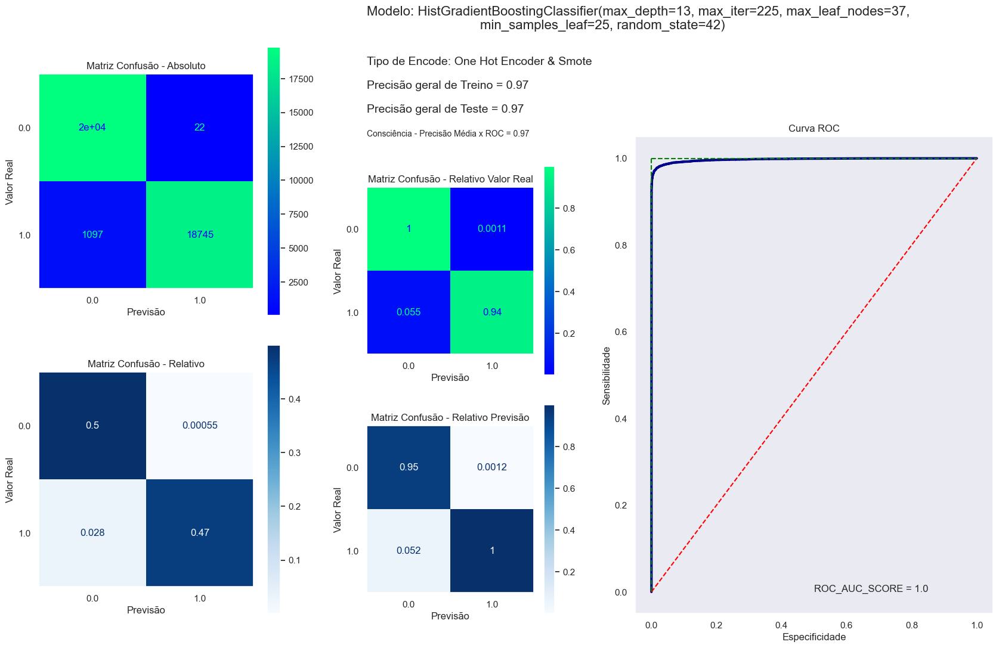

In [210]:
#Renomear as colunas do Encode
novas_colunas = {'remainder__IDADE': 'IDADE' ,
    'remainder__RENDA_ANUAL': 'RENDA_ANUAL',
    'remainder__TEMPO_DE_SERVICO':'TEMPO_DE_SERVICO' ,
    'remainder__VALOR_EMPRESTIMO':'VALOR_EMPRESTIMO',
    'remainder__TAXA_DE_JUROS':'TAXA_DE_JUROS',
    'remainder__SITUACAO_INADIMPLENCIA': 'SITUACAO_INADIMPLENCIA',
    'remainder__COMPROMETIMENTO_DA_RENDA':'COMPROMETIMENTO_DA_RENDA',
    'remainder__HISTORICO_DE_CREDITO':'HISTORICO_DE_CREDITO',
    'onehotencoder__MORADIA_alugada' : 'OHE_M_alugada',
    'onehotencoder__MORADIA_hipoteca': 'OHE_M_hipoteca',
    'onehotencoder__MORADIA_outro': 'OHE_M_outro',
    'onehotencoder__MORADIA_propria': 'OHE_M_propria',
    'onehotencoder__MOTIVO_EMPRESTIMO_educacao' : 'OHE_ME_educacao',
    'onehotencoder__MOTIVO_EMPRESTIMO_empreendimento': 'OHE_ME_empreendimento',
    'onehotencoder__MOTIVO_EMPRESTIMO_quitacao_debitos': 'OHE_ME_quitacao_debitos',
    'onehotencoder__MOTIVO_EMPRESTIMO_reforma': 'OHE_ME_reforma',
    'onehotencoder__MOTIVO_EMPRESTIMO_saude': 'OHE_ME_saude',
    'onehotencoder__MOTIVO_EMPRESTIMO_uso_pessoal': 'OHE_ME_uso_pessoal',
    'onehotencoder__SCORE_CREDITO_A': 'OHE_SC_A',
    'onehotencoder__SCORE_CREDITO_B': 'OHE_SC_B',
    'onehotencoder__SCORE_CREDITO_C': 'OHE_SC_C',
    'onehotencoder__SCORE_CREDITO_D': 'OHE_SC_D',
    'onehotencoder__SCORE_CREDITO_E': 'OHE_SC_E',
    'onehotencoder__SCORE_CREDITO_F': 'OHE_SC_F',
    'onehotencoder__SCORE_CREDITO_G': 'OHE_SC_G',
    'onehotencoder__HISTORICO_DE_INADIMPLENCIA_n': 'OHE_HI_n',
    'onehotencoder__HISTORICO_DE_INADIMPLENCIA_s': 'OHE_HI_s',
}
AluraCash_encode_0 = AluraCash_encode_0.rename(columns=novas_colunas)

# Separação da Variável Alvo (ye) e das features (xe)
xe = AluraCash_encode_0.drop(columns = ['SITUACAO_INADIMPLENCIA'])
ye = AluraCash_encode_0['SITUACAO_INADIMPLENCIA']

# Aplicando o Smote para balancear e incluir as amostras sintéticas
sm = SMOTE(sampling_strategy=1 ,random_state=42)
xe_sm, ye_sm = sm.fit_resample(xe, ye)

SEED = 42

escalador = StandardScaler()
escalador.fit(xe_sm)
x_treino = escalador.transform(xe_sm)

#Gravar o escalador
escalar = open('PROCESSOS/escalador', 'wb')
pk.dump(escalador, escalar)
escalar.close()

modo = HistGradientBoostingClassifier(max_leaf_nodes = 37, max_depth=13, max_iter=225, min_samples_leaf=25, random_state=SEED)
modelo = Pipeline([('estimador', modo)])
modelo.fit(x_treino, ye_sm)


#Gravar o pipeline Classificador
classificar =  open('PROCESSOS/modelo', 'wb')
pk.dump(modelo, classificar)
classificar.close()

previsoes = modelo.predict(x_treino)

acuracia1 = (accuracy_score(ye_sm,previsoes))*100
print('A Precisão Geral do '+ str(modo) +' com OneHotEncode foi de %.2f%%: ' % acuracia1)
print('_'*70)
print(classification_report(ye_sm, previsoes))

relatorio_de_resultado(modo, x_treino, ye_sm, x_treino, ye_sm, modelo, previsoes, 'One Hot Encoder & Smote')